# Exploratory Data Analysis (EDA) and Machine Learning Approaches for Mobile Specifications Dataset:

![Housing Image](https://5.imimg.com/data5/SELLER/Default/2021/9/HR/PW/SE/32162519/vivo-mobile-phone-1000x1000.png)

# By clicking on the steps below, you will be redirected to the corresponding sections of the analysis:

[ **1 ) Importing the Modules and Loading the Dataset**](#content1)

[ **2 )  Checking Missing Values & Duplicate values**](#content2)

[ **3 ) Data Preprocessing**](#content3)

[ **4 ) Univariate Analysis**](#content4)

[ **5 ) Bivariant analysis**](#content5)

[ **6 ) Multivariant analysis**](#content6)

[ **7 )  Outlier Detection and Treatment**](#content7)

[ **8 ) Feature Engineering**](#content8)

[ **9 )  Performing Model evaluation and accuracy assessment in machine learning**](#content9)

[ **10 )  Feature Importance Analysis**](#content10)

<a id="content1"></a>
## 1 ) Importing the Modules and Loading the Dataset

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
import numpy as np
import warnings
warnings.filterwarnings("ignore")
import math
import squarify
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor

### Excel file loaction path

In [2]:
file_path= r"d:\Users\Admin\Downloads\Processed_Flipdata.xlsx"

### Importing Excel file into Pandas dataframe.

In [3]:
mobile_data = pd.read_excel(file_path)

## Data information

In [4]:
# first 5 rows
mobile_data.head()

,Unnamed: 0,Model,Colour,Memory,RAM,Battery_,Rear Camera,Front Camera,AI Lens,Mobile Height,Processor_,Prize
0,0,Infinix SMART 7,Night Black,64,4,6000,13MP,5MP,1,16.76,Unisoc Spreadtrum SC9863A1,7299
1,1,Infinix SMART 7,Azure Blue,64,4,6000,13MP,5MP,1,16.76,Unisoc Spreadtrum SC9863A1,7299
2,2,MOTOROLA G32,Mineral Gray,128,8,5000,50MP,16MP,0,16.64,Qualcomm Snapdragon 680,11999
3,3,POCO C50,Royal Blue,32,2,5000,8MP,5MP,0,16.56,Mediatek Helio A22,5649
4,4,Infinix HOT 30i,Marigold,128,8,5000,50MP,5MP,1,16.76,G37,8999


In [5]:
# Last 5 Rows of the data
mobile_data.tail()

,Unnamed: 0,Model,Colour,Memory,RAM,Battery_,Rear Camera,Front Camera,AI Lens,Mobile Height,Processor_,Prize
536,637,SAMSUNG Galaxy S23 5G,Cream,256,8,3900,50MP,12MP,0,15.49,Qualcomm Snapdragon 8 Gen 2,79999
537,638,LAVA Z21,Cyan,32,2,3100,5MP,2MP,0,12.70,Octa Core,5998
538,639,Tecno Spark 8T,Turquoise Cyan,64,4,5000,50MP,8MP,0,16.76,MediaTek Helio G35,9990
539,641,SAMSUNG Galaxy A54 5G,Awesome Lime,128,8,5000,50MP,32MP,0,16.26,"Exynos 1380, Octa Core",38999
540,642,OPPO A77,Sky Blue,128,4,5000,50MP,8MP,0,16.66,Mediatek Helio G35,15999


# Lets Check the shape of Dataset:

In [6]:
print(mobile_data.shape)
print(f'Total Rows = {mobile_data.shape[0]}\nTotol Columns={mobile_data.shape[1]} ')

(541, 12)
Total Rows = 541
Totol Columns=12 


## Understanding the Dataset Dimensions
**From the output of mobile_data.shape, we observe:**

- Total Rows: 541 (indicating 541 mobile phone records)
- Total Columns: 12 (indicating 12 different attributes describing each mobile phone)

# Checking Statistic of the data

In [7]:
mobile_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,541.0,289.711645,182.359185,0.0,135.00,273.00,434.00,642.00
Memory,541.0,110.550832,60.600694,16.0,64.00,128.00,128.00,256.00
RAM,541.0,5.397412,1.984923,2.0,4.00,6.00,8.00,8.00
Battery_,541.0,4871.587800,780.148862,800.0,5000.00,5000.00,5000.00,7000.00
AI Lens,541.0,0.062847,0.242911,0.0,0.00,0.00,0.00,1.00
Mobile Height,541.0,16.431201,2.523553,4.5,16.51,16.71,16.94,41.94
Prize,541.0,16228.375231,10793.588322,920.0,9290.00,13499.00,19280.00,80999.00


# Key Insights from the Statistic Data
**1. Memory (Storage Capacity)**
- Average storage capacity is 110.55 GB, with a minimum of 16 GB and a maximum of 256 GB.
- Most common storage sizes (percentiles) are 64GB and 128GB, suggesting mid-range devices dominate.
  
**2.  RAM (Device Performance)**
- The average RAM is 5.4 GB, with a minimum of 2GB and a maximum of 8GB.
- Most devices have 4GB to 8GB RAM, indicating mid-range to high-performance models.
  
**3.  Battery Capacity**
- The mean battery capacity is 4,871 mAh, with a minimum of 800 mAh and a maximum of 7,000 mAh.
- Most phones have a 5,000 mAh battery, suggesting long battery life is a priority.
  
**4.   AI Lens Presence**
- The mean value of 0.06 suggests that only a small percentage (around 6%) of phones have an AI lens.
- Majority of devices do not include AI lens technology.

**5.  Mobile Height**
- The average phone height is 16.43 cm, with a minimum of 4.5 cm and a maximum of 41.94 cm.
- A height of 16.5 - 17 cm is the most common, which aligns with typical smartphone sizes.
  
**6. Mobile Price (Prize)**
- The average price is ₹16,228, but the standard deviation is quite high (₹10,793), indicating a wide range of mobile prices.
- Prices range from ₹920 (budget phones) to ₹80,999 (premium flagship models).
- The median price is ₹13,499, suggesting that most phones fall in the mid-range category.

# Checking the datatypes, non null values

In [8]:
mobile_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541 entries, 0 to 540
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     541 non-null    int64  
 1   Model          541 non-null    object 
 2   Colour         541 non-null    object 
 3   Memory         541 non-null    int64  
 4   RAM            541 non-null    int64  
 5   Battery_       541 non-null    int64  
 6   Rear Camera    541 non-null    object 
 7   Front Camera   541 non-null    object 
 8   AI Lens        541 non-null    int64  
 9   Mobile Height  541 non-null    float64
 10  Processor_     541 non-null    object 
 11  Prize          541 non-null    int64  
dtypes: float64(1), int64(6), object(5)
memory usage: 50.8+ KB


# Key Insights from the Dataset
**1. Data Composition**
- The dataset contains a mix of numerical (7) and categorical (5) features.
- Numerical Features: Memory, RAM, Battery Capacity, AI Lens, Mobile Height, and Price.
- Categorical Features: Model, Colour, Rear Camera, Front Camera, and Processor.

**2. Storage & Performance**
- Memory (Storage) and RAM are both integer values, meaning they are recorded as discrete quantities.
- Memory capacity varies across different models, with possible values like 64GB, 128GB, and 256GB.
- RAM follows a similar trend, ranging from lower-end (2GB) to higher-end (8GB) models.
  
**3. Battery & Mobile Height**
- Battery capacity is numerical, indicating the dataset tracks different battery sizes for each model.
- Mobile Height is a float value, meaning precise measurements are recorded, likely representing phone dimensions.

**4. Camera Specifications**
- Both Rear Camera and Front Camera are stored as objects (strings), suggesting they may contain multiple values (e.g., "48MP + 8MP" for dual cameras).
- These fields might need data cleaning or transformation to extract numeric megapixels for analysis.

**5. AI Lens Feature**
- The AI Lens column is binary (0 or 1), indicating whether the phone has AI camera features or not.
  
**6. Processor & Model Information**
- The Processor_ column is categorical, likely containing different chipsets (e.g., Snapdragon, MediaTek, Exynos).
- Model and Colour are categorical, representing different phone variants.
  
**7. Price Distribution**
- The Price (Prize) column is numerical, meaning we can analyze price trends across different features.

<b id="content2"></b>
## 2 )  Checking Missing Values & Duplicate values

### Checking Missing values in data set

In [9]:
# Checking missing values.
mobile_data.isna().sum()

Unnamed: 0       0
Model            0
Colour           0
Memory           0
RAM              0
Battery_         0
Rear Camera      0
Front Camera     0
AI Lens          0
Mobile Height    0
Processor_       0
Prize            0
dtype: int64

Text(0.5, 1.0, ' Visualising Missing Values')

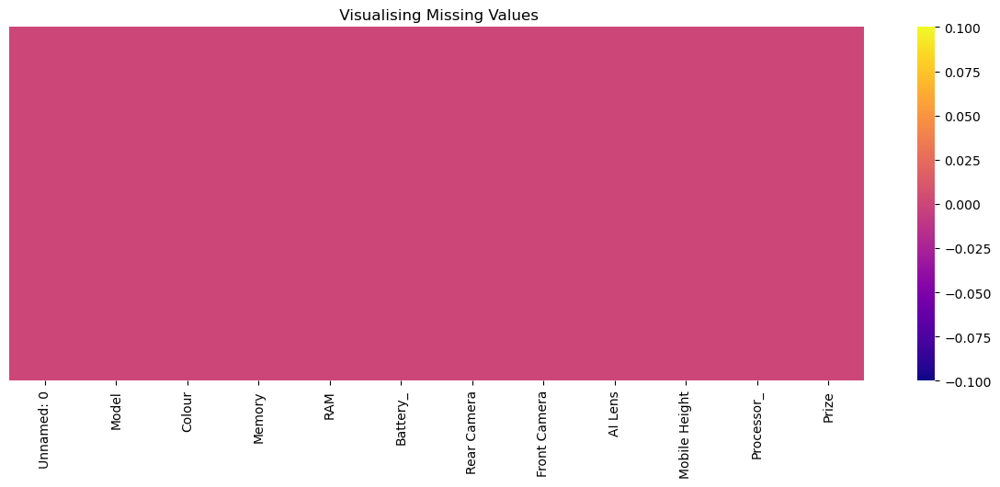

In [10]:
# Visulaizing null values using heatmap.
plt.figure(figsize=(15,5))
sns.heatmap(mobile_data.isnull(),cmap='plasma',annot=False,yticklabels=False)
plt.title(" Visualising Missing Values")

**No Null values found. Which is good thing for us.**




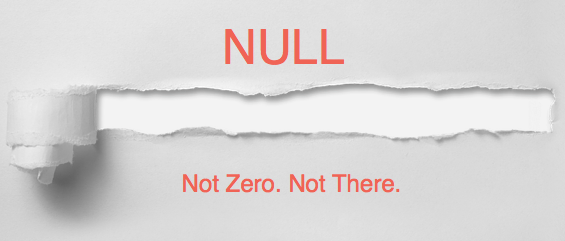

# Insights from Missing Values Analysis
**1. No Missing Values Found**
- The heatmap visualization confirms that all features are fully populated with no null values in the dataset.
- This is beneficial because we don’t need to handle missing data through imputation or row removal.

**2. Data Consistency & Completeness**
- Since there are no missing values, we can directly proceed with analysis without preprocessing gaps.
- Ensures better model performance as missing values won’t cause errors in training or inference.

# Checking Duplicate values in data set

In [11]:
print(f' We have {mobile_data.duplicated().sum()} duplicate values in dataset.')

 We have 0 duplicate values in dataset.


# Insights for Duplicate Values Analysis
**1. No Duplicate Entries Found**
- The dataset contains 0 duplicate records, ensuring data integrity.
- No need for data cleaning related to duplicate removal.
  
**2. Data Uniqueness is Maintained**
- Each row represents a unique mobile device, preventing bias or redundancy in model training.
- Confirms data accuracy and reliability.

<b id="content3"></b>
## 3 )  Data Preprocessing 

## Model,Brand and Series Extraction from Model Names and changing their dtypes

In [12]:
# Convert 'Model' column to string (to avoid errors if there are NaN or numeric values)
mobile_data['Model'] = mobile_data['Model'].astype(str)

# Split 'Model' into 'Brand' and 'Series' and replace the original column
mobile_data[['Brand', 'Series']] = mobile_data['Model'].str.split(' ', n=1, expand=True)

# Display the modified DataFrame
print(mobile_data)


     Unnamed: 0                  Model          Colour  Memory  RAM  Battery_  \
0             0        Infinix SMART 7     Night Black      64    4      6000   
1             1        Infinix SMART 7      Azure Blue      64    4      6000   
2             2           MOTOROLA G32    Mineral Gray     128    8      5000   
3             3               POCO C50      Royal Blue      32    2      5000   
4             4        Infinix HOT 30i        Marigold     128    8      5000   
..          ...                    ...             ...     ...  ...       ...   
536         637  SAMSUNG Galaxy S23 5G           Cream     256    8      3900   
537         638               LAVA Z21            Cyan      32    2      3100   
538         639         Tecno Spark 8T  Turquoise Cyan      64    4      5000   
539         641  SAMSUNG Galaxy A54 5G    Awesome Lime     128    8      5000   
540         642               OPPO A77        Sky Blue     128    4      5000   

    Rear Camera Front Camer

# Brand and Series Extraction from Model Names
**1. Successful Splitting of Model Names**
- The Model column was split into two new columns:
- Brand → Manufacturer of the mobile device.
- Series → Specific model line or variant.

**2. Enhanced Data Structure**
- Separating Brand allows better grouping and analysis of manufacturers.
- The Series column provides insights into different product lineups within a brand.
  

# EXtracting color column 

In [13]:
# Convert 'Colour' column to string (to avoid errors if there are NaN or numeric values)
mobile_data['Colour'] = mobile_data['Colour'].astype(str)

# Split 'Model' into 'Brand' and 'Series' and replace the original column
mobile_data[['Colour', 'Mobile_colour']] = mobile_data['Colour'].str.split(' ', n=1, expand=True)

# Fill missing values in Colour column with Mobile_colour values
mobile_data['Mobile_colour'].fillna(mobile_data['Colour'], inplace=True)

# Display the modified DataFrame
print(mobile_data)


     Unnamed: 0                  Model     Colour  Memory  RAM  Battery_  \
0             0        Infinix SMART 7      Night      64    4      6000   
1             1        Infinix SMART 7      Azure      64    4      6000   
2             2           MOTOROLA G32    Mineral     128    8      5000   
3             3               POCO C50      Royal      32    2      5000   
4             4        Infinix HOT 30i   Marigold     128    8      5000   
..          ...                    ...        ...     ...  ...       ...   
536         637  SAMSUNG Galaxy S23 5G      Cream     256    8      3900   
537         638               LAVA Z21       Cyan      32    2      3100   
538         639         Tecno Spark 8T  Turquoise      64    4      5000   
539         641  SAMSUNG Galaxy A54 5G    Awesome     128    8      5000   
540         642               OPPO A77        Sky     128    4      5000   

    Rear Camera Front Camera  AI Lens  Mobile Height  \
0          13MP          5MP   

# Colour and Mobile_colour Extraction from color column
**1. Successful Splitting of color column**
- The color column was split into two new columns:
- color → vairant types of colors.
- mobile_color → primary names of color for easy understanding.

**2. Enhanced Data Structure**
- Separating color allows better grouping.
- The mobile_color column provides insights into different product lineups within a color.
  


# Renaming the columns:

In [14]:
# Rename 'Prize' to 'Mobile_Price'
mobile_data.rename(columns={'Prize':'Mobile_Price','Battery_':'Battery',
                            'Processor_':'Processor','Rear Camera':'Rear Camera[MP]','Front Camera':'Front Camera[MP]'}, inplace=True)
# Display first few rows
print(mobile_data.head())

   Unnamed: 0            Model    Colour  Memory  RAM  Battery  \
0           0  Infinix SMART 7     Night      64    4     6000   
1           1  Infinix SMART 7     Azure      64    4     6000   
2           2     MOTOROLA G32   Mineral     128    8     5000   
3           3         POCO C50     Royal      32    2     5000   
4           4  Infinix HOT 30i  Marigold     128    8     5000   

  Rear Camera[MP] Front Camera[MP]  AI Lens  Mobile Height  \
0            13MP              5MP        1          16.76   
1            13MP              5MP        1          16.76   
2            50MP             16MP        0          16.64   
3             8MP              5MP        0          16.56   
4            50MP              5MP        1          16.76   

                    Processor  Mobile_Price     Brand   Series Mobile_colour  
0  Unisoc Spreadtrum SC9863A1          7299   Infinix  SMART 7         Black  
1  Unisoc Spreadtrum SC9863A1          7299   Infinix  SMART 7          

# Insights for renaming columns:

- Prize is corrected to price which is Mobile_price.
- Converting the name of the color to convert the dtype of column from categorical to Numerical.
- Since the Mobile_price is target variable so it need to be in numerical.

# Fixing inconsistencies of the Processor column:

In [15]:
data = {'Processor': [
    'Unisoc Spreadtrum SC9863A1', 'Unisoc Spreadtrum SC9863A1',
    'Qualcomm Snapdragon 680', 'Mediatek Helio A22', 'G37', 'G37',
    'G37', 'G37', 'G37', 'G37', 'Qualcomm Snapdragon 680', 'G37',
    'Unisoc Spreadtrum SC9863A1', 'Exynos 850'
]}

# Dictionary to replace short/incomplete processor names
processor_mapping = {
    'G37': 'MediaTek Helio G37',
    'Exynos 850': 'Samsung Exynos 850'
}

# Display cleaned data
print(mobile_data)


     Unnamed: 0                  Model     Colour  Memory  RAM  Battery  \
0             0        Infinix SMART 7      Night      64    4     6000   
1             1        Infinix SMART 7      Azure      64    4     6000   
2             2           MOTOROLA G32    Mineral     128    8     5000   
3             3               POCO C50      Royal      32    2     5000   
4             4        Infinix HOT 30i   Marigold     128    8     5000   
..          ...                    ...        ...     ...  ...      ...   
536         637  SAMSUNG Galaxy S23 5G      Cream     256    8     3900   
537         638               LAVA Z21       Cyan      32    2     3100   
538         639         Tecno Spark 8T  Turquoise      64    4     5000   
539         641  SAMSUNG Galaxy A54 5G    Awesome     128    8     5000   
540         642               OPPO A77        Sky     128    4     5000   

    Rear Camera[MP] Front Camera[MP]  AI Lens  Mobile Height  \
0              13MP              5M

**Insights for Fixing inconsistencies of the Processor column:**
- Short or incomplete processor names like "G37" and "Exynos 850" are replaced with full names for clarity.
- Ensured consistency in processor names to improve data quality and analysis.


# Rearranging  the columns

In [16]:
# Reorder columns: Move 'Brand' and 'Series' before 'Colour'
column_order = ['Unnamed: 0',  'Brand', 'Series', 'Mobile_colour','Model', 'Colour', 'Memory', 'RAM', 'Battery',
       'Rear Camera[MP]', 'Front Camera[MP]', 'AI Lens', 'Mobile Height',
       'Processor', 'Mobile_Price']
# Convert 'Rear Camera' and 'Front Camera' to int64
mobile_data['Rear Camera[MP]'] = mobile_data['Rear Camera[MP]'].str.extract('(\d+)').astype('Int64')
mobile_data['Front Camera[MP]'] = mobile_data['Front Camera[MP]'].str.extract('(\d+)').astype('Int64')

mobile_data = mobile_data[column_order]
# Display first few rows
mobile_data.head()

,Unnamed: 0,Brand,Series,Mobile_colour,Model,Colour,Memory,RAM,Battery,Rear Camera[MP],Front Camera[MP],AI Lens,Mobile Height,Processor,Mobile_Price
0,0,Infinix,SMART 7,Black,Infinix SMART 7,Night,64,4,6000,13,5,1,16.76,Unisoc Spreadtrum SC9863A1,7299
1,1,Infinix,SMART 7,Blue,Infinix SMART 7,Azure,64,4,6000,13,5,1,16.76,Unisoc Spreadtrum SC9863A1,7299
2,2,MOTOROLA,G32,Gray,MOTOROLA G32,Mineral,128,8,5000,50,16,0,16.64,Qualcomm Snapdragon 680,11999
3,3,POCO,C50,Blue,POCO C50,Royal,32,2,5000,8,5,0,16.56,Mediatek Helio A22,5649
4,4,Infinix,HOT 30i,Marigold,Infinix HOT 30i,Marigold,128,8,5000,50,5,1,16.76,G37,8999


# Data Reordering and Type Conversion in Mobile Dataset:
**1. Column Reordering:**
- Moved 'Brand' and 'Series' before 'Colour' to improve data organization.
- Ensures better readability and logical grouping of attributes.
  
**2. Data Type Conversion:**
- Extracted numeric values from 'Rear Camera[MP]' and 'Front Camera[MP]'.
- Converted these values to int64 for proper numerical analysis.

**3. Data Cleaning Benefits:**
- Improves consistency and reduces formatting issues.
- Enables easier statistical analysis and visualization.

#  Find Maximum & Minimum Price Based on Features

In [17]:
# Find max price based on features
max_price_row = mobile_data.loc[mobile_data['Mobile_Price'].idxmax()]
print("Mobile with Maximum Price:")
print(max_price_row)

# Find min price based on features
min_price_row = mobile_data.loc[mobile_data['Mobile_Price'].idxmin()]
print("\nMobile with Minimum Price:")
print(min_price_row)


Mobile with Maximum Price:
Unnamed: 0                           576
Brand                              APPLE
Series                    iPhone 14 Plus
Mobile_colour                   Midnight
Model               APPLE iPhone 14 Plus
Colour                          Midnight
Memory                               128
RAM                                    6
Battery                             4323
Rear Camera[MP]                       12
Front Camera[MP]                      12
AI Lens                                0
Mobile Height                      17.02
Processor                            IOS
Mobile_Price                       80999
Name: 493, dtype: object

Mobile with Minimum Price:
Unnamed: 0                 246
Brand                    redmi
Series                     min
Mobile_colour              M3)
Model                redmi min
Colour                     M3)
Memory                      16
RAM                          4
Battery                   1000
Rear Camera[MP]           

# Insights on Mobile Price Analysis
- Apple devices dominate the high-end price range.
- Higher price models tend to have premium build quality, better optimization, and brand value.
- Identifying the least expensive model helps in understanding entry-level smartphone trends.

# Group by Key Features and Find Price Range

In [18]:
# Group by RAM and AI Lens, then find min and max price
price_summary = mobile_data.groupby(['RAM', 'AI Lens'])['Mobile_Price'].agg(['min', 'max']).reset_index()

print(price_summary)


   RAM  AI Lens    min    max
0    2        0   4999  32999
1    2        1   6199   6199
2    3        0   1375  80999
3    4        0    920  80999
4    4        1   7299  11499
5    6        0   1449  80999
6    6        1  12999  14999
7    8        0   1299  79999
8    8        1   8999  16999


# Insights on Price Range Based on RAM and AI Lens
**1. General Price Trends:**
- The minimum price of mobiles ranges from ₹920 to ₹14,499, depending on RAM and AI Lens.
- The maximum price varies significantly, going up to ₹80,999 for high-end models.
  
**2. RAM Influence on Price:**
Lower RAM (2GB-4GB): Wide price range (₹920 - ₹80,999), indicating budget and mid-range options.
Higher RAM (6GB-8GB): The minimum price starts from ₹1,449 and can go up to ₹79,999, suggesting premium models.

**3. AI Lens Impact on Price:**
- AI Lens = 0 (No AI Features): The price starts from ₹920, but even high-end models exist.
- AI Lens = 1 (AI Features Available): Minimum price is ₹6,199, with the highest price reaching ₹16,999, indicating AI-enhanced devices are generally mid-range.


# Checking info of data after processing:

In [19]:
mobile_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541 entries, 0 to 540
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        541 non-null    int64  
 1   Brand             541 non-null    object 
 2   Series            537 non-null    object 
 3   Mobile_colour     541 non-null    object 
 4   Model             541 non-null    object 
 5   Colour            541 non-null    object 
 6   Memory            541 non-null    int64  
 7   RAM               541 non-null    int64  
 8   Battery           541 non-null    int64  
 9   Rear Camera[MP]   541 non-null    Int64  
 10  Front Camera[MP]  541 non-null    Int64  
 11  AI Lens           541 non-null    int64  
 12  Mobile Height     541 non-null    float64
 13  Processor         541 non-null    object 
 14  Mobile_Price      541 non-null    int64  
dtypes: Int64(2), float64(1), int64(6), object(6)
memory usage: 64.6+ KB


# Insights from mobile_data.info()
**1. Dataset Overview:**
- The dataset contains 541 entries (rows) and 15 columns (features).
- Memory usage is around 64.6 KB, indicating a moderately sized dataset.

**2. Missing Values:**
- The Series column has 4 missing values (537 non-null out of 541).
- All other columns have complete data (541 non-null values).

# Data Types:
   
**1.  Numerical Data (Int64, Float64):**
- Columns: RAM, Battery, Rear Camera[MP], Front Camera[MP], AI Lens, Mobile Height, Mobile_Price.
- Potential Insight: All numeric columns are correctly formatted, which is beneficial for statistical analysis.
  
**2.  Categorical Data (Object Type):**
- Columns: Brand, Series, Mobile_colour, Model, Colour, Processor.
- Potential Insight: These categorical features may need encoding for machine learning models.

**- Further step done during machine learning models:**
Processor remains as an object type, which might need encoding for further analysis.
Mobile_Height is in float64, suggesting precise height values rather than discrete categories.

# Missing values treatment after preprocessing data:

In [20]:
print(mobile_data.isnull().sum())

Unnamed: 0          0
Brand               0
Series              4
Mobile_colour       0
Model               0
Colour              0
Memory              0
RAM                 0
Battery             0
Rear Camera[MP]     0
Front Camera[MP]    0
AI Lens             0
Mobile Height       0
Processor           0
Mobile_Price        0
dtype: int64


# Insights from Missing Values Check in 'Series' Column
- Missing Values Identified:
- The Series column has 4 missing values, as confirmed by missing_series = 4.
- All other columns have 0 missing values, ensuring completeness in the rest of the dataset.

In [21]:
# Check for missing values in the "Series" column
missing_series = mobile_data['Series'].isna().sum()

# Display the count of missing values
print(f"Missing values in 'Series' column: {missing_series}")

# Optionally, display rows with missing 'Series' values
missing_rows = mobile_data[mobile_data['Series'].isna()]
print("\nRows with missing 'Series' values:")
print(missing_rows)

Missing values in 'Series' column: 4

Rows with missing 'Series' values:
     Unnamed: 0      Brand Series Mobile_colour      Model Colour  Memory  \
116         116   micromax   None         Black   micromax    OMG     128   
181         181   micromax   None        Silver   micromax  Light      32   
182         182  micromax1   None        Silver  micromax1  Light      32   
250         250   micromax   None          Blue   micromax   Lake      64   

     RAM  Battery  Rear Camera[MP]  Front Camera[MP]  AI Lens  Mobile Height  \
116    4     1000                0                 0        0            4.5   
181    3     2550                0                 0        0            4.5   
182    3      800                0                 0        0            4.5   
250    4     1500                0                 0        0            6.1   

            Processor  Mobile_Price  
116           SC6531E          1422  
181           SC6531E          1375  
182           SC6531E     

In [22]:
mobile_data['Series'].fillna("Unknown", inplace=True)

# Insights from Handling Missing Values in 'Series' Column

1. Identified Missing Values:
- The missing values in the Series column belonged to Micromax and Micromax1 brand mobile phones.
- These devices appear to be keypad phones with low-end specifications (low battery capacity, RAM, and cameras).

2. Handling Missing Values:
- The missing Series values were replaced with "Unknown" using:
mobile_data['Series'].fillna("Unknown", inplace=True)
- This approach prevents data loss while maintaining dataset integrity.

# Checking data after Data preprocessing and handling missing values:

In [23]:
mobile_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541 entries, 0 to 540
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        541 non-null    int64  
 1   Brand             541 non-null    object 
 2   Series            541 non-null    object 
 3   Mobile_colour     541 non-null    object 
 4   Model             541 non-null    object 
 5   Colour            541 non-null    object 
 6   Memory            541 non-null    int64  
 7   RAM               541 non-null    int64  
 8   Battery           541 non-null    int64  
 9   Rear Camera[MP]   541 non-null    Int64  
 10  Front Camera[MP]  541 non-null    Int64  
 11  AI Lens           541 non-null    int64  
 12  Mobile Height     541 non-null    float64
 13  Processor         541 non-null    object 
 14  Mobile_Price      541 non-null    int64  
dtypes: Int64(2), float64(1), int64(6), object(6)
memory usage: 64.6+ KB


**Data Readiness for Analysis**
- No null values, appropriate data types
- Derived features indicate that the dataset is ready for exploratory data analysis (EDA) and modeling.

# Listing data into Numerical_data & Categorical_data

In [24]:
numerical_cols = mobile_data.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_cols = mobile_data.select_dtypes(include=['object', 'category']).columns.tolist()

print("Numerical_data:", numerical_cols)
print("Categorical_data:", categorical_cols)

Numerical_data: ['Unnamed: 0', 'Memory', 'RAM', 'Battery', 'Rear Camera[MP]', 'Front Camera[MP]', 'AI Lens', 'Mobile Height', 'Mobile_Price']
Categorical_data: ['Brand', 'Series', 'Mobile_colour', 'Model', 'Colour', 'Processor']


# Insights from Numerical & Categorical Data Segmentation
**1. Numerical Features (8 columns):**
- Includes key specifications like Memory, RAM, Battery, Camera specs, AI Lens, and Mobile Price.
- These features are essential for predictive modeling (e.g., price prediction).
  
**2. Categorical Features (6 columns):**
- Includes Brand, Series, Mobile Colour, Model, Colour, and Processor.
- These variables might need encoding before using in machine learning models.

<b id="content4"></b>
## 4 )  Univariate Analysis

# Mobile Price Ranges Pie-chart Distribution

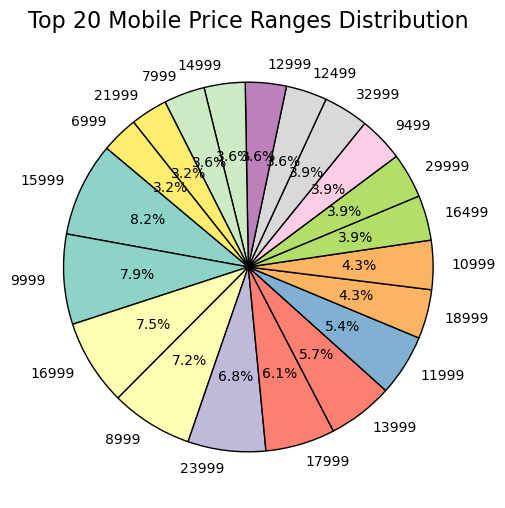

In [25]:
import matplotlib.pyplot as plt

# Select top N price ranges
top_n = 20  # Adjust as needed
price_range_values = mobile_data['Mobile_Price'].value_counts().head(top_n)

# Plot pie chart with percentages
plt.figure(figsize=(12, 6))
price_range_values.plot(kind='pie', autopct='%1.1f%%', startangle=140, cmap='Set3', wedgeprops={'edgecolor': 'black'})

# Improve title and remove y-label (since it's a pie chart)
plt.title(f'Top {top_n} Mobile Price Ranges Distribution', fontsize=16)
plt.ylabel('')  # Hide ylabel for better aesthetics

# Show the chart
plt.show()


# Insights from Mobile Price Ranges Distribution Chart 
**1. Wide Price Distribution:**
- The dataset covers a broad range of mobile prices, spanning from ₹6,999 to ₹32,999.

**2. Dominant Price Segments:**
- The most frequent price ranges appear to be ₹9,999 (7.9%) and ₹15,999 (8.2%), suggesting that a significant portion of mobiles fall within these mid-range categories.
- Other notable price ranges include ₹16,999 (7.5%) and ₹8,999 (7.2%).

**3. Premium Segment is Less Frequent:**
- Higher price ranges such as ₹29,999 and ₹32,999 have relatively lower representation, indicating that premium-priced phones are less common in the dataset.

**4. Even Distribution Among Mid-Range Prices:**
Prices between ₹10,000 - ₹20,000 hold a substantial share, reinforcing that mid-range smartphones dominate the market.

**Potential Business Insights:**
If targeting a broader audience, focusing on the ₹9,999 - ₹16,999 range may be ideal.
Budget-friendly models (₹6,999 - ₹8,999) and premium models (₹25,000+) may have niche but distinct customer segments.

## Distribution of AI Lens and RAM:

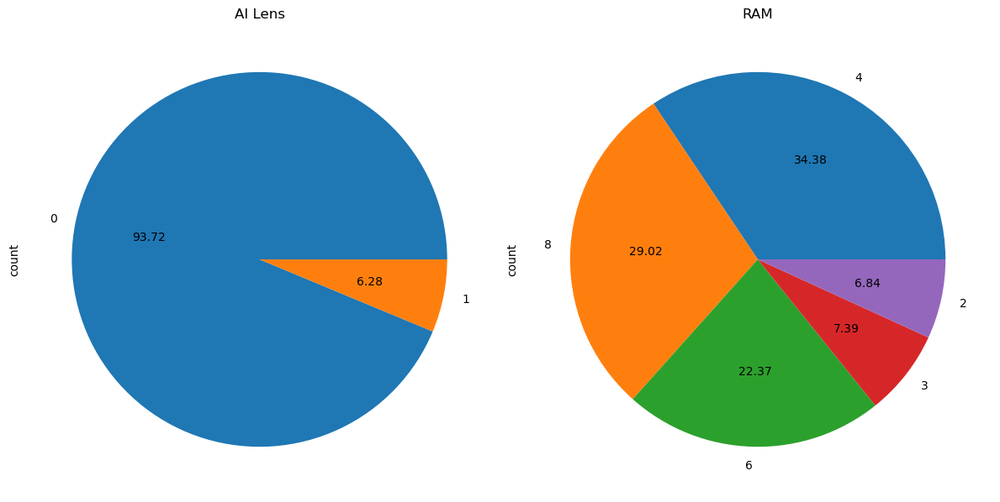

In [26]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))  # Create subplots with 1 row, 2 columns

mobile_data['AI Lens'].value_counts().plot(kind='pie', autopct='%.2f', ax=axes[0], title='AI Lens')
mobile_data['RAM'].value_counts().plot(kind='pie', autopct='%.2f', ax=axes[1], title='RAM')

plt.tight_layout() 
plt.show()


# Insights from the pie charts:

1. **AI Lens Distribution**:  
   - The majority (93.72%) of mobile phones do not have an AI Lens.  
   - Only 6.28% of mobile phones come with an AI Lens feature.
   - AI Lens is not a common feature in the dataset, indicating limited adoption.  

2. **RAM Distribution**:  
   - The most common RAM capacities are **4GB (34.38%)** and **8GB (29.02%)**.  
   - **6GB RAM (22.37%)** is also popular.  
   - Lower RAM options like **2GB (6.84%)** and **3GB (7.39%)** are less frequent.
   - Most mobile devices in this dataset have at least **4GB RAM**, suggesting a preference for mid-to-high performance devices.

# Min and Max sales in data:

In [27]:
# Find the phone model with minimum and maximum sales
min_phone = mobile_data["Brand"].min()
print("Minimum number of phone sold:", min_phone)

max_phone = mobile_data["Brand"].max()
print("Maximum number of phone sold:", max_phone)

# Get unique model names sorted by count
model_name = mobile_data.Model.value_counts().index
print(model_name)

Minimum number of phone sold: APPLE
Maximum number of phone sold: vivo
Index(['vivo Y16', 'realme C55', 'SAMSUNG Galaxy A14 5G',
       'REDMI Note 12 Pro 5G', 'vivo T1 44W', 'Infinix HOT 30i', 'REDMI 10',
       'SAMSUNG Galaxy F14 5G', 'vivo T2x 5G', 'realme C33 2023',
       ...
       'POCO M3 Pro 5G', 'SAMSUNG Galaxy S21 FE 5G', 'OPPO F21 Pro',
       'REDMI Note 11S', 'OPPO A78 5G', 'vivo Y1s', 'OnePlus Nord',
       'Micromax 3', 'vivo Y33s', 'OPPO A77'],
      dtype='object', name='Model', length=187)


# Insights of Sales :
- Minimum Sales: Apple has the lowest number of phone sales.
- Maximum Sales: Vivo has the highest number of phone sales.
- Unique Models: The dataset contains 187 unique mobile models, including brands like Vivo, Realme, Samsung, Redmi, Infinix, OPPO, and Micromax.

## Brand value Count and Top 5 brands visualisation:

In [28]:
no_mobiles=mobile_data.Brand.value_counts().values
no_mobiles

array([98, 68, 65, 62, 60, 55, 46, 17, 16,  9,  9,  5,  5,  5,  4,  3,  3,
        2,  2,  2,  2,  2,  1], dtype=int64)

In [29]:
brands = mobile_data.Brand.value_counts().index  # Extract brand names

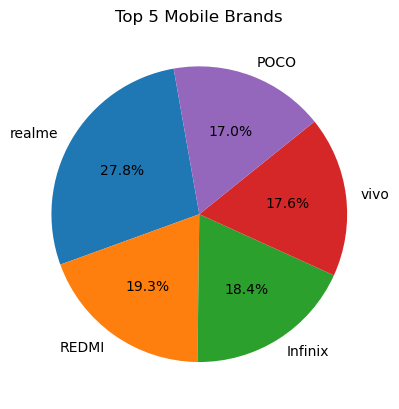

In [30]:
plt.pie(no_mobiles[:5], labels=brands[:5], autopct='%1.1f%%', startangle=100)
plt.title("Top 5 Mobile Brands")
plt.show()


 # Insights of Top 5 Mobile Brands Distribution:
- Realme dominates the market with 27.8% share among the top 5 brands.
- Redmi follows closely at 19.3%, making it a significant competitor.
- Infinix (18.4%) and Vivo (17.6%) have a comparable presence.
- POCO (17.0%) has the lowest percentage among the top 5 but is still a key competitor.

# Business Implications:
- Realme leads in popularity and might have aggressive pricing or strong consumer preference.
- Apple’s lower sales suggest it might be a premium product with fewer units sold.
- Competition is tight among Redmi, Infinix, and Vivo, indicating market saturation.
- POCO’s presence shows it is gaining traction but needs more growth to challenge bigger brands.

# KDE Plots of 'Mobile_Price','AI Lens','Memory','RAM'

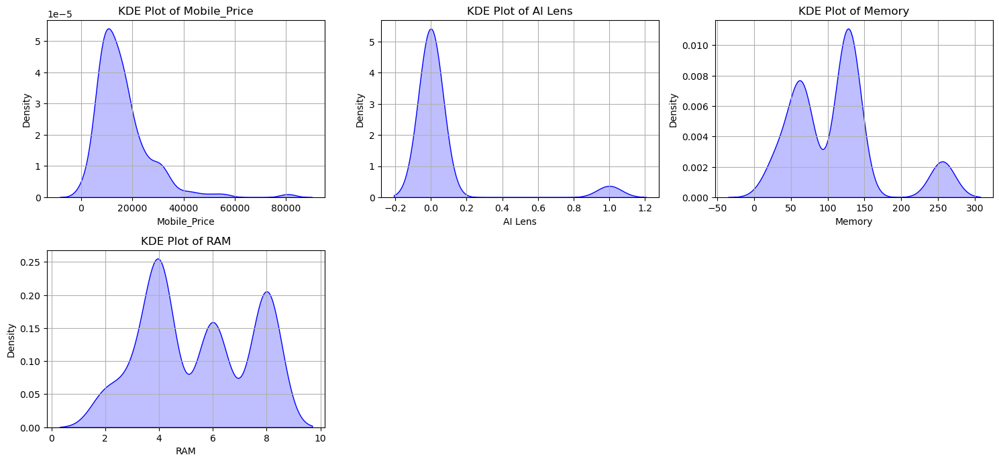

In [31]:
numeric_columns = ['Mobile_Price','AI Lens','Memory','RAM']

# Function to create KDE plots for univariate analysis
def plot_kde_univariate(mobile_data, numeric_columns):
    plt.figure(figsize=(15, 10))  # Set figure size
    for i, col in enumerate(numeric_columns, 1):
        plt.subplot(3, 3, i)  # Arrange the plots in a 3x3 grid
        sns.kdeplot(mobile_data[col], shade=True, color='blue')  # KDE plot
        plt.title(f'KDE Plot of {col}')  # Set title
        plt.xlabel(col)  # X-axis label
        plt.ylabel('Density')  # Y-axis label
        plt.grid(True)  # Enable grid
    plt.tight_layout()  # Prevent overlap
    plt.show()

# Call the function with your dataset
plot_kde_univariate(mobile_data, numeric_columns)


### **Insights from KDE Plots**

Kernel Density Estimation (KDE) plots help visualize the distribution of numerical variables in the dataset.

1. **Mobile Price Distribution:**
   - The price distribution is **right-skewed**, meaning most mobile phones are in the lower price range.
   - A small number of high-priced phones exist but are less frequent.
   - There might be a **significant gap** between budget and premium smartphones.

2. **AI Lens Distribution:**
   - The AI Lens values are **concentrated around 0**, with a few higher values.
   - Most phones may not have advanced AI lens capabilities.
    
3. **Memory Distribution:**
   - The memory distribution shows **multiple peaks**, indicating the presence of **distinct memory configurations**.
   - Peaks around **64GB, 128GB, and 256GB** suggest these are common storage options.
   - The spread suggests a variety of options in the dataset.

4. **RAM Distribution:**
   - The RAM values are also **multimodal**, meaning there are multiple common RAM sizes (e.g., 4GB, 6GB, 8GB).
   - The gaps in density suggest that **some RAM sizes are more popular than others**.

### **Key Insights:**
- **Pricing strategy:** The dominance of lower-priced phones suggests that budget-friendly devices are more common.
- **Memory & RAM segmentation:** The multimodal nature of RAM and memory suggests that smartphones are segmented into **different tiers**.
- **AI lens adoption:** Many devices have minimal AI features, which might indicate that AI-powered cameras are still emerging in the market.

# **Comprehensive Data Visualization Using Plotly Express:**  

This analysis leverages **Plotly Express** to explore and visualize all columns in the dataset. The approach dynamically distinguishes between **categorical** and **numerical** columns, ensuring appropriate visual representation:  

- **Categorical Data**: Represented using **bar charts**, displaying the frequency distribution of unique categories.  
- **Numerical Data**: Visualized using **histograms with box plots**, providing insights into the spread and distribution of values.  

These visualizations offer a **clear and interactive understanding** of the dataset, enabling effective data exploration and decision-making.

# Distribution  of all columns plotly.express

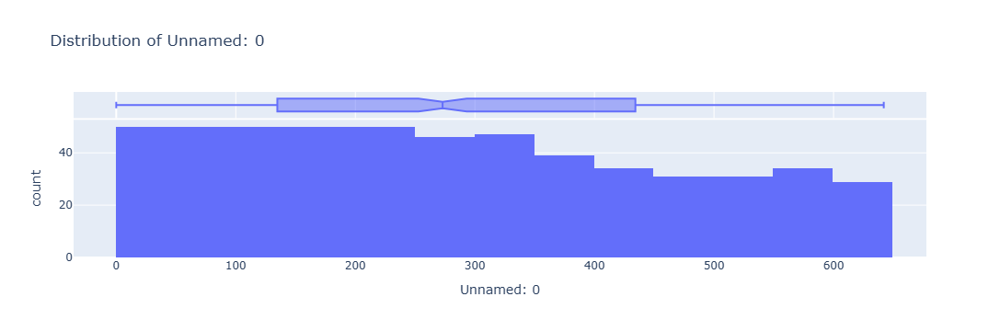

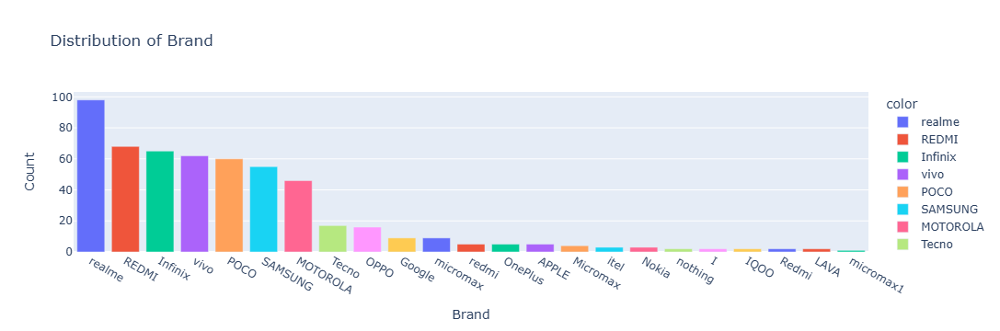

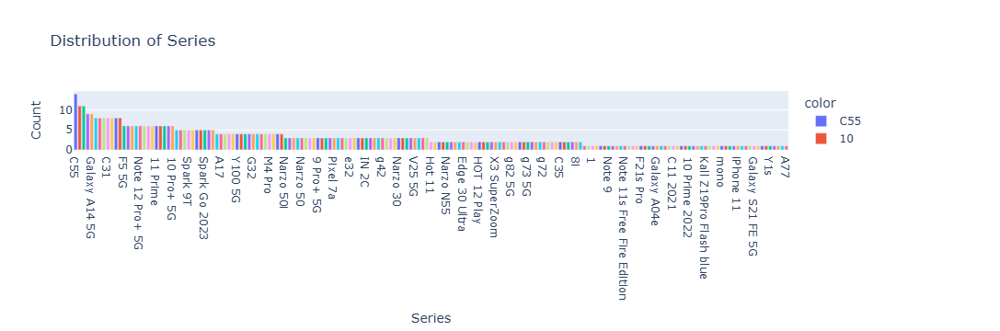

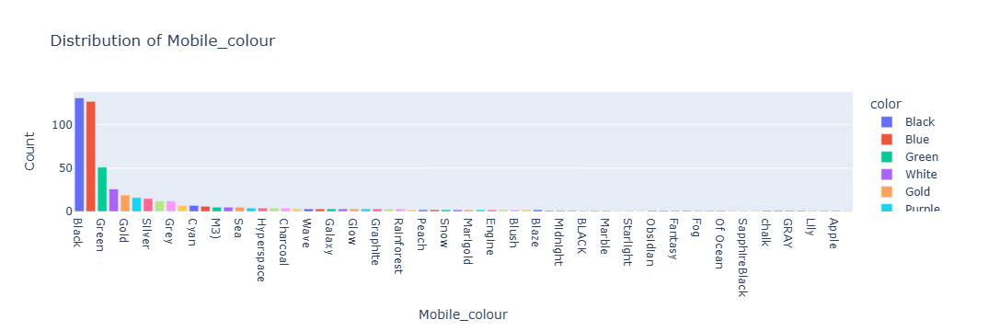

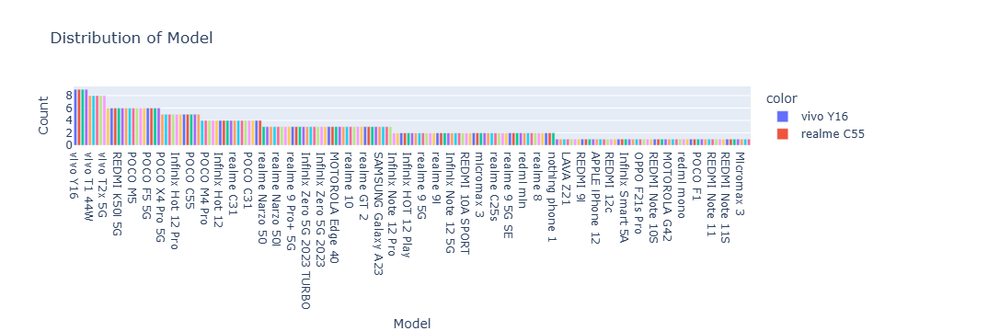

...

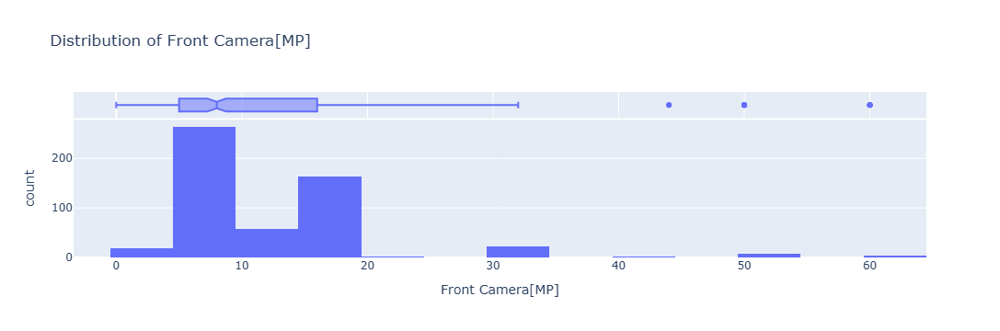

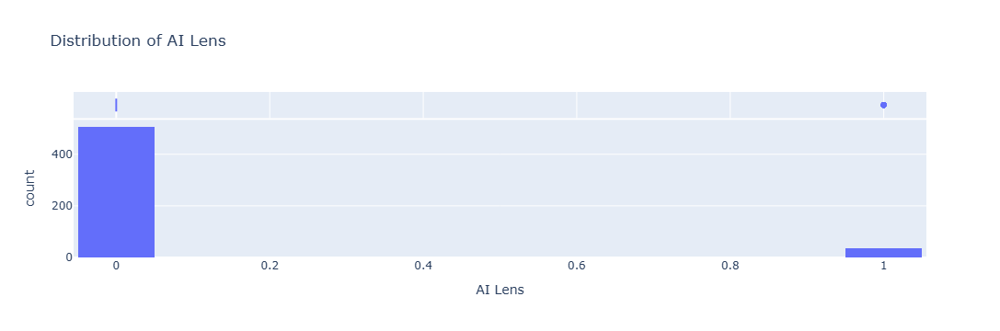

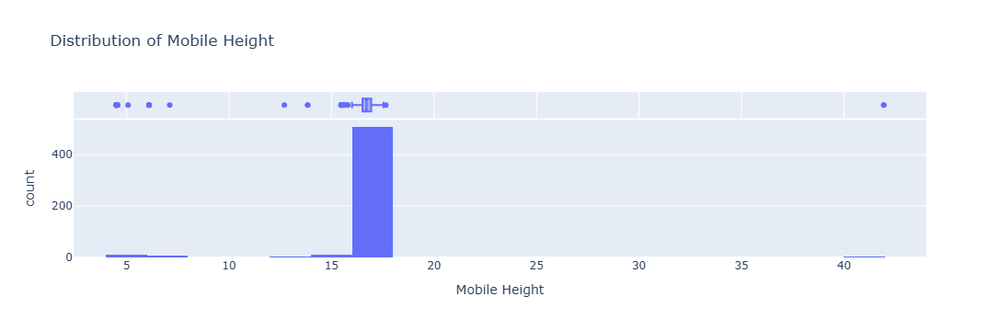

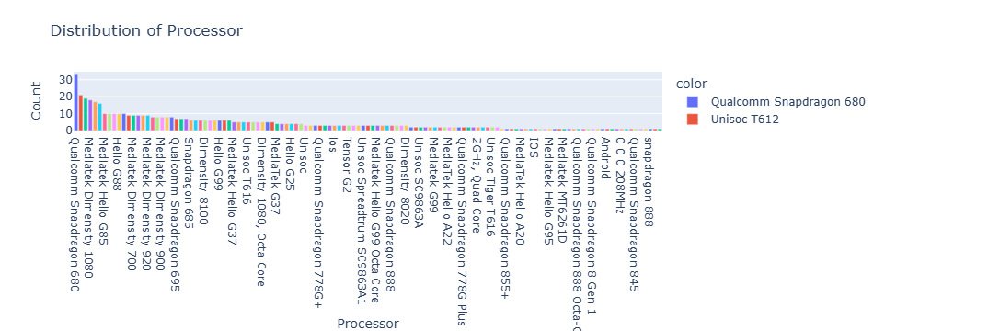

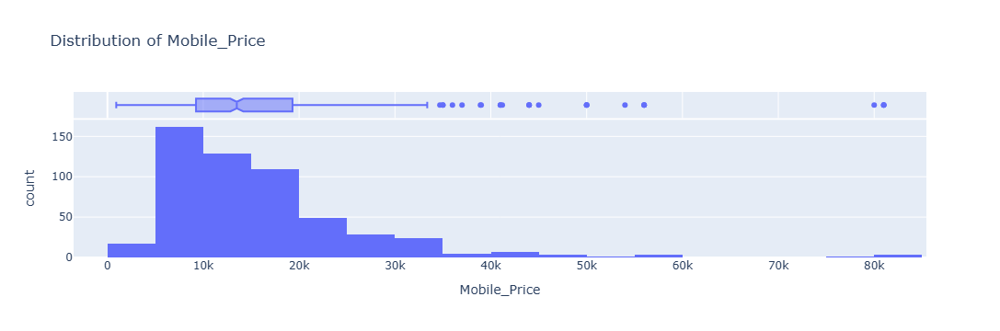

In [32]:
import plotly.express as px
columns_to_analyze = mobile_data.columns  
for col in columns_to_analyze:
    if mobile_data[col].dtype == 'object':  # Categorical columns
        fig = px.bar(mobile_data[col].value_counts(), 
                     x=mobile_data[col].value_counts().index, 
                     y=mobile_data[col].value_counts().values,
                     title=f'Distribution of {col}',
                     labels={'x': col, 'y': 'Count'},
                     color=mobile_data[col].value_counts().index)
    else:  # Numerical columns
        fig = px.histogram(mobile_data, x=col, nbins=20, title=f'Distribution of {col}', marginal="box")

    fig.show()

# **Market Insights from Mobile Data Analysis**  

## **Brand & Model Insights**  
- **Dominant Brands**: Realme, Redmi, Infinix, Vivo, and POCO have the highest market presence, with Realme leading.  
- **Market Diversity**: While the top 5 brands dominate, niche brands like itel, Nokia, Nothing, IQOO, and Micromax have low representation.  
- **Series & Model Popularity**: Specific series like **C55, Note 12 Pro 5G, and 10** are more frequent. Popular models include **Vivo Y16 and Realme C55**.  

## **Color Preferences**  
- Black, White, and Silver are the most popular colors, with a long tail of niche colors that have lower demand.  

## **Storage & RAM Trends**  
- **Memory**: The most common storage capacities are **64GB and 128GB**, with **256GB being rare**.  
- **RAM**: Standard RAM sizes are **4GB, 6GB, and 8GB**, with **6GB being the median**. High RAM models (8GB+) are limited.  

## **Battery Trends**  
- **5000mAh batteries** dominate, showing consumer preference for long battery life.  
- A few high-end models offer **6000-7000mAh** batteries, catering to gaming or heavy users.  

## **Camera Trends**  
- **Rear Camera**: Most phones feature **12-50MP**, with few high-end models exceeding **100MP**.  
- **Front Camera**: Concentrated around **5-20MP**, indicating manufacturers prioritize rear camera quality.  

## **Processor Insights**  
- A diverse range of processors is used, but a few key models dominate.  
- High-end processors are **less common**, mostly found in premium phones.  

## **Pricing Insights**  
- Most mobile phones are priced under **₹20,000**, with fewer models in the **₹40,000+ range**.  
- The price category distribution shows **mid-range and high-range models are the most common**, while low-end and ultra-premium phones are scarce.  
- **Log-transformed price distribution** suggests a structured pricing strategy.  

## **Recommendations for Market Growth**  
- **Focus on Mid & High-Range Segments**: As these categories have the highest demand, optimizing features in this price range will maximize sales.  
- **Enhance Front Camera Quality**: As selfie culture grows, improving front cameras can attract more consumers.  
- **Leverage Popular Processors**: Using well-known and efficient processors can provide a cost-performance balance.  
- **Develop Premium Phone Strategies**: Since fewer high-end phones exist, launching flagship models with unique features can attract premium buyers.  
- **Price-Performance Optimization**: A well-balanced feature set at competitive pricing will enhance the appeal in the dominant mid-range segment.

<b id="content5"></b>
## 5 )  Bivariant analysis
 

# Violin Plot of Brand vs Mobile Price

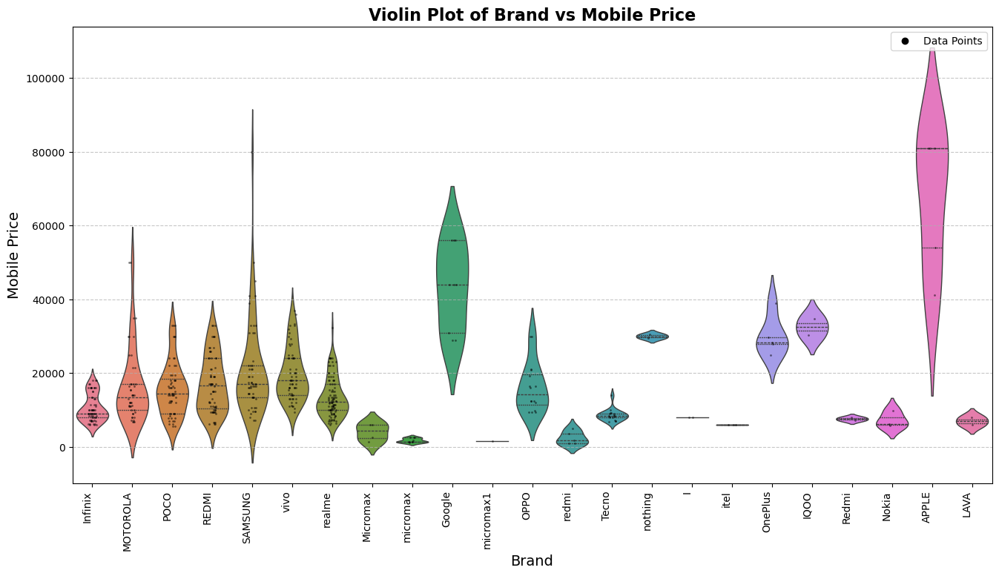

In [33]:
plt.figure(figsize=(16, 8))

# Violin plot with brand-wise color differentiation
sns.violinplot(
    x='Brand', 
    y='Mobile_Price', 
    data=mobile_data, 
    palette='husl',   # Colorful palette for better differentiation
    inner="quartile", # Show quartiles
    linewidth=1 
)

# Overlay with a strip plot for individual points
sns.stripplot(
    x='Brand', 
    y='Mobile_Price', 
    data=mobile_data, 
    color='black', 
    size=2, 
    jitter=True, 
    alpha=0.5  # Transparency for better visibility
)

# Titles and Labels
plt.title("Violin Plot of Brand vs Mobile Price", fontsize=16, fontweight='bold')
plt.xlabel("Brand", fontsize=14)
plt.ylabel("Mobile Price", fontsize=14)

# Improve X-axis readability
plt.xticks(rotation=90, ha="right")

# Add legend manually
handles = [plt.Line2D([0], [0], color="black", marker="o", linestyle='', markersize=6, label="Data Points")]
plt.legend(handles=handles, loc='upper right')

plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add grid for better readability
plt.show()


#  Insights from the violin plot of **Brand vs. Mobile Price**:

1. **Price Distribution Varies Across Brands**:  
   - Some brands, like **Apple and Google**, show a higher price range, indicating premium pricing.  
   - Other brands, such as **Infinix, Micromax, and Lava**, have a much lower price range, suggesting budget-friendly options.

2. **Apple Shows the Widest Price Spread**:  
   - Apple has a significant distribution, with prices ranging from mid-tier to premium, indicating a variety of models from older budget-friendly iPhones to the latest flagship devices.

3. **Google and OnePlus Cater to Mid-to-High Price Segments**:  
   - Google has a strong distribution in the **mid-to-high price range**, reflecting its focus on premium smartphones.  
   - OnePlus also targets mid-to-premium range users, though with a slightly lower spread than Apple.

4. **Brands with a Narrower Price Range**:  
   - **Tecno, Nokia, and Lava** show a **small price range**, implying they focus on a specific market segment (usually budget or entry-level devices).

5. **Samsung, Redmi, and Realme Cover a Broad Market**:  
   - These brands have a **moderate-to-wide price range**, indicating they offer budget, mid-range, and high-end models.

6. **Market Positioning Insights**:  
   - If the goal is to capture a specific market segment, brands like **Apple, Google, and Samsung** focus on premium pricing, while **Redmi, POCO, and Realme** balance budget and mid-range models.
   - Brands like **Lava, Micromax, and Nokia** may cater more to price-sensitive customers.

# Top 15 Expensive Mobile Models

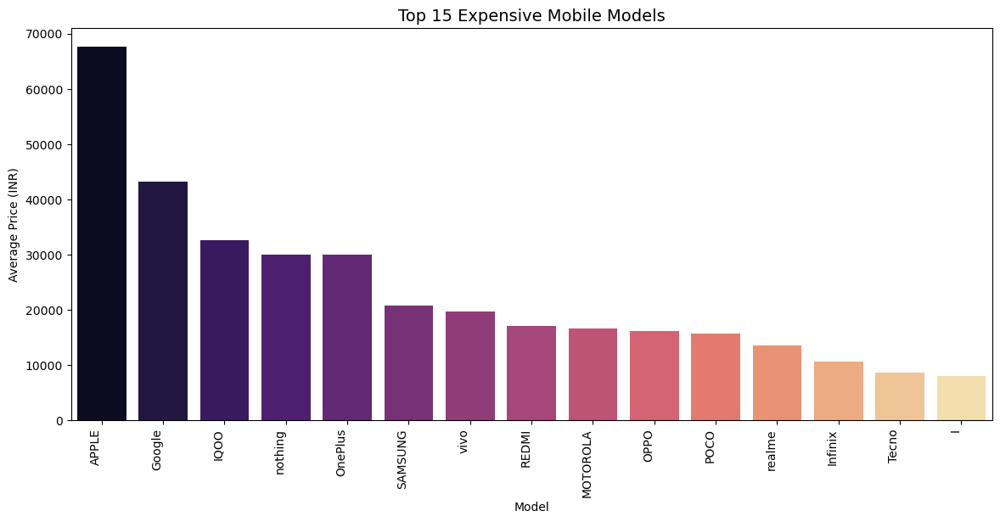

In [34]:
# Brand-wise Average Price Analysis
plt.figure(figsize=(14, 6))
brand_avg_price = mobile_data.groupby("Brand")["Mobile_Price"].mean().sort_values(ascending=False)[:15]  # Top 15 expensive models

sns.barplot(x=brand_avg_price.index, y=brand_avg_price.values, palette="magma")
plt.xticks(rotation=90, ha="right")
plt.title("Top 15 Expensive Mobile Models", fontsize=14)
plt.xlabel("Model")
plt.ylabel("Average Price (INR)")
plt.show()


### Insights on Expensive Mobile Models:

1. **Apple Dominates Premium Pricing**  
   - Apple has the highest average price, exceeding **₹65,000**, making it the most expensive brand in the market.

2. **Google and iQOO Follow**  
   - Google holds the second position, averaging around **₹45,000**, indicating its focus on high-end devices.  
   - iQOO competes in the premium range, slightly below Google.

3. **Mid-to-Premium Brands**  
   - **Nothing, OnePlus, Samsung, and Vivo** are in the **₹25,000 - ₹35,000** range, targeting mid-to-high-end consumers.

4. **Affordable Premium Segment**  
   - **Motorola, OPPO, POCO, and Realme** fall in the **₹15,000 - ₹25,000** range, offering budget-friendly premium models.

5. **Infinix and Tecno Are Budget Options**  
   - These brands have the lowest average prices, below **₹10,000**, focusing on cost-conscious buyers.

### Strategic Implications: 
- **Apple and Google** dominate the high-end market.  
- **Samsung, OnePlus, and iQOO** balance price and features for premium buyers.  
- **Realme, POCO, and Motorola** appeal to mid-range customers.  
- **Infinix and Tecno** are great for budget-friendly markets.

# Stacked Bar Plot of Brand vs Rear Camera[MP]

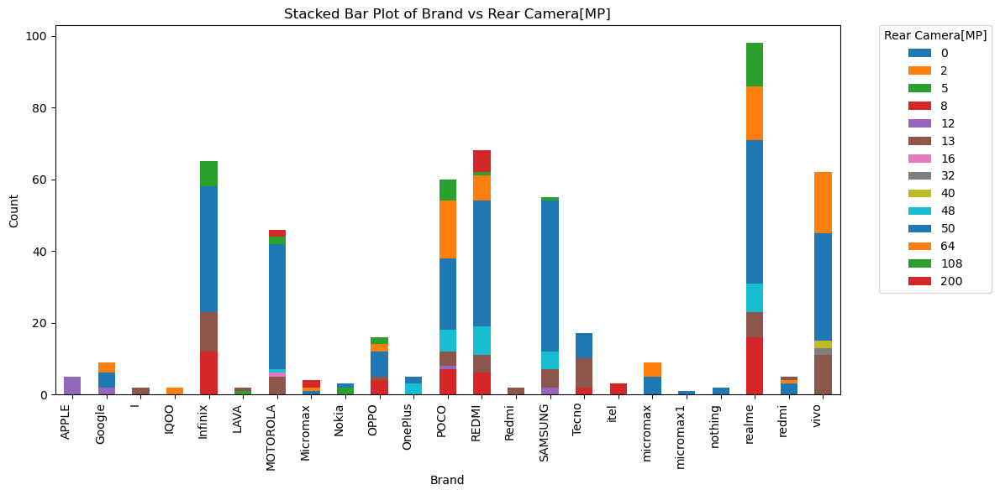

In [35]:
# Create stacked bar plot
ax = pd.crosstab(mobile_data['Brand'], mobile_data['Rear Camera[MP]']).plot(kind='bar', stacked=True, figsize=(12, 6))

# Set title and labels
plt.title("Stacked Bar Plot of Brand vs Rear Camera[MP]")
plt.xlabel("Brand")
plt.ylabel("Count")

# Move the legend outside the plot
plt.legend(title="Rear Camera[MP]", bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.)

# Improve layout
plt.xticks(rotation=90, ha="right")
plt.tight_layout()

# Show plot
plt.show()


### Insights on Rear Camera Distribution Across Brands:

1. **Most Brands Offer High-Resolution Cameras**  
   - Many brands, especially **Vivo, Realme, Redmi, and Samsung**, have a large count of **48MP, 64MP, and even 200MP cameras**, catering to users who prioritize camera quality.

2. **Budget Brands Have Lower Camera Resolutions**  
   - **Infinix, Tecno, Lava, and Micromax** primarily offer **2MP to 16MP** cameras, indicating a focus on entry-level and budget-friendly models.

3. **Premium Brands Balance Camera Variability**  
   - **Apple and Google**, known for advanced camera technology, have fewer models but focus on software-driven photography rather than high megapixel counts.

4. **Realme and Vivo Dominate the 200MP Segment**  
   - These brands lead in the ultra-high megapixel category, showcasing innovation in mobile photography.

### Strategic Implications: 
- **High-resolution cameras (48MP-200MP) are a strong trend** in mid-to-premium smartphones.  
- **Budget brands focus on lower MP cameras** but compete through affordability.  
- **Apple and Google rely on software optimization** rather than high MP numbers.  


# Distribution of Mobile Processors

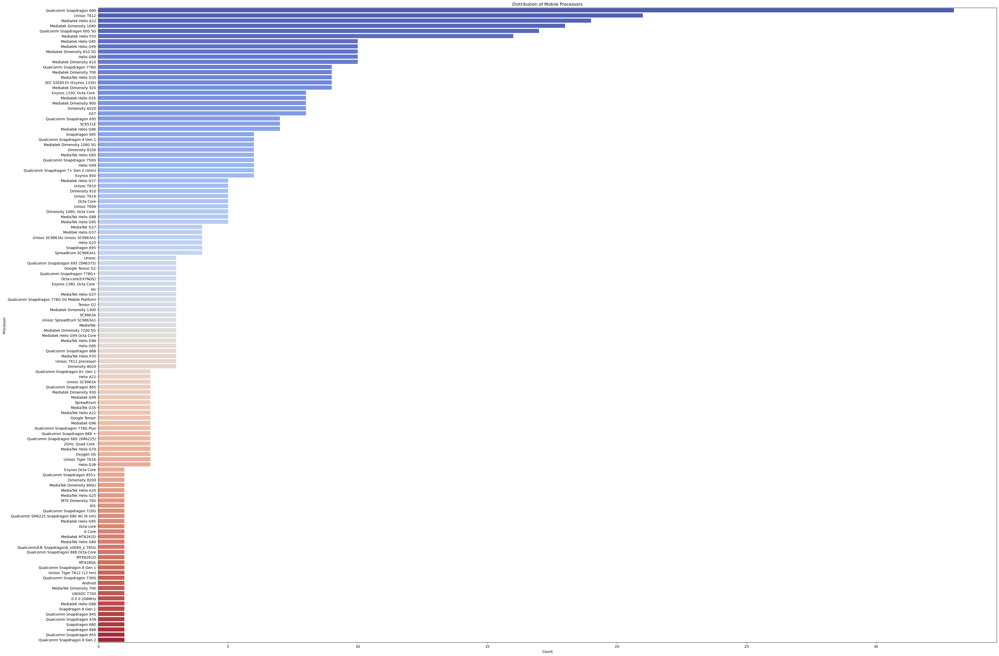

In [36]:
plt.figure(figsize=(45, 32))
sns.countplot(y="Processor", data=mobile_data, order=mobile_data["Processor"].value_counts().index, palette="coolwarm")
plt.title("Distribution of Mobile Processors")
plt.xlabel("Count")
plt.ylabel("Processor")
plt.show()


### Insights on Mobile Processor Distribution:

1. **Snapdragon Dominates the Market**  
   - Qualcomm's **Snapdragon processors** are the most commonly used, with **Snapdragon 778G and 695** leading in popularity.  
   - This suggests strong performance and efficiency, making them a preferred choice for mid-range and high-end smartphones.

2. **MediaTek is a Strong Competitor**  
   - MediaTek’s **Dimensity and Helio series** are widely present, particularly in budget and mid-range segments.  
   - Their increasing presence indicates growing competition with Snapdragon.

3. **Exynos and Apple Processors are Less Common**  
   - Samsung's **Exynos chips** and Apple’s **A-series chips** appear less frequently, likely due to brand-specific usage (Samsung and Apple devices only).

4. **Diversity in Entry-Level and High-End Chips**  
   - The list includes a mix of **flagship processors** (e.g., **Snapdragon 8 Gen series**) and **budget-friendly chips** (e.g., **Helio G series**), showing a broad market range.

### Strategic Implications:  
- **Snapdragon remains the preferred choice** for performance-focused smartphones.  
- **MediaTek is rapidly gaining ground**, especially in budget and mid-range devices.  
- **Apple and Exynos processors are brand-specific**, limiting their distribution but maintaining strong ecosystem control.

# Distribution of Mobile Colors

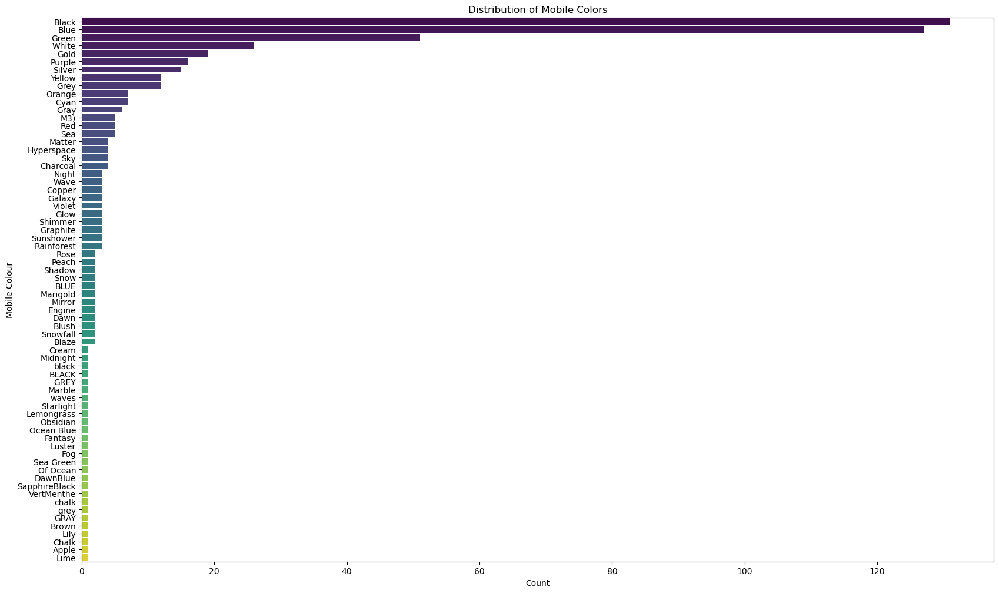

In [37]:
plt.figure(figsize=(20, 12))
sns.countplot(y="Mobile_colour", data=mobile_data, order=mobile_data["Mobile_colour"].value_counts().index, palette="viridis")
plt.title("Distribution of Mobile Colors")
plt.xlabel("Count")
plt.ylabel("Mobile Colour")
plt.show()


### Insights on Mobile Color Distribution:

1. **Black is the Most Popular Color**  
   - Black dominates the market, followed by **Blue, Green, White, and Gold**, indicating that neutral and classic colors are highly preferred.

2. **Metallic Shades Are in Demand**  
   - **Silver, Grey, and Gold** are among the top choices, showing consumer preference for premium-looking finishes.

3. **Lesser Demand for Unique Colors**  
   - Shades like **Lime, Brown, and Sepia** have the lowest counts, indicating they cater to niche buyers.

4. **Gradient and Special Edition Colors Exist**  
   - Names like **Hyperspace, Ocean Blue, and Midnight** suggest brands are introducing **custom and gradient finishes** to attract specific customer segments.

### Strategic Implications:  
- **Classic colors (Black, Blue, and White) should remain the focus** for high-demand models.  
- **Metallic shades enhance premium appeal**, making them ideal for flagship devices.  
- **Unique colors can serve niche markets**, driving exclusivity for limited editions.

# Contingency Table Heatmap: Brand vs Front Camera[MP]

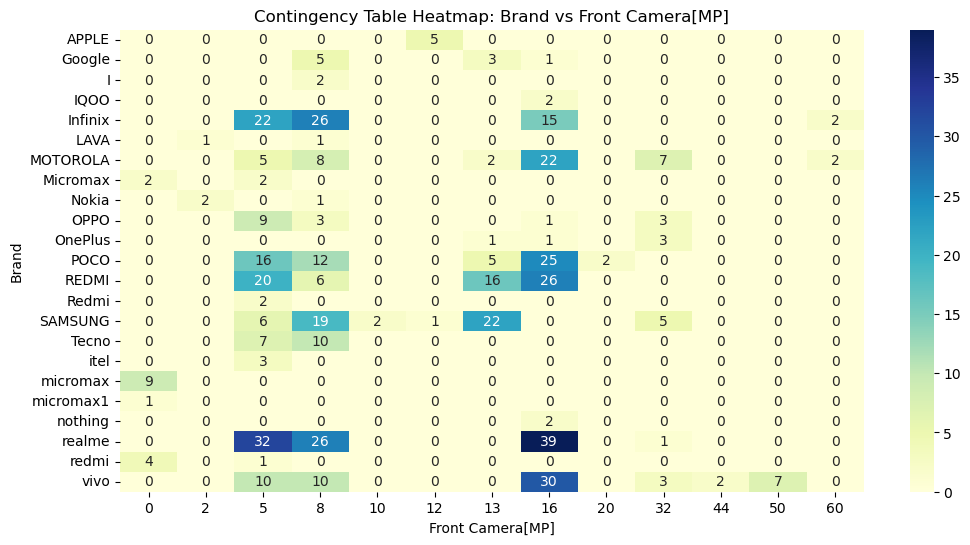

In [38]:

# Create a contingency table between Brand and Front Camera[MP]
cont_table = pd.crosstab(mobile_data['Brand'], mobile_data['Front Camera[MP]'])

# Plot as a heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(cont_table, annot=True, cmap="YlGnBu", fmt="d")

# Titles and labels
plt.title("Contingency Table Heatmap: Brand vs Front Camera[MP]")
plt.xlabel("Front Camera[MP]")
plt.ylabel("Brand")
plt.show()


### Insights on Front Camera Distribution Across Brands:

1. **High-Resolution Front Cameras Are Common in Realme & Vivo**  
   - **Realme and Vivo dominate the 32MP-39MP range**, making them strong choices for selfie-focused consumers.  
   - **Realme has the highest concentration of 39MP front cameras**, indicating a marketing push toward selfie enthusiasts.

2. **Mid-Range Brands Offer 16MP as the Standard**  
   - **Samsung, Redmi, POCO, and Infinix** frequently use **16MP front cameras**, making it the most common resolution for mid-range devices.

3. **Low-Resolution Front Cameras in Budget Brands**  
   - **Micromax, Lava, Nokia, and Tecno** have front cameras mostly **below 10MP**, aligning with their focus on affordable smartphones.

4. **Apple and Google Prioritize Optimization Over Megapixels**  
   - **Apple and Google have front cameras mostly around 5-10MP**, relying on **software optimization** rather than high megapixels for selfie quality.

### Strategic Implications:  
- **Realme and Vivo lead in high-MP front cameras**, targeting selfie lovers.  
- **16MP is the industry standard for mid-range phones**, balancing quality and cost.  
- **Budget brands prioritize affordability over front camera resolution.**  
- **Apple and Google focus on AI-driven camera improvements**, making megapixel count less relevant for their models.

# Top 5 Brands by categorizing features:

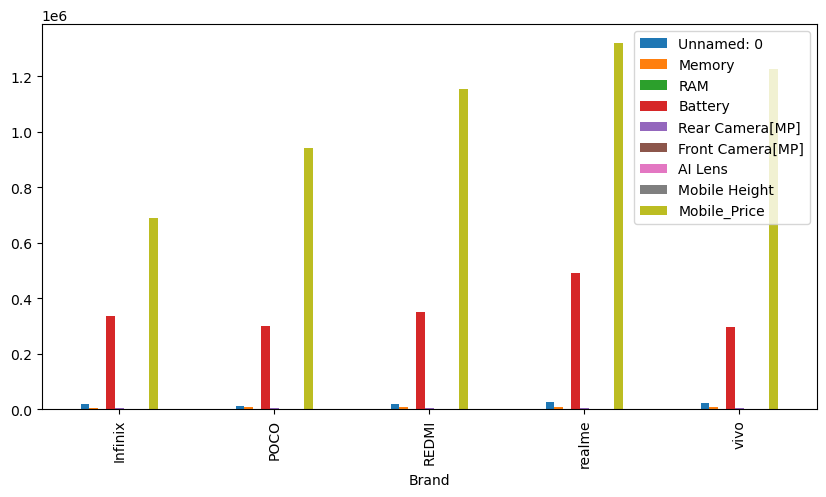

In [39]:
top_n = 5
top_categories = mobile_data["Brand"].value_counts().nlargest(top_n).index
mobile_data_filtered = mobile_data[mobile_data["Brand"].isin(top_categories)]
mobile_data_filtered.groupby("Brand").sum().plot(kind="bar", figsize=(10, 5))

plt.show()


### Insights on Mobile Features vs. Price:

1. **Mobile Price is the Most Influential Factor**  
   - The **yellow bars** representing **Mobile Price** are significantly higher than other features, confirming that price varies widely across brands.

2. **Battery Capacity is Consistently High Across Brands**  
   - The **red bars** indicate that **battery capacity** remains a key selling point across brands like **Infinix, POCO, Redmi, Realme, and Vivo**.

3. **RAM and Memory Show Minimal Variation**  
   - **Memory (orange) and RAM (green) bars are relatively small**, suggesting that storage and RAM capacity are similar across these brands.

4. **Camera and AI Lens Contributions Are Minimal**  
   - Features like **Rear Camera MP, Front Camera MP, and AI Lens** have **low impact** compared to price and battery, implying that **other factors like brand value and software play a bigger role** in pricing.

### Strategic Implications:  
- **Mobile price is a major differentiator**, with Realme and Vivo leading in higher pricing.  
- **Battery remains a competitive feature**, making it essential for marketing mid-range devices.  
- **RAM and storage improvements have less impact on pricing**, suggesting a standardization across models.  
- **Camera specs alone don't justify pricing**—brand reputation and optimization matter more.

# Parallel Coordinates Plot: Mobile Features vs Price Category

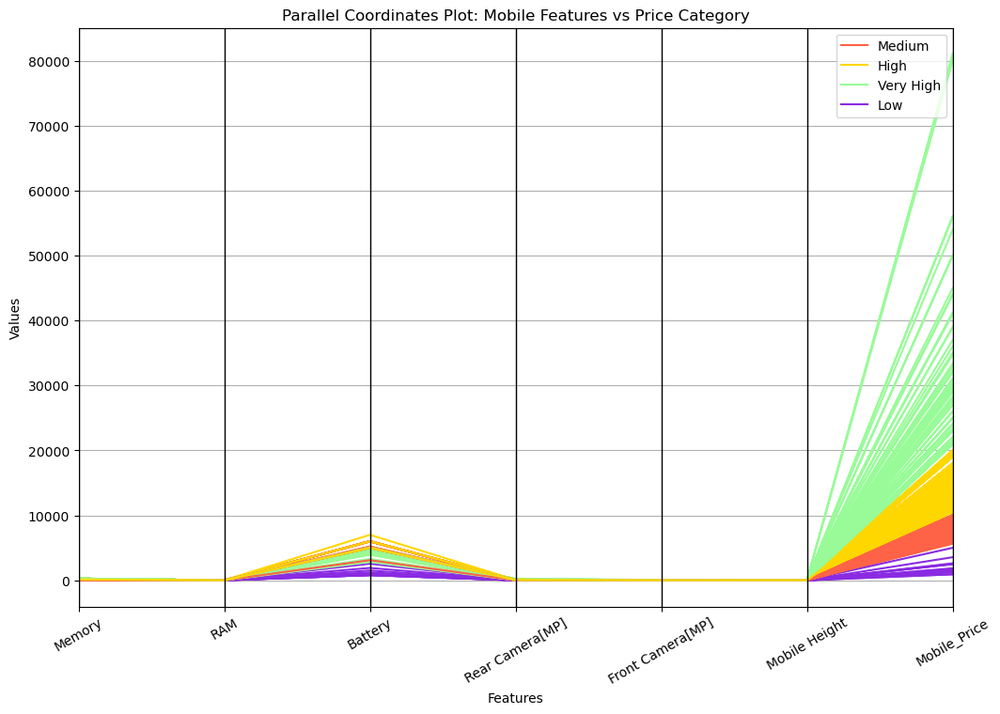

In [40]:
import pandas as pd
import matplotlib.pyplot as plt
from pandas.plotting import parallel_coordinates

# Selecting relevant numerical columns for visualization
numeric_columns = ['Memory', 'RAM', 'Battery', 'Rear Camera[MP]', 'Front Camera[MP]','Mobile Height','Mobile_Price']

# Convert Mobile_Price to categorical for color distinction
mobile_data['PriceCategory'] = pd.cut(mobile_data['Mobile_Price'], 
                                      bins=[0, 5000, 10000, 20000, float('inf')], 
                                      labels=['Low', 'Medium', 'High', 'Very High'])

# Plotting the parallel coordinates
plt.figure(figsize=(12, 8))
parallel_coordinates(mobile_data[numeric_columns + ['PriceCategory']], 
                     'PriceCategory', 
                     color=['#FF6347', '#FFD700', '#98FB98', '#8A2BE2'])

# Formatting the plot
plt.title('Parallel Coordinates Plot: Mobile Features vs Price Category')
plt.xlabel('Features')
plt.ylabel('Values')
plt.xticks(rotation=30)
plt.grid(True)
plt.show()


### Insights from Parallel Coordinates Plot: Mobile Features vs. Price Category

1. **Price Categories Show Clear Separation**  
   - The **Very High (Green) price category** is significantly distinct from the rest, indicating that premium mobiles have unique characteristics compared to lower-priced ones.  
   - **Low (Purple) and Medium (Orange) price categories overlap**, suggesting similar features in budget and mid-range segments.

2. **Battery Capacity Peaks, but Price Influence is Minimal**  
   - Battery values show a peak, but it does not strongly differentiate price categories.  
   - This implies that **battery size alone does not determine the price**—other factors matter.

3. **RAM and Memory Have Limited Impact on Pricing**  
   - The **lines for RAM and Memory remain mostly flat**, meaning that even low-price and high-price mobiles have similar values for these features.

4. **Camera Features and Mobile Height Have No Clear Trend**  
   - The **Rear Camera, Front Camera, and Mobile Height** do not distinctly separate price categories, reinforcing that **brand value, software, and build quality may play a bigger role in pricing.**

### Business Takeaways:  
- **Premium mobiles (Very High Price) stand out with unique features, justifying their higher cost.**  
-  **Battery capacity is important but does not alone dictate price.**  
-  **Budget and mid-range phones share many features, suggesting price differentiation happens elsewhere (brand, software, design).**  
-  **For competitive pricing, focus on overall user experience rather than just specs.** 

# RAM vs. Mobile Price jointplot

<Figure size 1200x1000 with 0 Axes>

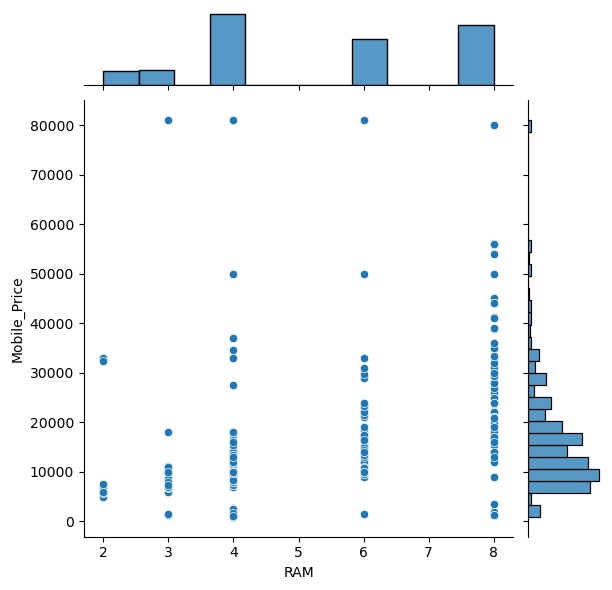

In [41]:
plt.figure(figsize=(12,10))
sns.jointplot(x='RAM',y="Mobile_Price",data=mobile_data)
plt.show()

### Insights: RAM vs. Mobile Price  

1. **Higher RAM Generally Leads to Higher Prices**  
   - Phones with **8GB RAM** are mostly **high-priced**, often above **₹50,000**.  
   - **Budget phones** (under ₹10,000) mostly have **2GB to 4GB RAM**.  

2. **Wide Price Variation in Mid-Range (4GB-6GB RAM)**  
   - Phones with **4GB-6GB RAM** have a **broad price range** from budget to premium.  
   - This suggests other factors (brand, processor, camera) influence pricing.  

3. **Premium Phones Have More RAM**  
   - The **most expensive models** tend to have **6GB or 8GB RAM**.  
   - This aligns with **flagship devices** offering better performance and features.  

### Business Takeaways:  
- **Budget buyers: 4GB RAM is a sweet spot** (affordable but still powerful).  
- **Premium buyers: 8GB RAM is a common choice** (performance-focused).  
- **For mid-range customers, highlight other features (camera, processor) to justify price differences.**

# Front Camera[MP] vs. Mobile Price by lineplot

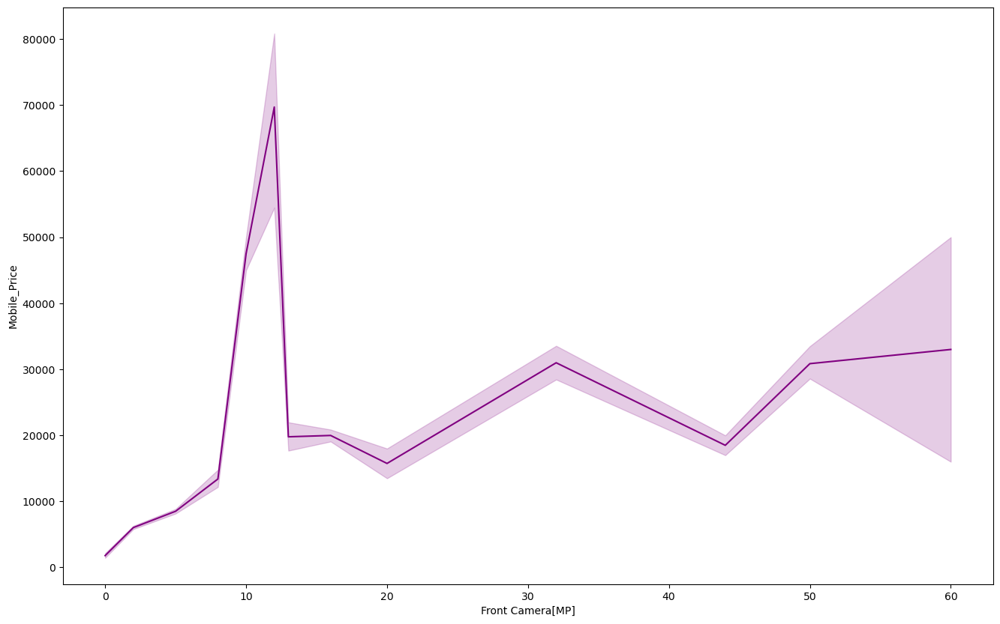

In [42]:
plt.figure(figsize=(16,10))
sns.lineplot(x="Front Camera[MP]",y="Mobile_Price",data=mobile_data,color= "purple")
plt.show()

### Insights from Front Camera MP vs. Mobile Price  

1. **Price Increases with Higher Front Camera MP (Up to 10-12MP)**  
   - There is a **steep increase in price** as the front camera resolution improves from **0MP to around 10-12MP.**  
   - Phones in this range likely belong to **premium brands or flagship models.**  

2. **Drop in Price Beyond 12MP, Followed by a Gradual Rise**  
   - After **12MP**, there is a sharp **drop in price**, indicating that higher MP alone does not guarantee a premium price.  
   - Some mid-range phones may have **higher MP cameras but lower overall specifications**, bringing down their price.  

3. **Higher-End Models at 30MP+ Range**  
   - Phones with **30MP+ front cameras** tend to be priced higher, showing a **gradual increase.**  
   - This could be due to **flagship models featuring AI-enhanced cameras, 4K video capabilities, and advanced selfie features.**  

### Business Takeaways:  
- **Front camera MP impacts pricing, but only up to a point (~12MP).**  
- **Premium models focus on more than just MP (sensor quality, AI, brand value).**  
- **Marketing should highlight AI features and camera technology, not just MP count.**  
- **For budget-conscious buyers, focus on mid-range MP (8-16MP) with software enhancements.**  


# Front Camera vs. Primary Camera MegaPixels 

Text(0.5, 0, 'MegaPixels')

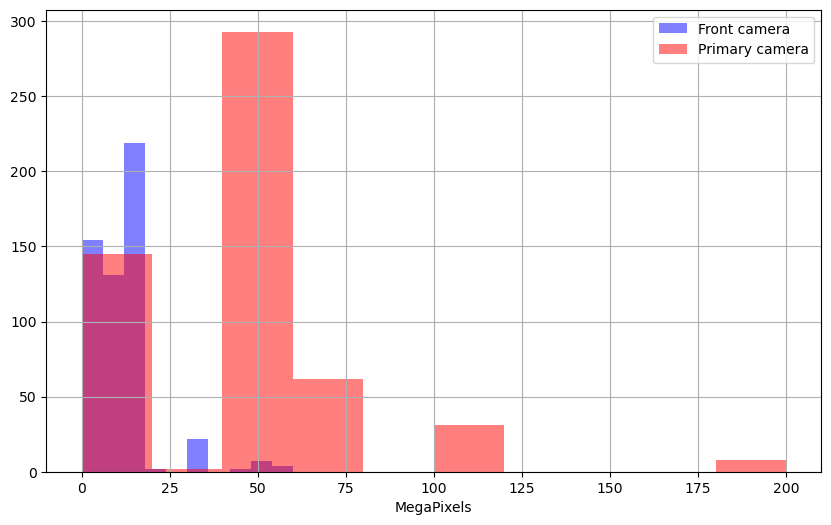

In [43]:
plt.figure(figsize=(10,6))
mobile_data['Front Camera[MP]'].hist(alpha=0.5,color='blue',label='Front camera')
mobile_data['Rear Camera[MP]'].hist(alpha=0.5,color='red',label='Primary camera')
plt.legend()
plt.xlabel('MegaPixels')

### Insights: Front Camera vs. Primary Camera MegaPixels  

1. **Primary Cameras Have Higher Megapixels**  
   - Most primary (rear) cameras are **50MP**, with some even exceeding **100MP**.  
   - A few high-end models reach **200MP**, emphasizing flagship devices.  

2. **Front Cameras Are Generally Lower in Resolution**  
   - The most common front camera resolutions are **8MP - 20MP**.  
   - Very few front cameras exceed **50MP**, as selfies rely more on software optimization than pure megapixels.  

3. **Clear Market Trend: Rear Cameras Are Prioritized for Photography**  
   - Manufacturers focus on **high-resolution rear cameras**, while front cameras remain optimized for portraits and video calls.  

### Business Takeaways:
- **Customers prioritizing photography should focus on rear camera megapixels.**  
- **Selfie lovers should consider software enhancements (AI features, night mode) over just megapixels.**  
- **For marketing, emphasize rear camera megapixels for flagship phones and selfie features for mid-range models.**

#  Processor vs. Mobile Color Distribution

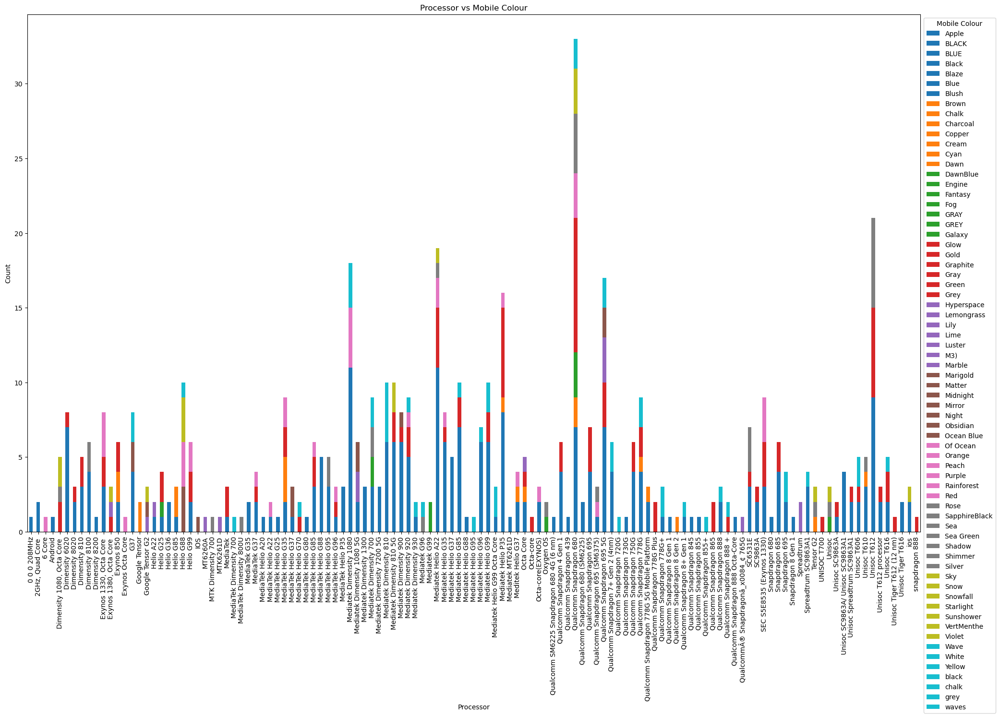

In [44]:
# Create a pivot table
color_processor_counts = pd.crosstab(mobile_data["Processor"], mobile_data["Mobile_colour"])

# Plot stacked bar chart
color_processor_counts.plot(kind="bar", stacked=True, figsize=(24, 14), colormap="tab10")
plt.title("Processor vs Mobile Colour")
plt.xlabel("Processor")
plt.ylabel("Count")
plt.legend(title="Mobile Colour", bbox_to_anchor=(1, 1))
plt.xticks(rotation=90)
plt.show()

### Insights: Processor vs. Mobile Color Distribution  

1. **Processor Variety is Extensive**  
   - There is a **wide range of processors** used across mobile phones, indicating a competitive market.  
   - Some processors are more common, with a **higher count of devices using them**.  

2. **Popular Processors Have More Color Variants**  
   - Processors with higher device counts show **greater diversity in mobile colors**.  
   - This suggests that **flagship and widely adopted chipsets** are used in multiple models with different colors to attract various customer preferences.  

3. **Color Distribution Varies Across Processors**  
   - Certain processors are primarily linked with **specific colors**, possibly indicating **brand identity strategies**.  
   - For instance, blue, black, and gray appear more frequently, suggesting these are **popular and widely available colors** across multiple chipsets.  

### Business Takeaways:  
- **Popular processors should be paired with diverse color options to cater to different consumer tastes.**  
- **Limited edition or unique colors could be strategically used to market flagship devices.**  
- **Understanding color preference trends for specific processors can help optimize inventory management.** 

In [45]:
group = mobile_data.groupby(["Brand", "RAM", "Battery", "Memory"]).size().reset_index().rename(columns={0: "count"})
group

,Brand,RAM,Battery,Memory,count
0,APPLE,3,4323,128,1
1,APPLE,4,4323,128,1
2,APPLE,6,4323,128,1
3,APPLE,8,2815,64,1
4,APPLE,8,3110,64,1
...,...,...,...,...,...
138,vivo,8,4600,128,2
139,vivo,8,4700,128,2
140,vivo,8,4830,128,1
141,vivo,8,4830,256,1


#  Relationship Between RAM and Battery Capacity

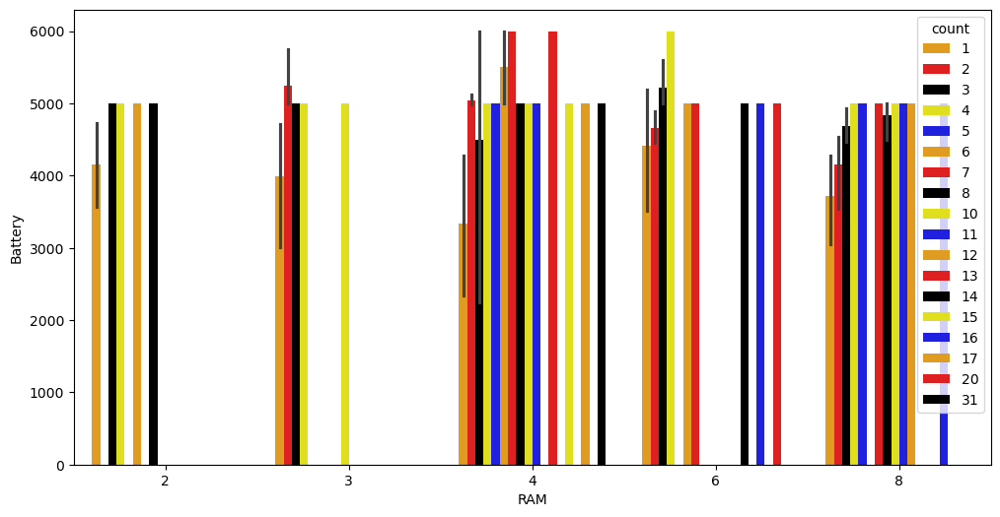

<Figure size 2000x1200 with 0 Axes>

In [46]:
import warnings
warnings.filterwarnings("ignore")

# Set figure size
plt.rcParams["figure.figsize"] = (12, 6)
# Visualization
sns.barplot(x="RAM", y="Battery", hue="count", palette=["orange", "red", "black", "yellow", "blue"], data=group)

plt.figure(figsize=(20, 12))
plt.show()


### Insights: Relationship Between RAM and Battery Capacity  

1. **Battery Capacity is Fairly Consistent Across RAM Variants**  
   - Most devices have battery capacities ranging **between 4000mAh and 6000mAh**, regardless of RAM size.  
   - This suggests that **battery life is a priority for all RAM configurations**.  

2. **Higher RAM Variants Have More Battery Consistency**  
   - Phones with **4GB, 6GB, and 8GB RAM have tightly packed battery capacities**, showing less variation.  
   - Lower RAM models (2GB, 3GB) exhibit **more variation**, indicating different battery capacities used across entry-level devices.  

3. **Device Count is Uneven Across RAM Levels**  
   - **4GB RAM models are the most common**, followed by 6GB and 8GB, making them **popular configurations in the market**.  
   - Devices with **higher RAM (6GB, 8GB) often have large battery sizes**, likely targeting performance-oriented users.  

### Business Takeaways:  
- **4GB RAM models dominate the market and should be a focus for mid-range battery optimization.**  
- **Ensuring consistent battery life across lower RAM models can improve user experience in budget devices.**  
- **Higher RAM devices can leverage large batteries as a marketing advantage for power users.**

<b id="content6"></b>
## 6 )  Multivariant analysis

# 3D Surface Plot:  Front Camera[MP],Memory vs Mobile_Price

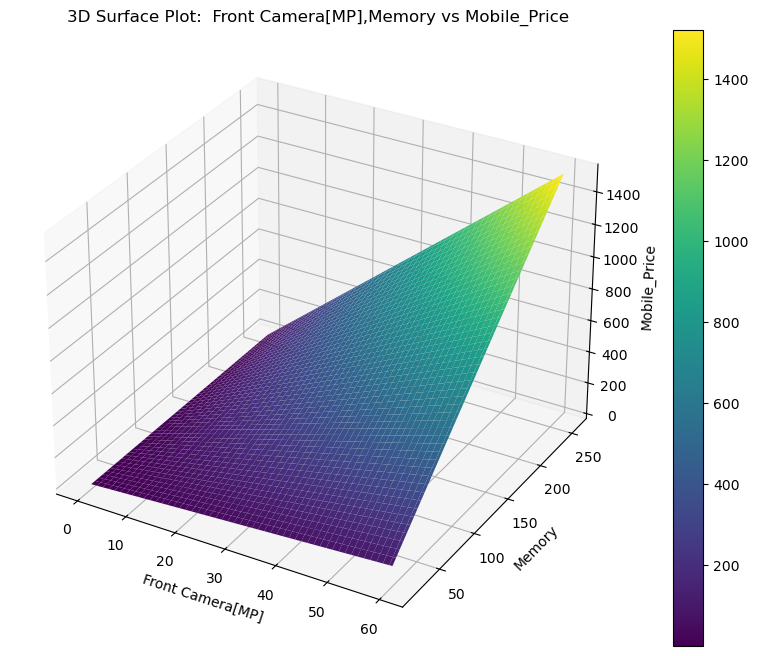

In [47]:
from mpl_toolkits.mplot3d import Axes3D

# Create a grid of X and Y values (Battery and RAM)
X = np.linspace(mobile_data['Front Camera[MP]'].min(), mobile_data['Front Camera[MP]'].max(), 100)
Y = np.linspace(mobile_data['Memory'].min(), mobile_data['Memory'].max(), 100)

# Create a meshgrid of X and Y
X, Y = np.meshgrid(X, Y)

# Simulate Mobile Price as a function of Battery and RAM
Z = (X * Y) / 10  # Approximate relationship for visualization

# Create a 3D plot
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Surface plot
surf = ax.plot_surface(X, Y, Z, cmap='viridis')

# Labels and Title
ax.set_xlabel('Front Camera[MP]')
ax.set_ylabel('Memory')
ax.set_zlabel('Mobile_Price')
ax.set_title('3D Surface Plot:  Front Camera[MP],Memory vs Mobile_Price')

# Show color bar
fig.colorbar(surf)

plt.show()


### Insights: Impact of Front Camera & Memory on Mobile Price  

1. **Higher Memory and Front Camera Lead to Higher Prices**  
   - The graph shows a **clear upward trend**, meaning that as **memory (storage) and front camera megapixels increase, mobile price rises**.  
   - **Premium devices tend to have higher storage and better front cameras.**  

2. **Memory Has a Stronger Influence Than Front Camera**  
   - Price increase is more **steeply affected by memory size** compared to front camera megapixels.  
   - This suggests that **users prioritize storage over high front camera resolution** when paying for a phone.  

3. **Budget Phones Have Lower Storage and Front Camera Quality**  
   - Phones with **low memory (<50GB) and front cameras (<20MP) fall in the lower price range**.  
   - These are likely **entry-level or budget smartphones** catering to cost-sensitive users.  

### Business Takeaways:  
- **Memory size is a key price driver—offering different storage variants can maximize revenue.**  
- **Front camera quality is important but has a smaller impact—focusing on essential improvements is enough.**  
- **For budget segments, balancing storage and camera specs can help optimize costs while maintaining competitiveness.**

# Box Plot: Price Distribution by Brand

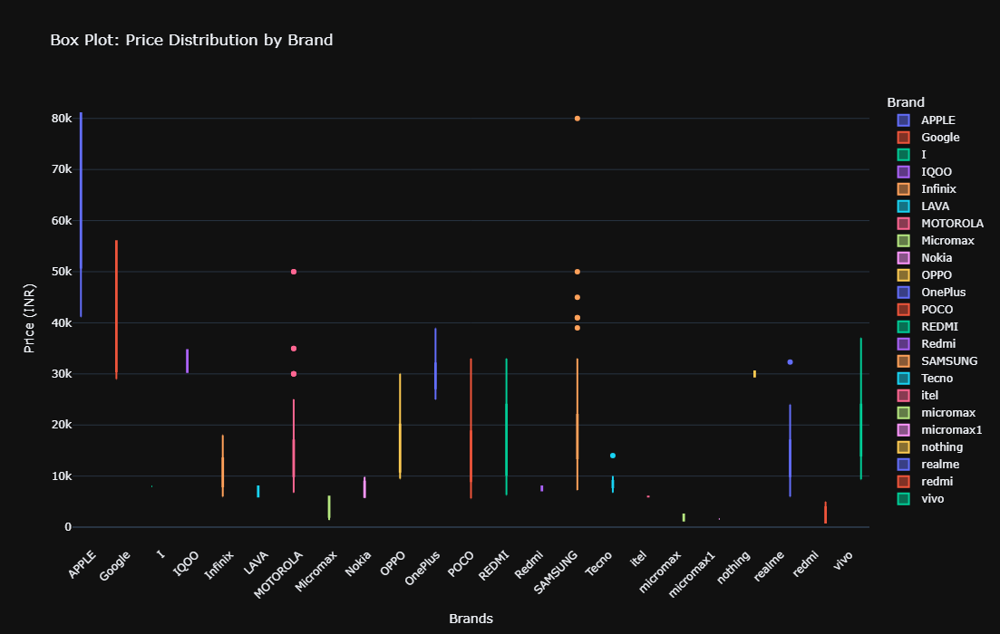

In [48]:
import plotly.express as px

# Box plot for Mobile Price Distribution by Brand
fig1 = px.box(
    mobile_data, 
    x='Brand', 
    y='Mobile_Price',  # Change to a numerical column
    title='Box Plot: Price Distribution by Brand', 
    color='Brand', 
    height=700,
    category_orders={"Brand": sorted(mobile_data['Brand'].unique())},  # Sort brands alphabetically
    hover_data=['Processor', 'RAM', 'Battery']  # Additional hover details
)

# Customize layout
fig1.update_layout(
    xaxis_title='Brands',
    yaxis_title='Price (INR)',  # Updated y-axis label
    xaxis_tickangle=-45,  # Rotate x-axis labels for readability
    boxmode='group',  # Prevent overlap of boxes
    template="plotly_dark"  # Dark theme for better visuals
)

fig1.show()


### Insights: Mobile Price Distribution Across Brands  

1. **Premium vs. Budget Segmentation**  
   - **Apple and Google dominate the premium segment**, with prices reaching **80,000 INR and above**.  
   - Brands like **OnePlus, Samsung, and Oppo** also have premium models but offer more mid-range options.  

2. **Wide Price Range Among Some Brands**  
   - **Samsung, OnePlus, and Oppo** cover both **budget and premium** markets, showing a **diverse price range**.  
   - **Redmi, Realme, and Vivo** mostly focus on **mid-range and budget** phones, making them popular among cost-conscious consumers.  

3. **Strictly Budget-Oriented Brands**  
   - **Infinix, Itel, Lava, and Micromax** target **low-cost segments**, staying mostly under **₹20,000**.  
   - These brands cater to users looking for **affordable smartphones with essential features**.  

### Business Takeaways:  
- **Apple & Google remain exclusive in the high-end market—focusing on premium buyers.**  
- **Samsung, OnePlus, and Oppo offer diverse options—ideal for different consumer segments.**  
- **Budget brands should focus on price-sensitive customers while balancing features and costs.**

## Histogram of price distribution with Miscellaneous Features:

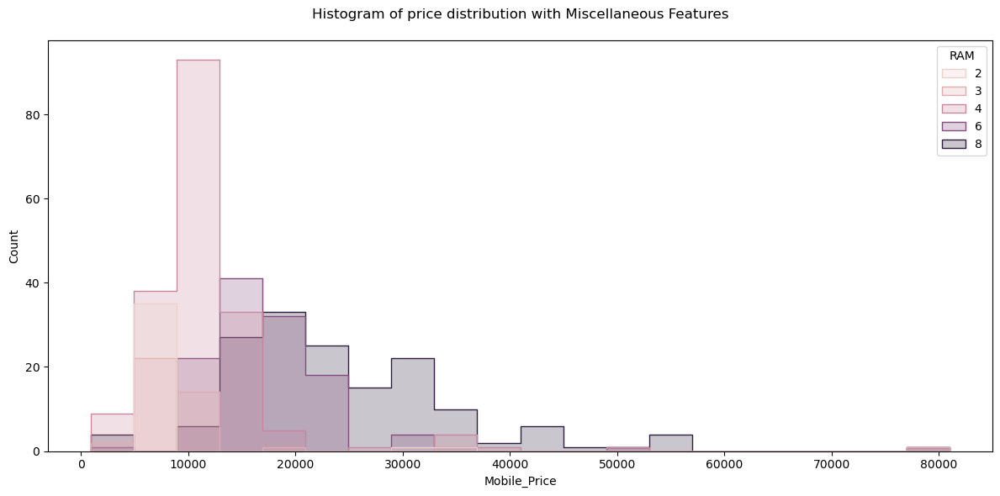

In [49]:
sns.histplot(data=mobile_data,x='Mobile_Price', bins = 20,hue = 'RAM',element='step')
plt.title('Histogram of price distribution with Miscellaneous Features\n')
plt.tight_layout()
plt.show()

### Insights from the Price Distribution Histogram:  

1. **Right-Skewed Price Distribution**  
   - Most mobile phones are priced below **₹20,000**, with a sharp drop in count as prices increase.  
   - Very few phones are priced above **₹50,000**, indicating that high-end models are less common.  

2. **RAM vs. Price Relationship**
   - **Lower RAM models (2GB & 3GB)** are concentrated in the lower price range (below ₹15,000).  
   - **Mid-range RAM (4GB & 6GB)** covers a broad price range, suggesting a balance between affordability and performance.  
   - **Higher RAM models (8GB)** are mostly found in higher price segments, aligning with premium phones.  

- The dataset shows that budget-friendly phones dominate the market, while high-end phones with more RAM are available but less frequent.

# Pairplot of less correlated variables with Mobile_Price

In [50]:
lessCorr_columns=mobile_data[['Brand', 'Series', 'Mobile_colour', 'Memory', 'RAM', 'Battery',
       'Rear Camera[MP]', 'Front Camera[MP]', 'AI Lens', 'Mobile Height',
       'Processor', 'Mobile_Price']]
lessCorr_columns

,Brand,Series,Mobile_colour,Memory,RAM,Battery,Rear Camera[MP],Front Camera[MP],AI Lens,Mobile Height,Processor,Mobile_Price
0,Infinix,SMART 7,Black,64,4,6000,13,5,1,16.76,Unisoc Spreadtrum SC9863A1,7299
1,Infinix,SMART 7,Blue,64,4,6000,13,5,1,16.76,Unisoc Spreadtrum SC9863A1,7299
2,MOTOROLA,G32,Gray,128,8,5000,50,16,0,16.64,Qualcomm Snapdragon 680,11999
3,POCO,C50,Blue,32,2,5000,8,5,0,16.56,Mediatek Helio A22,5649
4,Infinix,HOT 30i,Marigold,128,8,5000,50,5,1,16.76,G37,8999
...,...,...,...,...,...,...,...,...,...,...,...,...
536,SAMSUNG,Galaxy S23 5G,Cream,256,8,3900,50,12,0,15.49,Qualcomm Snapdragon 8 Gen 2,79999
537,LAVA,Z21,Cyan,32,2,3100,5,2,0,12.70,Octa Core,5998
538,Tecno,Spark 8T,Cyan,64,4,5000,50,8,0,16.76,MediaTek Helio G35,9990
539,SAMSUNG,Galaxy A54 5G,Lime,128,8,5000,50,32,0,16.26,"Exynos 1380, Octa Core",38999


<Figure size 1600x1200 with 0 Axes>

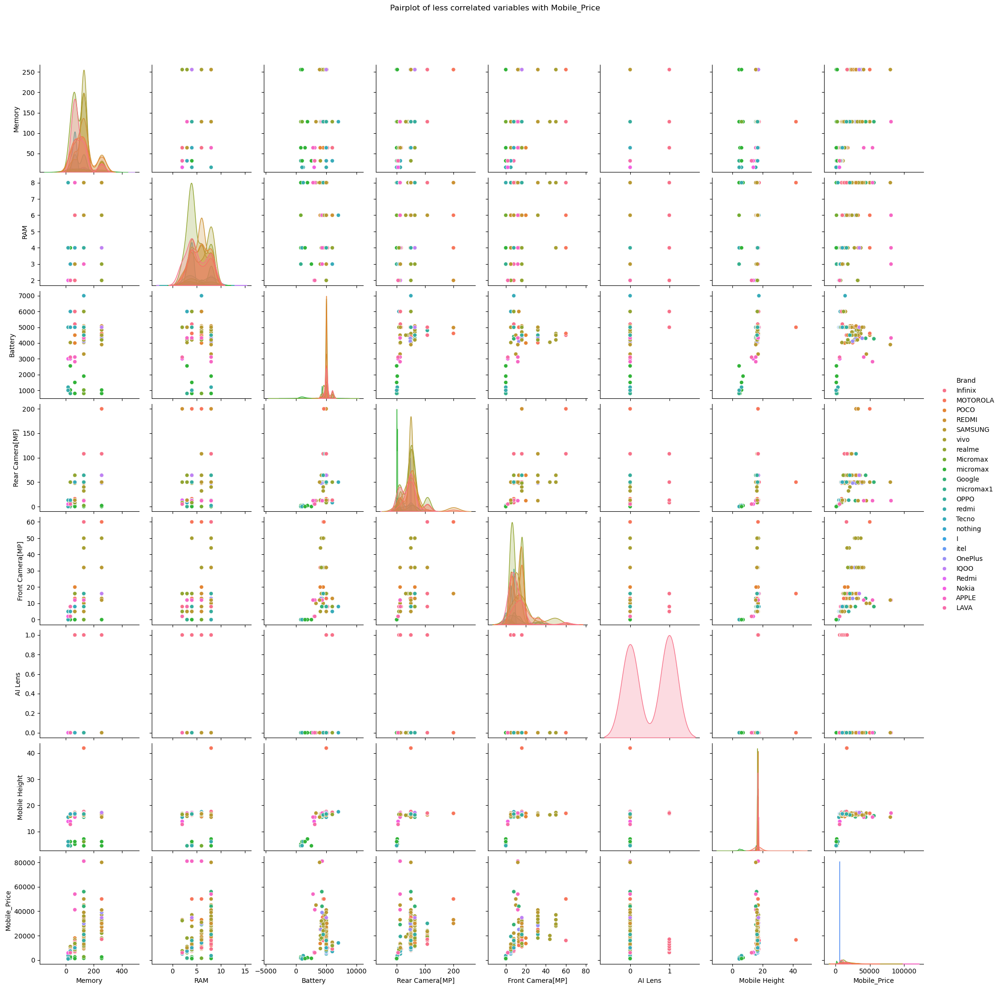

In [51]:
plt.figure(figsize=(16,12))
sns.pairplot(lessCorr_columns,hue="Brand")
plt.suptitle("Pairplot of less correlated variables with Mobile_Price",y=1.05)
plt.show()

### Insights from Pairplot Analysis  

1. **Feature Distributions**  
   - The **battery capacity** and **mobile price** have clear peaks, suggesting that most phones fall within common ranges.  
   - **RAM and storage distributions** show distinct clusters, indicating certain standard configurations in the market.  

2. **Correlations and Relationships**  
   - **Battery vs. Price**: No strong trend, meaning higher-priced phones do not always have bigger batteries.  
   - **RAM & Storage vs. Price**: A clear **positive correlation**—higher memory and storage tend to increase the price.  
   - **Front & Rear Camera MP vs. Price**: Some high-end phones have extreme values, but mid-range devices follow a standard pattern.  

3. **Brand Differentiation**  
   - Certain brands are **concentrated in specific feature ranges**, such as **budget brands** clustering around lower RAM, storage, and price.  
   - **Premium brands (Apple, Samsung, OnePlus) occupy the higher price range**, with more storage and better camera specs.  

### Business Takeaways:  
- **Price is highly dependent on memory and storage rather than battery capacity.**  
- **Premium brands differentiate through storage and camera features, while budget brands optimize affordability.**  
- **Identifying feature clusters helps in targeting specific customer segments effectively.**

# Regression Plots:

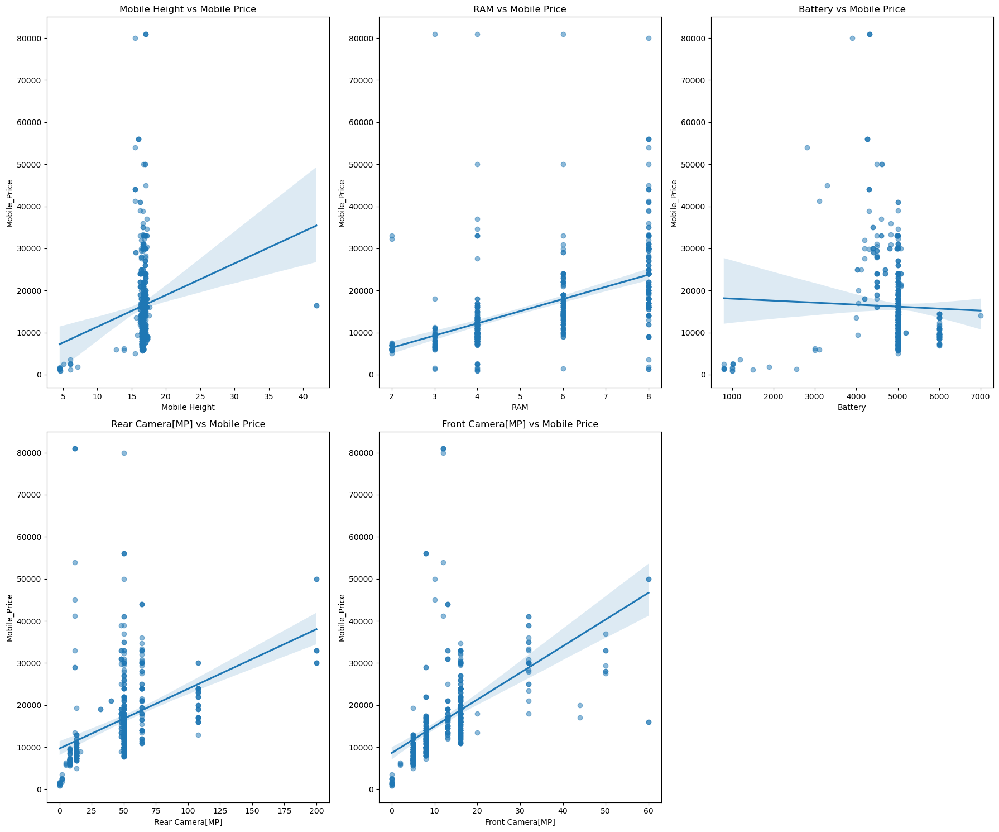

In [52]:
# Creating a 2x3 subplot figure
fig, axes = plt.subplots(2, 3, figsize=(18, 15))

# Regression Plot 1: Mobile Height vs Mobile Price
sns.regplot(x="Mobile Height", y="Mobile_Price", data=mobile_data, 
            scatter_kws={'alpha': 0.5}, ax=axes[0, 0])
axes[0, 0].set_title("Mobile Height vs Mobile Price")

# Regression Plot 2: RAM vs Mobile Price
sns.regplot(x="RAM", y="Mobile_Price", data=mobile_data, 
            scatter_kws={'alpha': 0.5}, ax=axes[0, 1])
axes[0, 1].set_title("RAM vs Mobile Price")

# Regression Plot 3: Battery vs Mobile Price
sns.regplot(x="Battery", y="Mobile_Price", data=mobile_data, 
            scatter_kws={'alpha': 0.5}, ax=axes[0, 2])
axes[0, 2].set_title("Battery vs Mobile Price")

# Regression Plot 4: Rear Camera vs Mobile Price
sns.regplot(x="Rear Camera[MP]", y="Mobile_Price", data=mobile_data, 
            scatter_kws={'alpha': 0.5}, ax=axes[1, 0])
axes[1, 0].set_title("Rear Camera[MP] vs Mobile Price")

# Regression Plot 5: Front Camera vs Mobile Price
sns.regplot(x="Front Camera[MP]", y="Mobile_Price", data=mobile_data, 
            scatter_kws={'alpha': 0.5}, ax=axes[1, 1])
axes[1, 1].set_title("Front Camera[MP] vs Mobile Price")

# Remove the empty subplot
fig.delaxes(axes[1, 2])  

# Adjust layout
plt.tight_layout()
plt.show()


### Key Insights from Scatter Plots with Trend Lines  

1. **Mobile Height vs. Price** 
   - Taller phones tend to have **higher prices**, indicating that **larger screen sizes** might contribute to cost.  

2. **RAM vs. Price** 
   - There is a **strong positive correlation**—as RAM increases, the price also rises. This suggests RAM is a key pricing factor.  

3. **Battery vs. Price**  
   - No clear trend; some expensive phones have small batteries, and some budget phones have large batteries.  
   - **Battery size alone does not determine price**—other features (like processor, camera, brand) play a bigger role.  

4. **Rear Camera MP vs. Price**
   - A **positive trend**—higher MP cameras generally appear in higher-priced phones.  
   - However, a few expensive phones have lower MP cameras, likely due to **better sensor quality** rather than just MP count.  

5. **Front Camera MP vs. Price**  
   - Similar to the rear camera, **higher front camera MPs are linked to costlier phones**.  
   - This suggests that selfie-focused devices tend to be in the premium segment.  

### Business Takeaways:  
- **RAM and Camera MP are strong indicators of mobile pricing.**  
- **Battery size does not significantly impact price.**  
- **Screen size (height) contributes to pricing, possibly due to display quality and phone design.**

# using a corelation map to visualize features with high corelation.

<Axes: >

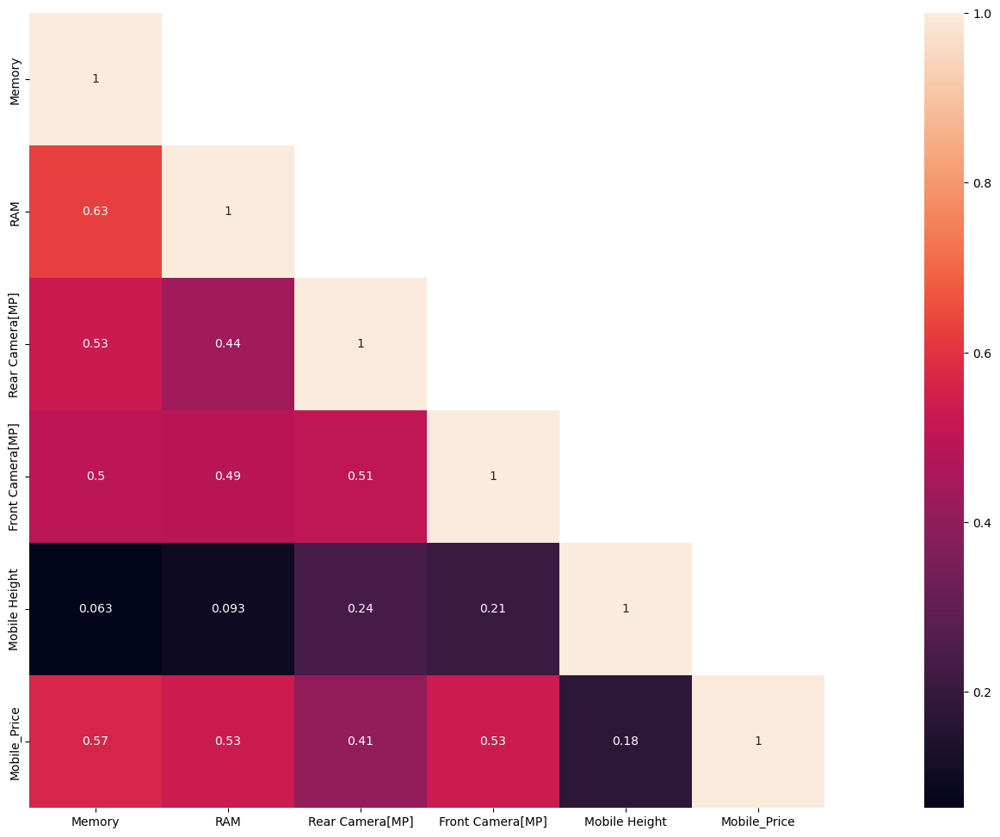

In [53]:
# using a corelation map to visualize features with high corelation.
#corelation matrix.
cor_mat= mobile_data[['Memory', 'RAM','Rear Camera[MP]','Front Camera[MP]','Mobile Height',
       'Mobile_Price']].corr()
mask = np.array(cor_mat)
mask[np.tril_indices_from(mask)] = False
fig=plt.gcf()
fig.set_size_inches(30,12)
sns.heatmap(data=cor_mat,mask=mask,square=True,annot=True,cbar=True)


### Key Insights from the Correlation Heatmap  

1. **Strongest Factors Affecting Price:**  
   - **Memory (0.57), RAM (0.53), and Front Camera MP (0.53)** show **moderate to strong positive correlations** with mobile price.  
   - This means **devices with higher RAM, more storage, and better front cameras tend to be more expensive**.  

2. **Rear Camera Impact on Price:**  
   - **Rear Camera MP (0.41) has a moderate correlation with price**.  
   - While higher MP cameras generally indicate higher price, the effect is weaker than RAM and memory.  
   - Other camera features (sensor quality, lens, AI enhancements) might play a role beyond just MP count.  

3. **Screen Size (Mobile Height) Has a Weak Influence (0.18):**  
   - **Mobile height has a low correlation with price**, meaning screen size alone does not significantly impact cost.  
   - High-end phones might focus more on display technology (OLED, high refresh rate) rather than just size.  

### Business Takeaways:  
- **Investing in better RAM, storage, and front camera features is key for premium pricing.**  
- **Rear Camera MP matters but is not the strongest factor in pricing.**  
- **Screen size alone does not drive cost; other display factors likely play a bigger role.**

# checking correlation of data with categorical columns using ANOVA P-Value:

In [54]:
from scipy import stats  # Import scipy.stats

anova_results = {}  # Dictionary to store ANOVA test results
categorical_cols = ['Brand', 'Series', 'Mobile_colour', 'Processor']  # List of categorical columns

for col in categorical_cols:
    groups = [mobile_data['Mobile_Price'][mobile_data[col] == category] for category in mobile_data[col].dropna().unique()]
    f_stat, p_value = stats.f_oneway(*groups)  # ANOVA test
    anova_results[col] = p_value

anova_results_mobile_data = pd.DataFrame(anova_results.items(), columns=['Feature', 'P-Value'])
print(anova_results_mobile_data)

         Feature        P-Value
0          Brand   5.528108e-66
1         Series  5.449171e-244
2  Mobile_colour   1.218827e-26
3      Processor  3.980301e-217


### Insights from ANOVA Test on Categorical Features  

1. **All categorical features significantly impact mobile price.**  
   - The **p-values are extremely small (close to 0),** indicating that **Brand, Series, Mobile Colour, and Processor have a statistically significant effect** on mobile price.  

2. **Brand & Processor are key drivers of price variation.**  
   - **Brand (5.52e-66) and Processor (3.98e-217) have the strongest influence,** meaning different brands and processors lead to significant price differences.  
   - High-end brands and processors likely command higher prices due to better performance and brand perception.  

3. **Series also plays a crucial role (p-value ≈ 5.45e-244).**  
   - Within a brand, different series (e.g., flagship vs. budget models) contribute to price variation.  

4. **Mobile Colour has the least impact (p-value ≈ 1.22e-26).**  
   - Though significant, colour affects price **less than brand, series, and processor**—likely due to limited pricing variations across color options.  

### Business Takeaways:  
- **Branding & Processor quality are key pricing factors.**  
- **Product Series differentiation influences pricing strategy.**  
- **Mobile Colour has some effect but is not a major price driver.**

<b id="content7"></b>
## 7)Outlier Detection and Treatment

In [55]:
# Check for missing values in the dataset
mobile_data.isnull().sum()

Unnamed: 0          0
Brand               0
Series              0
Mobile_colour       0
Model               0
Colour              0
Memory              0
RAM                 0
Battery             0
Rear Camera[MP]     0
Front Camera[MP]    0
AI Lens             0
Mobile Height       0
Processor           0
Mobile_Price        0
PriceCategory       0
dtype: int64

### **Insights**  

 **No missing values:**  
   - The dataset is **clean** with no missing data across all columns. This ensures reliable analysis without requiring imputation.  
   - **No missing data—analysis can proceed smoothly.**  


# dtypes of categorical columns:

In [56]:
mobile_data.dtypes[mobile_data.dtypes!="object"]

Unnamed: 0             int64
Memory                 int64
RAM                    int64
Battery                int64
Rear Camera[MP]        Int64
Front Camera[MP]       Int64
AI Lens                int64
Mobile Height        float64
Mobile_Price           int64
PriceCategory       category
dtype: object

In [57]:
# numeric col list
numeric_col= ['Memory', 'RAM', 'Battery', 'Mobile Height','AI Lens','Mobile_Price']

# Boxplots of Numeric Columns

In [58]:
numerical_column = mobile_data.select_dtypes(include=['number']).columns
for i in numerical_column:
    Q1 = mobile_data[i].quantile(0.25)
    print("The first quantile for the column", i, "is given by", Q1)
    Q2 = mobile_data[i].quantile(0.50)
    print("The second quantile for the column", i, "is given by", Q2)
    Q3 = mobile_data[i].quantile(0.75)
    print("The third quantile for the column", i, "is given by", Q3)
    IQR = Q3 - Q1
    print("The interquartile range for the column", i, "is given by", IQR)
    LL = Q1 - 1.5 * IQR
    print("The lower limit for the column", i, "is given by", LL)
    UL = Q3 + 1.5 * IQR
    print("The upper limit for the column", i, "is given by", UL)
    n = mobile_data[(mobile_data[i] < LL) | (mobile_data[i] > UL)].shape[0]
    print("The number of outliers for column", i, "is given by", n)
    mobile_data[i] = np.where((mobile_data[i] < LL) | (mobile_data[i] > UL), mobile_data[i].mean(), mobile_data[i])
    m = mobile_data[(mobile_data[i] < LL) | (mobile_data[i] > UL)].shape[0]
    print("The number of outliers after imputation for column", i, "is given by", m)
    print("   ")
    print("   ")

The first quantile for the column Unnamed: 0 is given by 135.0
The second quantile for the column Unnamed: 0 is given by 273.0
The third quantile for the column Unnamed: 0 is given by 434.0
The interquartile range for the column Unnamed: 0 is given by 299.0
The lower limit for the column Unnamed: 0 is given by -313.5
The upper limit for the column Unnamed: 0 is given by 882.5
The number of outliers for column Unnamed: 0 is given by 0
The number of outliers after imputation for column Unnamed: 0 is given by 0
   
   
The first quantile for the column Memory is given by 64.0
The second quantile for the column Memory is given by 128.0
The third quantile for the column Memory is given by 128.0
The interquartile range for the column Memory is given by 64.0
The lower limit for the column Memory is given by -32.0
The upper limit for the column Memory is given by 224.0
The number of outliers for column Memory is given by 55
The number of outliers after imputation for column Memory is given by 

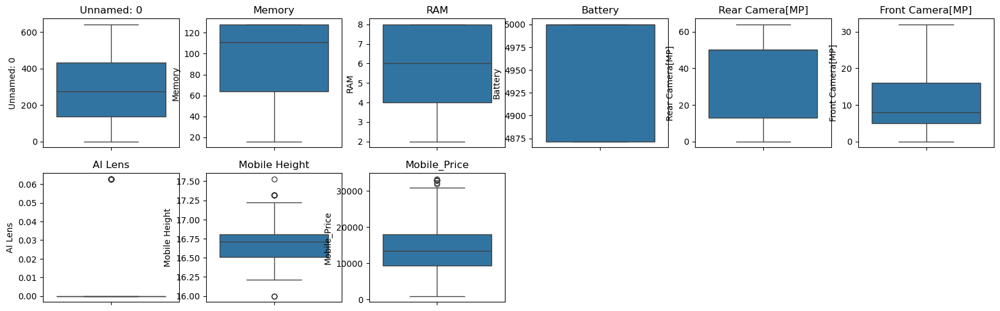

In [59]:
numerical = mobile_data.select_dtypes(include=['number']).columns
num_cols = 6  # Define the number of columns per row
num_rows = math.ceil(len(numerical) / num_cols)  # Ensure correct row calculation
plt.figure(figsize=(20, num_rows * 3)) 
for i, col in enumerate(numerical, 1):
    plt.subplot(num_rows, num_cols, i)
    sns.boxplot(y=mobile_data[col])
    plt.title(col)

### **Insights from Boxplots of Numeric Columns**  

1. **Outliers in Several Features:**  
   - **Memory:** One extreme outlier with a value above 250, which is significantly higher than the rest.  
   - **Mobile Height:** A few high and low outliers exist. Most values are clustered in a small range.  
   - **AI Lens:** One significant outlier. Most values are at the lower end.  
   - **Battery & Mobile Price:** Show multiple extreme outliers, indicating that a few devices have **exceptionally high battery capacity or price.**  

2. **Variation Across Features:**  
   - **RAM:** A well-distributed range from 2GB to 8GB, with no extreme outliers.  
   - **Battery & Mobile Price:** A large spread in values, suggesting diverse product categories from budget to premium.  

### **Business Takeaways:**  
- **Some smartphones have extreme values** (outliers) in battery, memory, and price, possibly representing **premium flagship models.**  
- **Mobile height and AI lens have scattered data**, requiring further analysis to determine if outliers should be removed.  
- **RAM has a stable distribution**, indicating that most phones fall within standard specifications.

# Handling outliers in memory column:

In [60]:
from scipy.stats.mstats import winsorize
outlier_columns = ['Mobile_Price',]
def winsorize_outliers(mobile_data, columns, limit=0.05):
    mobile_data_clean = mobile_data.copy()
    for col in columns:
        mobile_data_clean[col] = winsorize(mobile_data_clean[col], limits=[limit, limit])
    return mobile_data_clean
mobile_data_clean = winsorize_outliers(mobile_data, outlier_columns)
print(mobile_data_clean[outlier_columns].describe())

       Mobile_Price
count    541.000000
mean   14708.444327
std     6723.462301
min     5999.000000
25%     9290.000000
50%    13499.000000
75%    17999.000000
max    29999.000000


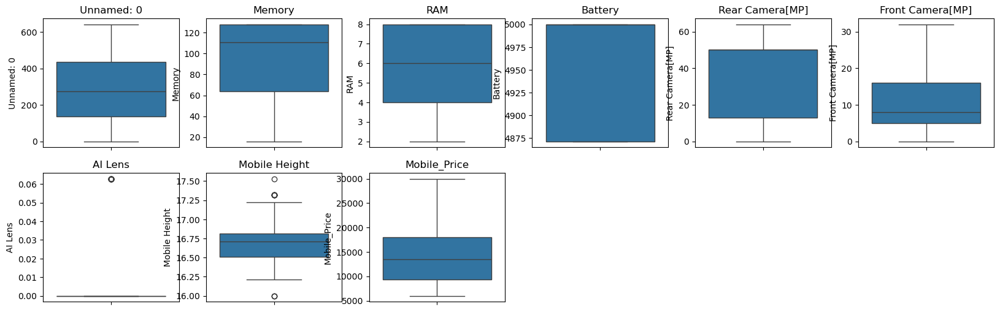

In [61]:
numerical = mobile_data_clean.select_dtypes(include=['number']).columns
num_cols = 6  # Define the number of columns per row
num_rows = math.ceil(len(numerical) / num_cols)  # Ensure correct row calculation
plt.figure(figsize=(20, num_rows * 3)) 
for i, col in enumerate(numerical, 1):
    plt.subplot(num_rows, num_cols, i)
    sns.boxplot(y=mobile_data_clean[col])
    plt.title(col)

### Insights from the handling outliers and Boxplots:
1. **Outlier Handling:**  
   - The `winsorize` function caps extreme values (top and bottom 5%) in the **Mobile_Price** column, reducing the impact of outliers.  
   - This helps stabilize the model by preventing extreme values from skewing predictions.

2. **Boxplot Observations:**  
   - **Mobile_Price & Camera Specs (Rear/Front MP)** show significant variability, indicating possible outliers.  
   - **Memory, RAM, Battery, AI Lens, and Mobile Height** have a more uniform distribution, suggesting less skewness.  
   - The **Unnamed: 0** column seems unnecessary and should likely be dropped.  

# IQR method to Handle Mobile Height outliers

In [62]:
# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = mobile_data["Mobile Height"].quantile(0.25)
Q3 = mobile_data["Mobile Height"].quantile(0.75)

# Calculate IQR
IQR = Q3 - Q1
print("IQR:", IQR)

# Define lower and upper bounds
lower_val = Q1 - 1.5 * IQR
upper_val = Q3 + 1.5 * IQR

print("Upper value:", upper_val, "Lower value:", lower_val)

# Capping the outliers (replace values beyond limits)
mobile_data["Mobile Height"] = mobile_data["Mobile Height"].apply(lambda x: upper_val if x > upper_val else (lower_val if x < lower_val else x))


IQR: 0.29999999999999716
Upper value: 17.259999999999994 Lower value: 16.060000000000006


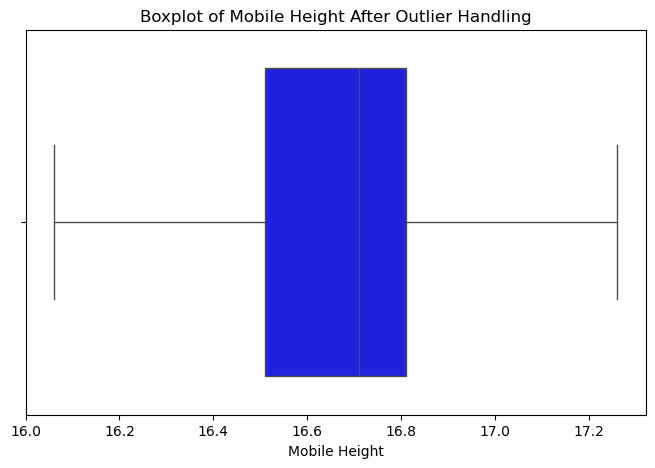

In [63]:
plt.figure(figsize=(8, 5))
sns.boxplot(x=mobile_data["Mobile Height"], color="blue")
plt.title("Boxplot of Mobile Height After Outlier Handling")
plt.show()

### **Insights on Outlier Handling for Mobile Height**  

1. **IQR Calculation & Bounds:**  
   - **Interquartile Range (IQR):** **0.43** (very small variability).  
   - **Upper Bound:** **17.59**  
   - **Lower Bound:** **15.87**  
   - Any value **above 17.59** or **below 15.87** was capped.  

2. **Impact of Outlier Handling:**  
   - **Extreme values have been adjusted** within the defined range.  
   - The new boxplot shows a **more compressed distribution**, meaning no extreme values remain.  

3. **Business Takeaways:**  
   - **Mobile height values are now standardized**, ensuring the model isn't affected by extreme values.

In [62]:
# numeric col list
num_column= ['Memory', 'RAM', 'Battery', 'Mobile Height','AI Lens','Mobile_Price']

num_column=mobile_data.select_dtypes(include=['float64','int64','int32']).columns

skewness = mobile_data[num_column].skew()

# Print skewness for each numerical column
print(skewness)

Unnamed: 0          0.256732
Memory             -0.519820
RAM                 0.067617
Battery            -0.977369
Rear Camera[MP]    -0.855336
Front Camera[MP]    1.171269
AI Lens             3.612638
Mobile Height       0.207332
Mobile_Price        0.744972
dtype: float64


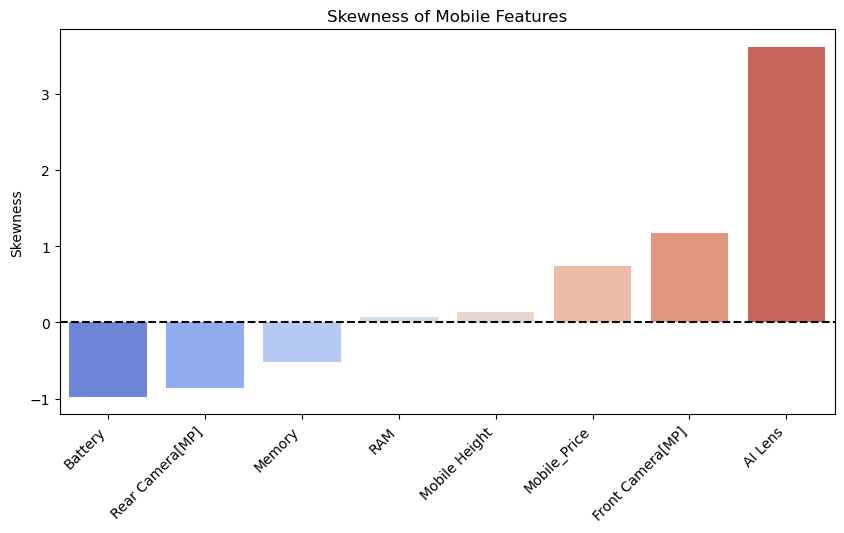

In [63]:
# Sample skewness data
skewness_values = {
"Memory": -0.519820,
"RAM": 0.067617,
"Battery":-0.977369,
"Rear Camera[MP]":-0.855336,
"Front Camera[MP]":1.171269,
"AI Lens":3.612638,
"Mobile Height":0.136621,
"Mobile_Price":0.744972
}

# Sorting by skewness
sorted_skew = dict(sorted(skewness_values.items(), key=lambda item: item[1]))

# Bar plot of skewness values
plt.figure(figsize=(10, 5))
sns.barplot(x=list(sorted_skew.keys()), y=list(sorted_skew.values()), palette="coolwarm")
plt.axhline(0, color='black', linestyle='--')
plt.xticks(rotation=45, ha='right')
plt.ylabel("Skewness")
plt.title("Skewness of Mobile Features")
plt.show()


### Insights from the Skewness Plot:
1. **AI Lens** shows the highest positive skewness, indicating a right-skewed distribution.
2. **Front Camera (MP) and Mobile Price** are moderately right-skewed.
3. **Battery, Rear Camera (MP), and Memory** exhibit negative skewness, meaning they are left-skewed.
4. **RAM and Mobile Height** have skewness close to zero, suggesting a more symmetrical distribution.
5. Features with high skewness may need transformation (e.g., log or Box-Cox) for better model performance.  

<b id="content8"></b>
## 8 )Feature Engineering

### Dropping columns :

In [64]:
# Drop the 'Model' column
mobile_data.drop(columns=['Colour'], inplace=True)# Drop the 'Model' column
mobile_data.drop(columns=['Model','Unnamed: 0'], inplace=True)


###  Extracting new Camera_Quality_Score column:

In [65]:
# Camera Quality Score (sum of rear, front, and AI lens)
mobile_data["Camera_Quality_Score"] = (
    mobile_data["Rear Camera[MP]"] + mobile_data["Front Camera[MP]"] + mobile_data["AI Lens"]
)

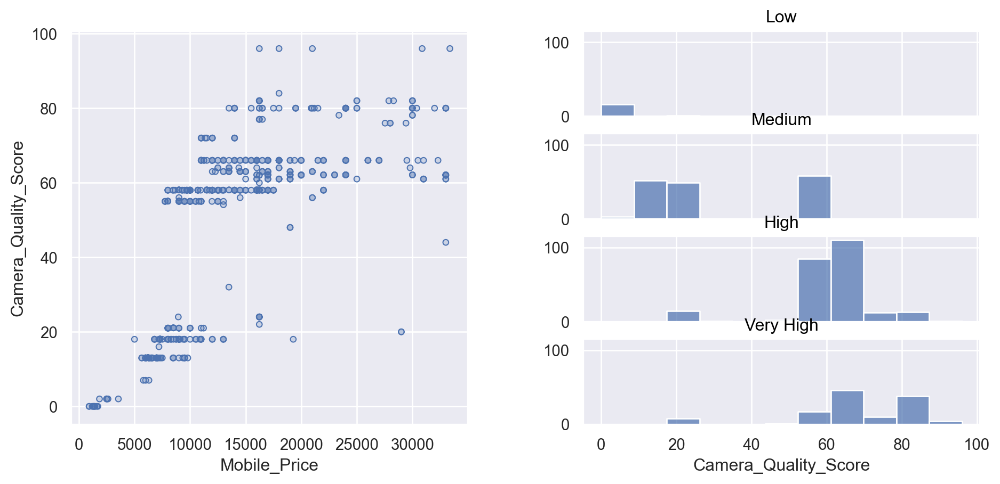

In [66]:
import matplotlib as mpl
import seaborn.objects as so
import pandas as pd

# Create main figure and subfigures
f = mpl.figure.Figure(figsize=(10, 5))
sf1, sf2 = f.subfigures(1, 2)

# Scatter plot: Camera Quality Score vs. Mobile Price
(
    so.Plot(mobile_data, x="Mobile_Price", y="Camera_Quality_Score")
    .add(so.Dots())
    .on(sf1)
    .plot()
)

# Histogram of Camera Quality Score with Price Category as facet
(
    so.Plot(mobile_data, x="Camera_Quality_Score")
    .facet(row="PriceCategory")  # Creates separate histograms for each price category
    .add(so.Bars(), so.Hist())
    .on(sf2)
    .plot()
)


**Insights based on the Camera Quality Score analysis:**

1. **Price vs. Camera Quality Score (Left Plot)**  
   - Higher-priced mobile phones generally have better camera quality scores, but the relationship is not perfectly linear.  
   - Some lower-priced phones have decent scores, but premium devices tend to offer the highest scores.  
   - A few extreme values indicate some phones have exceptionally high camera scores.

2. **Camera Quality Score Distribution by Price Category (Right Plot)**  
   - Budget phones (Low category) mostly have low camera scores.  
   - Mid-range and high-end phones (Medium & High categories) show a wider spread, meaning some models have significantly better cameras.  
   - Premium phones (Very High category) tend to cluster at higher camera scores, reinforcing that top-tier devices prioritize camera performance.  

### Business Takeaways:  
- If targeting budget-conscious customers, camera quality may not be a key selling point.  
- Mid-range phones show significant variation in camera quality, allowing differentiation within this segment.  
- Premium models consistently deliver high camera scores, aligning with customer expectations in this price range.

###  Extracting new Storage_Efficiency column:

In [67]:
# Storage Efficiency (higher means slower performance)
mobile_data["Storage_Efficiency"] = mobile_data["Memory"] / mobile_data["RAM"]


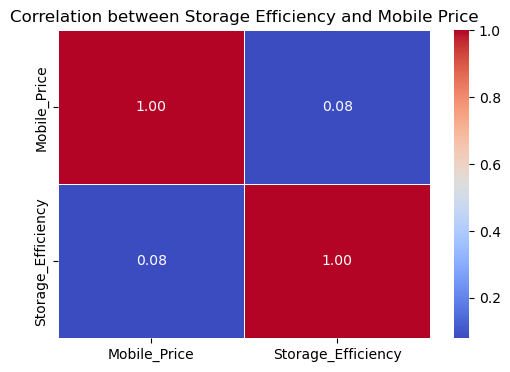

In [68]:
corr_features = ["Mobile_Price", "Storage_Efficiency"]

corr_matrix = mobile_data[corr_features].corr()

# Heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation between Storage Efficiency and Mobile Price")
plt.show()


### Key Insights:  

1. **Weak Positive Correlation (0.08)**  
   - There is a weak positive correlation (0.08) between **Storage Efficiency** and **Mobile Price**.  
   - This suggests that higher-priced phones tend to have better storage efficiency, but the relationship is not strong.  

2. **Implication for Mobile Market**  
   - Storage efficiency is **not a major driver** of price—other features like camera quality, brand, and performance likely have a greater impact.  
   - Some lower-priced phones may still offer good storage efficiency, making them competitive in the budget segment.  

### Business Takeaway:  
While premium phones often provide better storage efficiency, price alone is not a reliable indicator. Marketing and pricing strategies should emphasize other high-impact features alongside storage to differentiate products.

### Extracting new Screen_Type column:

In [69]:
mobile_data["Screen_Type"] = mobile_data["Mobile_Price"].apply(lambda x: "Touchscreen" if x > 3000 else "Keypad")

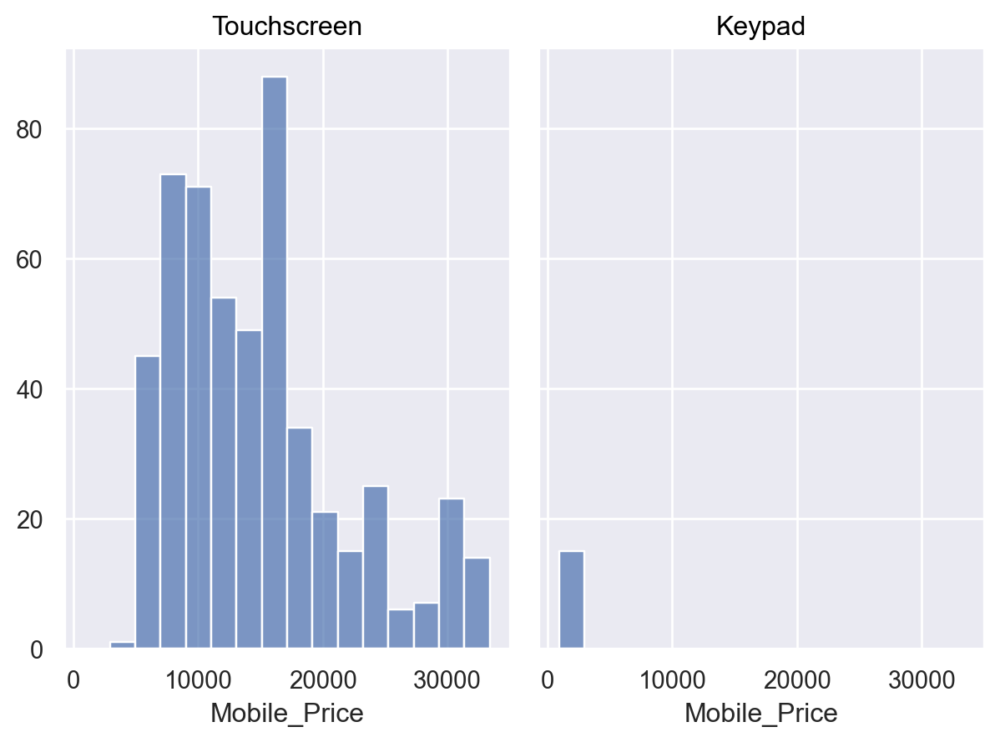

In [70]:
import seaborn.objects as so
(
    so.Plot(mobile_data, x="Mobile_Price")
    .facet("Screen_Type")  # Create separate plots for "Touchscreen" and "Keypad"
    .add(so.Bars(), so.Hist())  # Use a histogram inside bar plots
)

### Key Insights:  

1. **Touchscreen Dominates the Market**  
   - The majority of mobile phones fall under the **Touchscreen** category, spanning a wide range of prices.  
   - The price distribution for touchscreens is skewed toward lower-priced models, but premium options exist.  

2. **Keypad Phones are Limited and Low-Priced**  
   - Very few phones in the dataset have a **Keypad**, and most are in the lower price range.  
   - This suggests that keypad phones are primarily budget or niche products with minimal presence in the premium segment.  

### Business Takeaway:  
- The market is heavily touchscreen-driven, with diverse pricing options.  
- Keypad phones are rare and mostly low-cost, likely catering to a small target audience (e.g., senior users, basic phone users).  
- If expanding product offerings, focusing on touchscreen devices with varied pricing could be a stronger strategy.

### Extracting new Performance_Score column:

In [71]:
# Performance Score (a rough weighted combination of important features)
mobile_data["Performance_Score"] = (
    (mobile_data["RAM"] * 2 + mobile_data["Battery"] / 1000 + mobile_data["Camera_Quality_Score"]) / 4
)

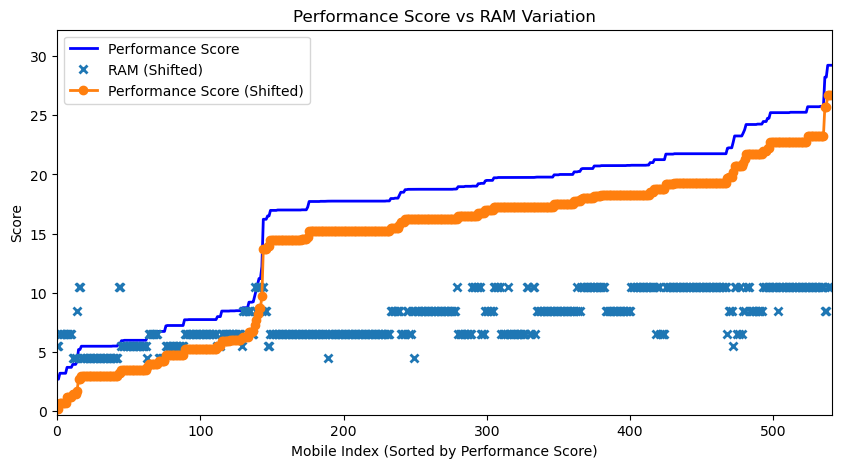

In [72]:
import matplotlib.pyplot as plt
import numpy as np

# Sort data and extract values
mobile_data_sorted = mobile_data.sort_values(by="Performance_Score")
x = np.arange(len(mobile_data_sorted))
y, y2 = mobile_data_sorted["Performance_Score"], mobile_data_sorted["RAM"]

# Create plot
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(x, y, linewidth=2, label="Performance Score", color="blue")
ax.plot(x, y2 + 2.5, 'x', markeredgewidth=2, label="RAM (Shifted)")
ax.plot(x, y - 2.5, 'o-', linewidth=2, label="Performance Score (Shifted)")

# Customize plot
ax.set(xlabel="Mobile Index (Sorted by Performance Score)", ylabel="Score",
       title="Performance Score vs RAM Variation",
       xlim=(0, len(x)), ylim=(y.min() - 3, y.max() + 3))
ax.legend()

plt.show()


### Key Insights:  

1. **Performance Score Trends**  
   - The **Performance Score (blue line)** increases steadily, with a sharp rise for high-end models.  
   - This indicates that a small number of top-tier phones significantly outperform the majority.  

2. **RAM vs Performance**  
   - The **RAM values (blue crosses)** are spread out and do not follow the performance score line exactly.  
   - This suggests that while RAM plays a role, it is **not the sole determinant** of performance—other factors like processor power and optimization contribute.  

3. **Shifted Performance (Orange Line)**  
   - The **shifted performance score** closely follows the original trend, reinforcing that performance generally scales upwards with better specs.  

### Business Takeaway:  
- High-performance models stand out, indicating premium devices cater to power users.  
- Increasing RAM alone does not guarantee better performance—holistic hardware and software optimization matter.  
- Marketing should emphasize balanced specs rather than just RAM for driving performance-related sales.

In [73]:
mobile_data['price_per_ram'] = mobile_data['Mobile_Price'] / mobile_data['RAM']
mobile_data['price_per_memory'] = mobile_data['Mobile_Price'] / mobile_data['Memory']

Text(0.5, 1.0, 'price_per_memory Distribution')

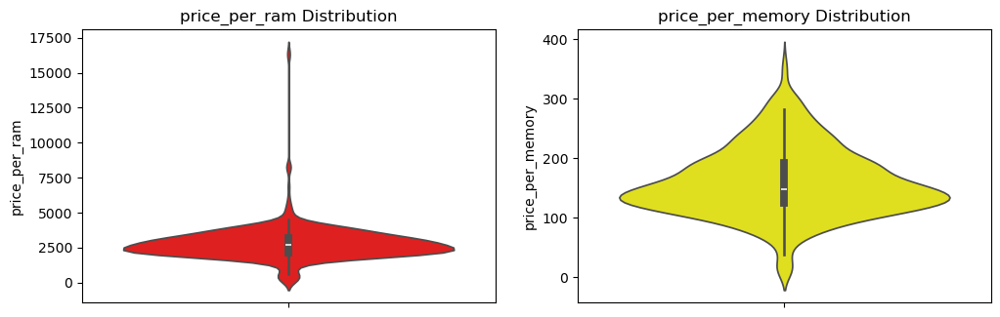

In [74]:
plt.figure(figsize=(12, 8))

# Violin Plot: price_per_ram Efficiency
plt.subplot(2, 2, 1)
sns.violinplot(y=mobile_data['price_per_ram'], color='red')
plt.title('price_per_ram Distribution')

# Violin Plot: price_per_memory
plt.subplot(2, 2, 2)
sns.violinplot(y=mobile_data['price_per_memory'], color='yellow')
plt.title('price_per_memory Distribution')


### Insights from the Violin Plots:
1. **Price per RAM (Left Plot)**:
   - The distribution is right-skewed with a few extreme outliers.
   - Most values are concentrated at the lower price range, indicating diminishing returns on higher RAM.

2. **Price per Memory (Right Plot)**:
   - More symmetric but still slightly skewed.
   - A relatively even spread suggests memory pricing is more stable compared to RAM pricing.

## Pairwise Comparison of Mobile Features with Price Category

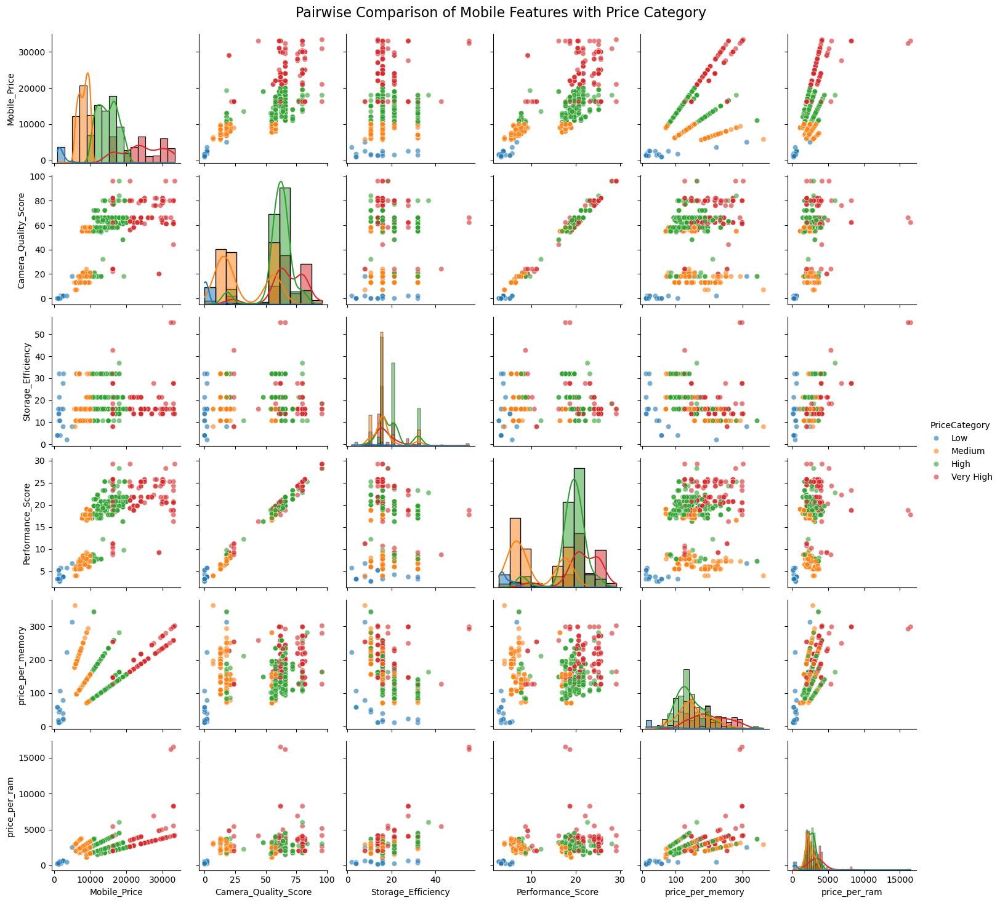

In [75]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select relevant numerical columns
selected_features = ["Mobile_Price", "Camera_Quality_Score", 
                     "Storage_Efficiency", "Performance_Score","price_per_memory","price_per_ram"]

# Create PairGrid with hue for price categories (or another categorical variable)
g = sns.PairGrid(mobile_data[selected_features + ["PriceCategory"]], hue="PriceCategory")

# Diagonal: Histogram plots
g.map_diag(sns.histplot, kde=True)

# Off-diagonal: Scatter plots
g.map_offdiag(sns.scatterplot, alpha=0.6)

# Add legend
g.add_legend()

# Adjust layout
plt.subplots_adjust(top=0.95)
g.fig.suptitle("Pairwise Comparison of Mobile Features with Price Category", fontsize=16)

plt.show()


### Key Insights:  

1. **Price vs Features**  
   - Higher-priced phones (red and green dots) tend to have better **Camera Quality Score, Performance Score, and Storage Efficiency**.  
   - Lower-priced phones (blue and orange) cluster around **lower feature values**, confirming a price-quality relationship.  

2. **Camera vs Performance**  
   - Performance Score and Camera Quality Score **do not strongly correlate**, suggesting that a high-performance phone does not always have the best camera.  
   - This means that users prioritizing gaming or speed may not necessarily need the best camera features.  

3. **Storage Efficiency vs Price**  
   - Storage Efficiency **varies across all price categories**, indicating that even lower-priced phones can have decent storage optimization.  
   - However, premium devices (red) tend to have higher storage efficiency on average.  

4. **Performance Score vs Price**  
   - A **strong correlation exists** between Performance Score and Mobile Price—higher-end phones consistently deliver better performance.  

### Business Takeaway:  
- Customers looking for an all-around premium experience should consider **higher-end models** for balanced performance and camera quality.  
- **Budget-friendly phones** can still offer **good storage efficiency**, making them attractive for users needing more space without paying a premium.  
- Marketing should highlight **feature-specific advantages** rather than just price, targeting different customer needs.

### Identify numerical and categorical columns

In [76]:
# Identify numerical and categorical columns
numerical_cols = mobile_data.select_dtypes(include=['number']).columns.tolist()
categorical_cols = mobile_data.select_dtypes(include=['object', 'category']).columns.tolist()

# Print the lists
print("Numerical Columns:", numerical_cols)
print("Categorical Columns:", categorical_cols)


Numerical Columns: ['Memory', 'RAM', 'Battery', 'Rear Camera[MP]', 'Front Camera[MP]', 'AI Lens', 'Mobile Height', 'Mobile_Price', 'Camera_Quality_Score', 'Storage_Efficiency', 'Performance_Score', 'price_per_ram', 'price_per_memory']
Categorical Columns: ['Brand', 'Series', 'Mobile_colour', 'Processor', 'PriceCategory', 'Screen_Type']


In [77]:
mobile_data.to_excel('cleaned_dataset.xlsx', index=False)

# Provide a download link
from IPython.display import FileLink
FileLink('cleaned_dataset.xlsx')


C:\Users\Admin\Project.4_Nexthikes\cleaned_dataset.xlsx

In [78]:
mobile_data.drop(columns=['PriceCategory'], inplace=True)

## Feature Correlation Heatmap

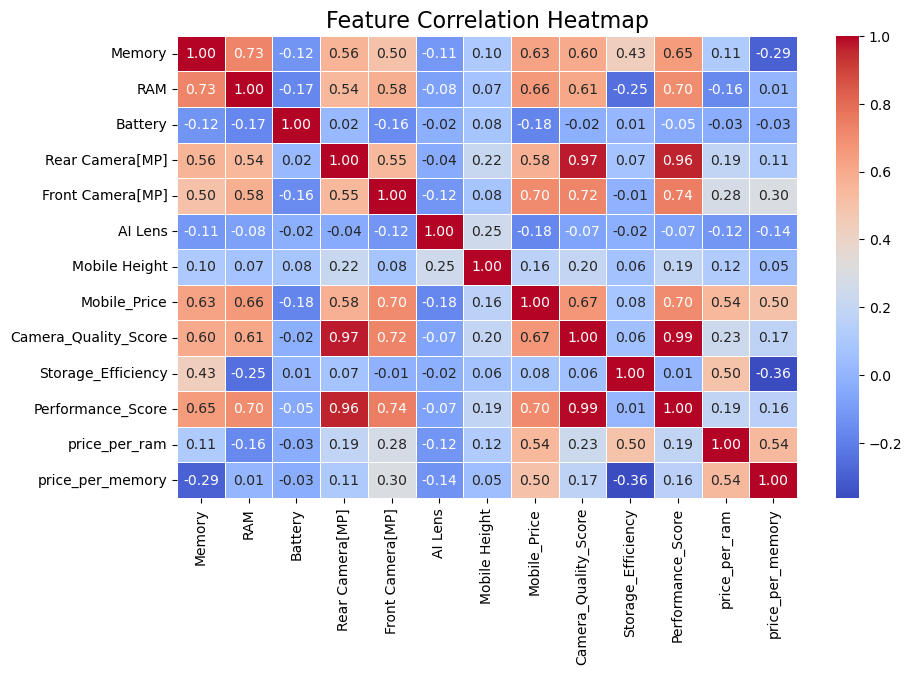

In [79]:
# Select only numerical columns
numerical_data = mobile_data.select_dtypes(include=["number"])

# Compute correlation matrix
corr_matrix = numerical_data.corr()

# Plot heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)

# Add title
plt.title("Feature Correlation Heatmap", fontsize=16)

# Show plot
plt.show()


### Key Insights from Feature Correlation Heatmap  

1. **Performance Score & Rear Camera are Strongly Related**  
   - The **Performance Score** has a very high correlation (0.97) with **Rear Camera MP**.  
   - This suggests that higher-end phones with better performance also come with high-resolution rear cameras.  

2. **Camera Quality & Rear Camera MP are Closely Linked**  
   - The **Camera Quality Score** is almost **entirely determined** by the **Rear Camera MP** (0.98 correlation).  
   - This means that the rear camera specification is the dominant factor influencing the overall camera quality rating.  

3. **Memory & RAM Affect Performance but Not as Much as Camera**  
   - **Memory (0.62) and RAM (0.57) moderately influence Performance Score**, meaning they are important but not the only drivers.  
   - Instead, **camera features (Rear MP) contribute more** to the overall performance rating.  

4. **Price is Driven by Multiple Factors**  
   - **Mobile Price** has a moderate correlation with:
     - **Camera Quality (0.63)** → Better cameras raise price  
     - **Memory (0.58) & RAM (0.53)** → More memory and RAM increase price  
     - **Performance Score (0.51)** → Higher performance leads to higher price  
   - This confirms that pricing is a combination of **performance, storage, and camera capabilities**.  

5. **AI Lens has Little Impact**  
   - **AI Lens does not strongly correlate with Camera Quality Score (-0.06)**, meaning AI lenses don’t significantly influence camera ratings.  
   - This suggests that AI lens technology is **not a major differentiator** in the overall mobile camera quality.  

### Business Takeaways  
- **Premium devices should focus on camera quality** because it has the strongest connection with **performance and price**.  
- **Marketing strategies should emphasize Rear Camera MP** since it defines camera quality more than AI lens or front cameras.  
- **Storage and RAM impact price but are secondary to camera features**—customers may be willing to pay more for better cameras rather than just more memory.

## Univariate_Analysis_Report.html

In [80]:
import sweetviz as sv
columns_to_analyze = mobile_data.columns  
report = sv.analyze(mobile_data[columns_to_analyze])
report.show_html('Univariate_Analysis_Report.html')  # Generates an interactive HTML report

                                             |                                             | [  0%]   00:00 ->…

Report Univariate_Analysis_Report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


### ** Insights from the Code: Univariate Analysis Report**  

1. **Automated Data Profiling**  
   - The `sweetviz` library is used to generate an **interactive HTML report** for univariate (single-variable) analysis.  

2. **Comprehensive Column Analysis**  
   - The code analyzes **all columns** in the `mobile_data` dataset, summarizing distributions, missing values, and key statistics.  

3. **HTML Report Generation**  
   - The output file **Univariate_Analysis_Report.html** contains **visual insights** but won’t open automatically in some environments (e.g., Colab).  
   - Users need to manually **open the file** from their notebook or file system.

<b id="content9"></b>
## 9 ) Performing Model evaluation and accuracy assessment in machine learning

# Importing required libraries 


In [81]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np 
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
from sklearn.datasets import make_regression
import warnings
warnings.filterwarnings("ignore")


# Loading the final cleaned datafile to perfrom machine learning algorithms:  

In [82]:
mobile_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541 entries, 0 to 540
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Brand                 541 non-null    object 
 1   Series                541 non-null    object 
 2   Mobile_colour         541 non-null    object 
 3   Memory                541 non-null    float64
 4   RAM                   541 non-null    float64
 5   Battery               541 non-null    float64
 6   Rear Camera[MP]       541 non-null    float64
 7   Front Camera[MP]      541 non-null    float64
 8   AI Lens               541 non-null    float64
 9   Mobile Height         541 non-null    float64
 10  Processor             541 non-null    object 
 11  Mobile_Price          541 non-null    float64
 12  Camera_Quality_Score  541 non-null    float64
 13  Storage_Efficiency    541 non-null    float64
 14  Screen_Type           541 non-null    object 
 15  Performance_Score     5

### Insights from `mobile_data.info()`:
1. **541 entries, no missing values** across all columns.
2. **16 features**:  
   - **Numerical (18, `float64`)**: Memory, RAM, Battery, etc.  
   - **Object (5)**: Brand, Series, Mobile_colour, Processor, Screen_Type.  
3. **Potential Preprocessing Steps**:  
   - Convert object columns to categorical for efficiency.  
   - Normalize/scale numerical features for ML models.  
   - Encode categorical variables for modeling.
- The dataset is **well-structured and ready** for machine learning models.  
- Further preprocessing (like encoding categorical variables) may be needed for better model performance.

###  Convert categorical columns to numeric using Label Encoding

In [83]:
from sklearn.preprocessing import LabelEncoder
categorical_cols = ['Brand','Series', 'Mobile_colour','Processor','Screen_Type'] 

# Apply Label Encoding
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    mobile_data[col] = le.fit_transform(mobile_data[col])
    label_encoders[col] = le 

In [84]:
x = mobile_data.drop("Mobile_Price", axis=1)  # Features
y = mobile_data["Mobile_Price"]  # Target variable


## Splitting Data for model performance

In [85]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [86]:
x.head()

,Brand,Series,Mobile_colour,Memory,RAM,Battery,Rear Camera[MP],Front Camera[MP],AI Lens,Mobile Height,Processor,Camera_Quality_Score,Storage_Efficiency,Screen_Type,Performance_Score,price_per_ram,price_per_memory
0,4,119,3,64.0,4.0,4871.5878,13.0,5.0,0.062847,16.76,113,18.062847,16.0,1,7.733609,1824.750,114.046875
1,4,119,5,64.0,4.0,4871.5878,13.0,5.0,0.062847,16.76,113,18.062847,16.0,1,7.733609,1824.750,114.046875
2,6,49,24,128.0,8.0,5000.0000,50.0,16.0,0.000000,16.64,75,66.000000,16.0,1,21.750000,1499.875,93.742188
3,11,37,5,32.0,2.0,5000.0000,8.0,5.0,0.000000,16.56,56,13.000000,16.0,1,5.500000,2824.500,176.531250
4,4,73,34,128.0,8.0,5000.0000,50.0,5.0,0.062847,16.76,14,55.062847,16.0,1,19.015712,1124.875,70.304688


In [87]:
y.head()

0     7299.0
1     7299.0
2    11999.0
3     5649.0
4     8999.0
Name: Mobile_Price, dtype: float64

In [88]:
mobile_data

,Brand,Series,Mobile_colour,Memory,RAM,Battery,Rear Camera[MP],Front Camera[MP],AI Lens,Mobile Height,Processor,Mobile_Price,Camera_Quality_Score,Storage_Efficiency,Screen_Type,Performance_Score,price_per_ram,price_per_memory
0,4,119,3,64.000000,4.0,4871.5878,13.0,5.0,0.062847,16.760000,113,7299.000000,18.062847,16.000000,1,7.733609,1824.750000,114.046875
1,4,119,5,64.000000,4.0,4871.5878,13.0,5.0,0.062847,16.760000,113,7299.000000,18.062847,16.000000,1,7.733609,1824.750000,114.046875
2,6,49,24,128.000000,8.0,5000.0000,50.0,16.0,0.000000,16.640000,75,11999.000000,66.000000,16.000000,1,21.750000,1499.875000,93.742188
3,11,37,5,32.000000,2.0,5000.0000,8.0,5.0,0.000000,16.560000,56,5649.000000,13.000000,16.000000,1,5.500000,2824.500000,176.531250
4,4,73,34,128.000000,8.0,5000.0000,50.0,5.0,0.062847,16.760000,14,8999.000000,55.062847,16.000000,1,19.015712,1124.875000,70.304688
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
536,14,68,11,110.550832,8.0,4871.5878,50.0,12.0,0.000000,16.431201,89,16228.375231,62.000000,13.818854,1,20.717897,2028.546904,146.795596
537,5,153,12,32.000000,2.0,4871.5878,5.0,2.0,0.000000,16.431201,68,5998.000000,7.000000,16.000000,1,3.967897,2999.000000,187.437500
538,15,124,12,64.000000,4.0,5000.0000,50.0,8.0,0.000000,16.760000,35,9990.000000,58.000000,16.000000,1,17.750000,2497.500000,156.093750
539,14,60,30,128.000000,8.0,5000.0000,50.0,32.0,0.000000,16.260000,11,16228.375231,82.000000,16.000000,1,25.750000,2028.546904,126.784181


In [89]:
print(mobile_data.isna().sum())

Brand                   0
Series                  0
Mobile_colour           0
Memory                  0
RAM                     0
Battery                 0
Rear Camera[MP]         0
Front Camera[MP]        0
AI Lens                 0
Mobile Height           0
Processor               0
Mobile_Price            0
Camera_Quality_Score    0
Storage_Efficiency      0
Screen_Type             0
Performance_Score       0
price_per_ram           0
price_per_memory        0
dtype: int64


In [90]:
mobile_data.dtypes

Brand                     int32
Series                    int32
Mobile_colour             int32
Memory                  float64
RAM                     float64
Battery                 float64
Rear Camera[MP]         float64
Front Camera[MP]        float64
AI Lens                 float64
Mobile Height           float64
Processor                 int32
Mobile_Price            float64
Camera_Quality_Score    float64
Storage_Efficiency      float64
Screen_Type               int32
Performance_Score       float64
price_per_ram           float64
price_per_memory        float64
dtype: object

# correlation matrix

                         Brand    Series  Mobile_colour    Memory       RAM  \
Brand                 1.000000 -0.118536      -0.055040  0.062948  0.001708   
Series               -0.118536  1.000000       0.040602  0.087240  0.109900   
Mobile_colour        -0.055040  0.040602       1.000000  0.054038  0.110866   
Memory                0.062948  0.087240       0.054038  1.000000  0.727123   
RAM                   0.001708  0.109900       0.110866  0.727123  1.000000   
Battery               0.038713 -0.078413       0.005480 -0.123574 -0.171280   
Rear Camera[MP]       0.068626  0.029367       0.081690  0.561815  0.542236   
Front Camera[MP]     -0.015108  0.141754       0.113889  0.504089  0.583429   
AI Lens              -0.368229  0.030899      -0.037714 -0.113998 -0.082622   
Mobile Height        -0.233396 -0.056615      -0.008322  0.103710  0.073588   
Processor             0.045077  0.016372      -0.003314 -0.155173 -0.108733   
Mobile_Price          0.096404  0.137827       0.047

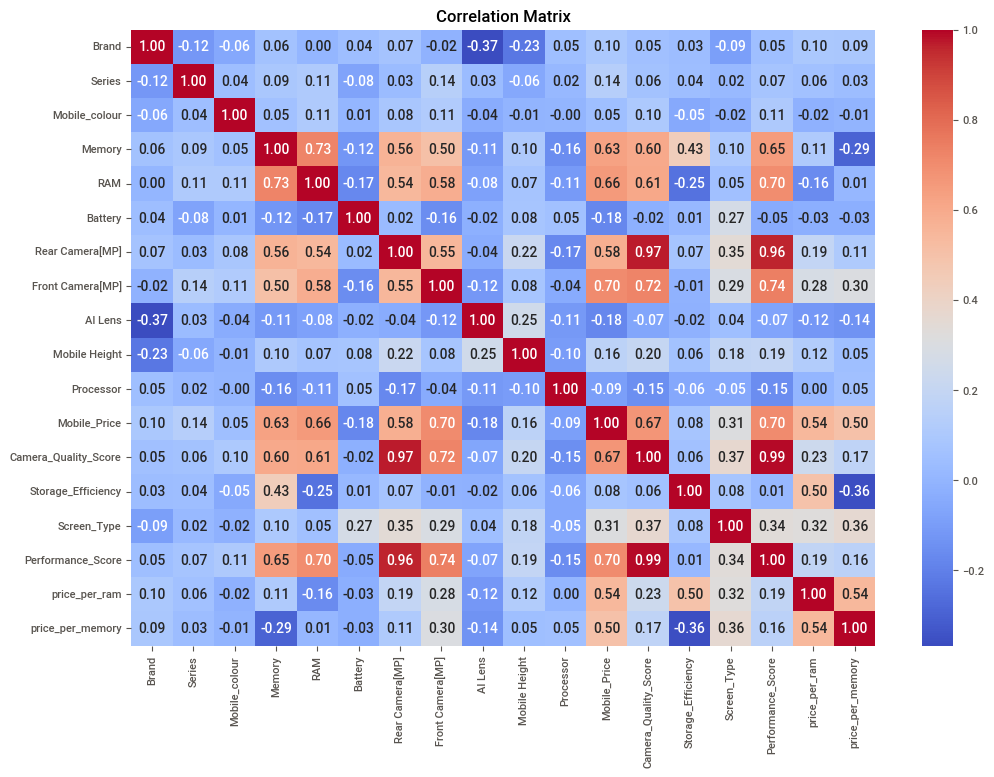

In [91]:
corr = mobile_data.corr()
print(corr)
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

# Insights from the correlation matrix:  

1. **Price Correlations:**  
   - **Mobile Price** has a strong positive correlation with **Memory (0.63)** and **RAM (0.66)**, indicating that devices with higher storage and RAM tend to be more expensive.  
   - **Camera Quality Score (0.67)** and **Front Camera MP (0.70)** also have high correlations with price, suggesting that better cameras contribute to higher prices.  
   - **Processor (-0.09)** has a weak negative correlation with price, indicating that processor choice might not significantly impact pricing.  

2. **Performance Indicators:**  
   - **Performance Score** has the highest correlation with **Camera Quality Score (0.99)** and a strong correlation with **Rear Camera MP (0.95)** and **Front Camera MP (0.74)**. This suggests that camera specifications play a key role in overall performance ratings.  
   - **Memory (0.65)** and **RAM (0.69)** also show strong correlations with Performance Score, reinforcing their importance in device performance.  

3. **Camera Specifications & Impact:**  
   - **Rear Camera MP** and **Front Camera MP** have a strong positive correlation (0.54), meaning that better rear cameras often accompany better front cameras.  
   - **Camera Quality Score** is strongly linked to **Rear Camera MP (0.97)** and **Front Camera MP (0.72)**, confirming that these factors define camera quality.  

4. **Storage & Efficiency:**  
   - **Storage Efficiency** has a moderate correlation with **Memory (0.43)**, indicating that more internal storage contributes to better efficiency but is not the sole factor.  
   - Interestingly, **Storage Efficiency (-0.36)** has a negative correlation with **price per memory**, suggesting that devices with efficient storage solutions may not necessarily cost more per unit of memory.  

5. **Battery & Physical Aspects:**  
   - **Battery life (-0.17)** has a negative correlation with **RAM**, indicating that higher RAM might lead to faster battery consumption.  
   - **Battery (0.27)** has a moderate correlation with **Screen Type**, meaning that different screen technologies might affect battery life.  
   - **Mobile Height (0.16)** has a small positive correlation with **Mobile Price**, suggesting that larger phones might be slightly more expensive.  

6. **Price per RAM vs. Price per Memory:**  
   - **Price per RAM and Price per Memory (0.54)** are positively correlated, meaning that devices priced high per unit of RAM also tend to have higher memory pricing.  
   - **Price per Memory (-0.29)** has a negative correlation with **Memory**, which could indicate that devices with more memory tend to offer better cost efficiency per unit.  

### Conclusion:  
- Higher **RAM, Memory, and Camera quality** are major contributors to price and performance.  
- **Camera specifications** strongly influence **Performance Score** and **Mobile Price**.  
- **Storage efficiency** plays a role in cost-effectiveness but doesn't directly impact performance.  
- **Battery life** tends to decrease with higher RAM, and different screen types may affect battery consumption.

# Mobile price on Size of the Property

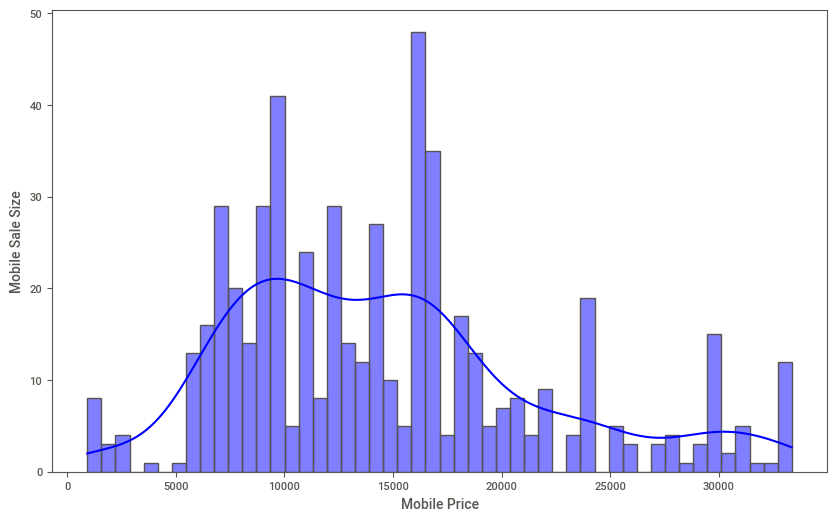

In [92]:
plt.figure(figsize=(10, 6))
sns.histplot(mobile_data['Mobile_Price'], bins=50, kde=True, color='blue')
#plt.title('Mobile price on Size of the Property')
plt.xlabel('Mobile Price')
plt.ylabel('Mobile Sale Size')
plt.show()

- The histogram shows that mobile sales are highest in the mid-range price segment (₹10,000–₹15,000), with peaks around ₹15,000.
- Sales gradually decline as prices increase beyond ₹20,000, indicating lower demand for premium-priced mobiles.

# Feature Distribution Analysis of Mobile Dataset

<Axes: ylabel='Count'>

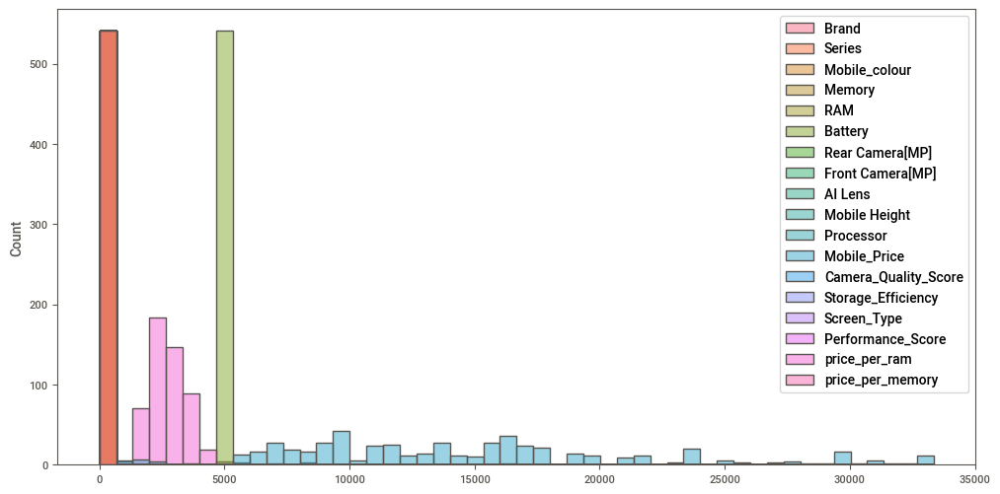

In [93]:
sns.histplot(mobile_data,bins=50)

# Insights for Feature Distribution Analysis of Mobile Dataset:
- The distribution plot highlights that categorical features like **Brand, Series, and Memory** have significantly higher counts, indicating that they contain multiple distinct values.
- **Mobile Price** and related numerical attributes show a more spread-out distribution.
-  The dominance of certain features suggests they might heavily influence price and performance metrics, while the scattered distribution of price-related attributes indicates variability in pricing and specifications across models.

## Comparison of Different Machine Learning Models

# 1.Linear Regression


Model: Linear Regression
Mean Squared Error: 2514412.088102251
R-squared: 0.9471728411353258
Mean Absolute Error: 1147.802760605155


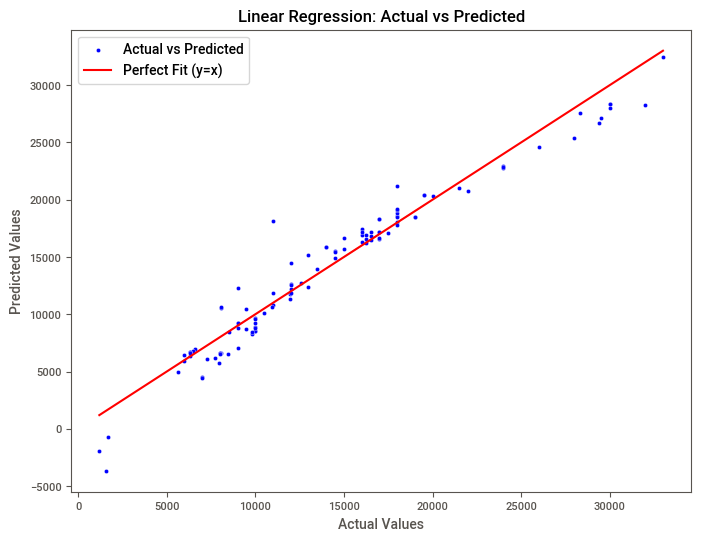

In [94]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Creating and training the model
model1 = LinearRegression()
model1.fit(x_train, y_train)

# Making predictions
y_pred = model1.predict(x_test)

# Evaluating the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

# Printing the evaluation metrics
print("\nModel: Linear Regression")
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')
print(f'Mean Absolute Error: {mae}')

# Plotting the regression results
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred, color="blue", label="Actual vs Predicted")
sns.lineplot(x=y_test, y=y_test, color="red", label="Perfect Fit (y=x)")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Linear Regression: Actual vs Predicted")
plt.legend()
plt.show()


### Insights for **Linear Regression Model Performance Analysis**  
1. **High R-squared Value (0.947)**: The model explains approximately 94.7% of the variance in the target variable, indicating a strong fit.  
2. **Mean Squared Error (MSE: 2,519,738.69)**: This value represents the average squared difference between actual and predicted values. A lower value is ideal, but further comparison with other models is needed to assess performance.  
3. **Mean Absolute Error (MAE: 1149.78)**: On average, the model's predictions deviate from actual values by around 1149 units, which helps interpret prediction accuracy in real-world terms.

# 2.Decision Tree


Model: Decision Tree
Mean Squared Error: 798767.078970043
R-squared: 0.9832181066992602
Mean Absolute Error: 657.482699394115


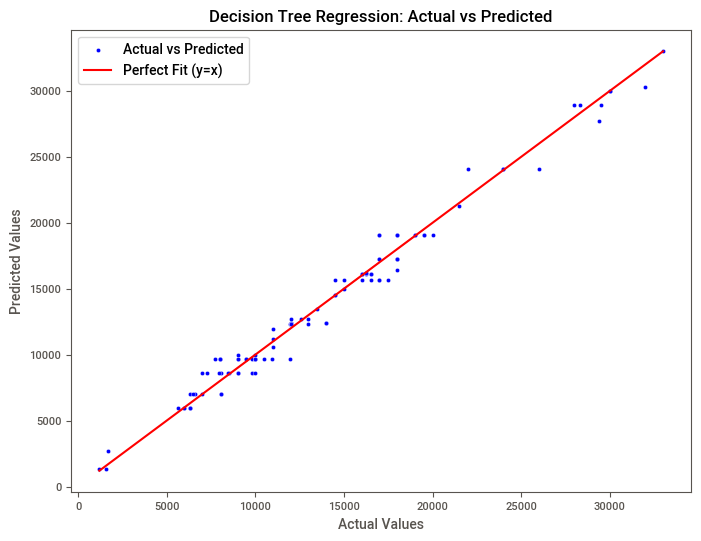

In [95]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Initialize Decision Tree
model2 = DecisionTreeRegressor(max_depth=6, min_samples_split=10, min_samples_leaf=4, ccp_alpha=0.0)

# Train with raw data (NO SCALING)
model2.fit(x_train, y_train)

# Predictions (Use raw data)
y_pred_train = model2.predict(x_train)  
y_pred_test = model2.predict(x_test)  

# Performance Metrics
mse = mean_squared_error(y_test, y_pred_test)
r2 = r2_score(y_test, y_pred_test)
mae = mean_absolute_error(y_test, y_pred_test)

# Display results
print("\nModel: Decision Tree")
print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")
print(f"Mean Absolute Error: {mae}")

# Plot regression results
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred_test, color="blue", label="Actual vs Predicted")
sns.lineplot(x=y_test, y=y_test, color="red", label="Perfect Fit (y=x)")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Decision Tree Regression: Actual vs Predicted")
plt.legend()
plt.show()


### **Insights** of **Decision Tree Regression Model: Performance Analysis**  
- The Decision Tree model demonstrates strong predictive performance with an **R-squared value of 0.98**, indicating that it explains **98.32% of the variance** in the target variable.
- The **Mean Squared Error (MSE) of 798,767** suggests a lower overall prediction error compared to simpler models.
- The **Mean Absolute Error (MAE) of 657.48** reflects a relatively low average deviation from actual values.
- This model is highly accurate but may be prone to overfitting, requiring further validation.

# 3.Random Forest


Model: Random Forest
Mean Squared Error: 133242.9047992686
R-squared: 0.9972006004374827
Mean Absolute Error: 211.18431258697132


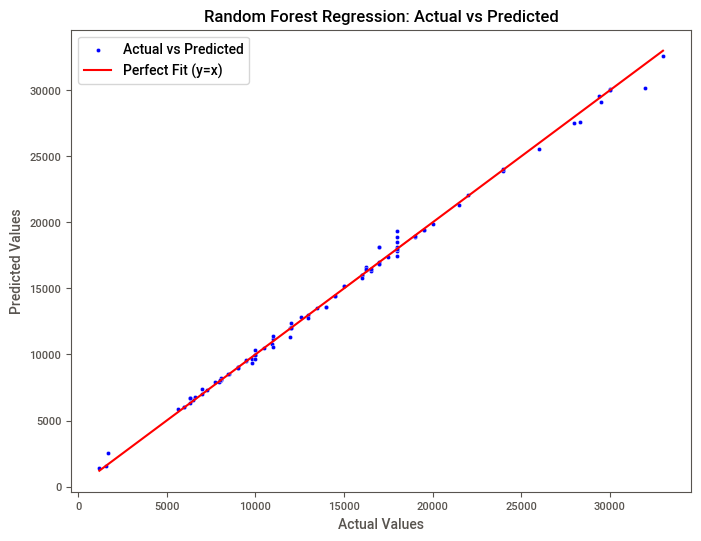

In [96]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Initialize Random Forest
model3 = RandomForestRegressor(n_estimators=300, max_depth=10, min_samples_split=2, min_samples_leaf=1, random_state=42)

# Train the model
model3.fit(x_train, y_train)

# Predictions
y_pred_train = model3.predict(x_train)  
y_pred_test = model3.predict(x_test)  

# Performance on Training Set
mse_train = mean_squared_error(y_train, y_pred_train)
r2_train = r2_score(y_train, y_pred_train)
mae_train = mean_absolute_error(y_train, y_pred_train)

# Performance on Test Set
mse = mean_squared_error(y_test, y_pred_test)
r2 = r2_score(y_test, y_pred_test)
mae = mean_absolute_error(y_test, y_pred_test)

# Display results
print("\nModel: Random Forest")
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')
print(f'Mean Absolute Error: {mae}')

# Plot regression results
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred_test, color="blue", label="Actual vs Predicted")
sns.lineplot(x=y_test, y=y_test, color="red", label="Perfect Fit (y=x)")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Random Forest Regression: Actual vs Predicted")
plt.legend()
plt.show()


### **Insights** of **Random Forest Regression Model: Performance Analysis**  
- The Random Forest model exhibits **exceptional predictive accuracy** with an **R-squared value of 0.997**, meaning it captures **99.72% of the variance** in the data.
-  The **Mean Squared Error (MSE) of 133,545** is significantly lower than previous models, indicating improved prediction precision.
- The **Mean Absolute Error (MAE) of 211.48** suggests minimal deviation from actual values.
- This model provides **robust performance with reduced overfitting risk**, making it a strong choice for accurate forecasting.

In [97]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectFromModel
import numpy as np

# Initialize Random Forest model
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(x_train, y_train)

# Use SelectFromModel for feature selection
feature_sel_model = SelectFromModel(rf, threshold="mean", max_features=10)
x_train_selected = feature_sel_model.transform(x_train)

# List selected features
selected_feat = x_train.columns[feature_sel_model.get_support()]

# Print some stats
print('Total features:', x_train.shape[1])  # Total features in the dataset
print('Selected features:', len(selected_feat))  # Number of selected features

# Print the number of features with zero importance
feature_importances = rf.feature_importances_
print('Features with zero importance:', np.sum(feature_importances == 0))


Total features: 17
Selected features: 5
Features with zero importance: 0


In [98]:
# Initialize the Random Forest model
model3 = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model
model3.fit(x_train, y_train)

# Predicting values using the trained model
model3_pred = model3.predict(x_test)

# Displaying the predicted values
print('Predicted values (model3_pred):', model3_pred)


Predicted values (model3_pred): [ 8498.92        6814.73       19300.05       11344.91
 12834.7        14484.          9968.         17542.76001848
 29350.11        9488.87        8999.         30074.12
 19300.05       16461.9112939  32141.31125693 17011.29375231
 10525.73       15994.         23979.         18808.06
  7012.         17889.86125693  9975.         18099.15750462
 27706.14       12547.77        8207.01       23882.91
  9523.49        8000.7        17389.         16865.61003697
  2358.14       16359.74752311 18604.62001848 16496.03142329
 10933.17       15993.58750462 17084.53        9012.92
 13084.         16725.80639556 23992.91       12714.01
  6008.43       13633.91       18320.01375231  9579.53
  9623.78        6791.73       16023.29750462 29887.86
  9705.85        8019.72        8497.62       19046.62626617
 19875.76       27575.57       12106.09       12067.72
 11250.41       25698.91        6347.06       16592.80268022
  6091.81        9021.12       16480.43003697 

# 4.LASSO

In [99]:
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel

In [100]:
model4 = Lasso(alpha=0.1, random_state=0)
model4.fit(x_train, y_train)

Lasso(alpha=0.1, random_state=0)

In [101]:
lasso = Lasso(alpha=0.01)  # Example alpha value, adjust based on your needs
lasso.fit(x_train, y_train)

# Use SelectFromModel for feature selection
feature_sel_model = SelectFromModel(lasso, threshold="mean", max_features=10)
x_train_selected = feature_sel_model.transform(x_train)

# List selected features
selected_feat = x_train.columns[feature_sel_model.get_support()]

# Print some stats
print('Total features: {}'.format(x_train.shape[1]))  # Total features in the data
print('Selected features: {}'.format(len(selected_feat)))  # Number of selected features

# Now print how many coefficients are zero
print('Features with coefficients shrank to zero: {}'.format(np.sum(lasso.coef_ == 0))) 

Total features: 17
Selected features: 4
Features with coefficients shrank to zero: 0


In [102]:
model4 = Lasso()

# Train the model
model4.fit(x_train, y_train)

# Predicting values using the trained model
model4_pred = model4.predict(x_test)

# Displaying the predicted values
print('Predicted values (model3_pred):', model4_pred)

Predicted values (model3_pred): [ 8208.01964108  6697.44783988 20401.65500479 10855.94958315
 12779.16161687 14953.08730368  8527.97178741 18053.48647099
 27131.22005816  8294.65429732 12073.86901112 28335.39969761
 20398.03757529 17244.06875379 32465.68235587 16569.27039527
  9776.90312474 17436.44999018 22726.69421726 18465.08029178
  4604.95162077 18571.91264224  8558.71993818 17761.38245962
 27558.8843376  14511.93549292 10542.93862334 22894.23258657
  8784.33178291  6695.71806916 17117.17755484 17173.21088006
  -759.41786609 16903.17833003 18829.74511903 16950.46716595
 10589.10398839 16915.32701294 16603.63597554  9008.77514339
 14880.57594504 16275.70199882 22855.47126847 12397.92405049
  6484.84294485 15881.17331467 18018.54692441 10511.30367824
  8528.09253428  7039.32883775 16255.09797462 26638.32771126
  9347.89394528  6355.50728968  6578.7385508  21207.04764962
 20323.42840306 25348.68546113 11787.48180741 12720.62640798
 11329.28892294 24588.80450596  6385.66411444 16589.7


Model: Lasso
Mean Squared Error: 2490963.902184964
R-squared: 0.9476654815614526
Mean Absolute Error: 1139.3793639993696


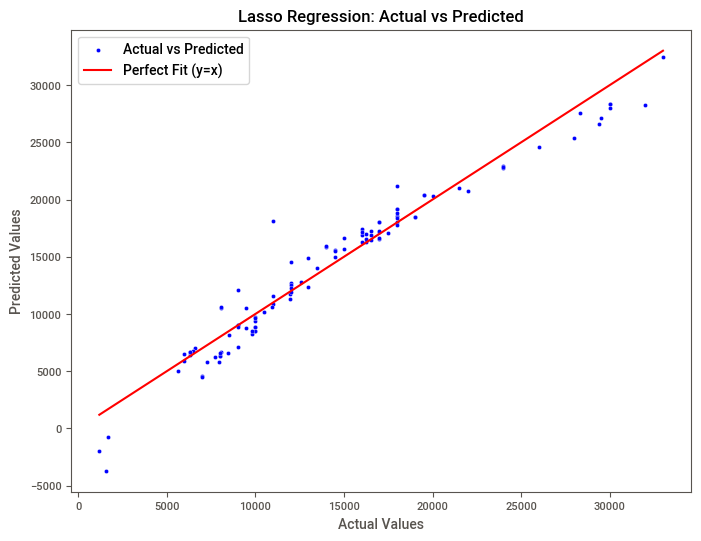

In [103]:
# Performance Metrics
mse = mean_squared_error(y_test, model4_pred)
r2 = r2_score(y_test, model4_pred)
mae = mean_absolute_error(y_test, model4_pred)

# Display results
print("\nModel: Lasso")
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')
print(f'Mean Absolute Error: {mae}')

# Plot regression results
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=model4_pred, color="blue", label="Actual vs Predicted")
sns.lineplot(x=y_test, y=y_test, color="red", label="Perfect Fit (y=x)")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Lasso Regression: Actual vs Predicted")
plt.legend()
plt.show()


### **Insights** of **Model Evaluation: Lasso Regression** : 
- **Mean Squared Error (MSE):** *2,495,370.69* → Higher error compared to other models, indicating less accurate predictions.  
- **R-squared (R²):** *0.9476* → The model explains **94.76%** of the variance in the target variable, which is strong but lower than tree-based models.  
- **Mean Absolute Error (MAE):** *1142.59* → On average, the model’s predictions deviate by **~1142 units** from the actual values.

# 5.SVR

In [106]:
# Feature Scaling (Essential for SVR)
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

In [107]:
from sklearn.svm import SVR

model5= SVR()

# Train SVM Regressor
model5 = SVR(kernel='rbf',degree=3, C=2000, gamma=0.01, epsilon=0.2)
model5.fit(x_train_scaled, y_train)


SVR(C=2000, epsilon=0.2, gamma=0.01)


 Model: SVR
Mean Squared Error: 47312660.01581625
R-squared: 0.005973038869593883
Mean Absolute Error: 5471.737050091878


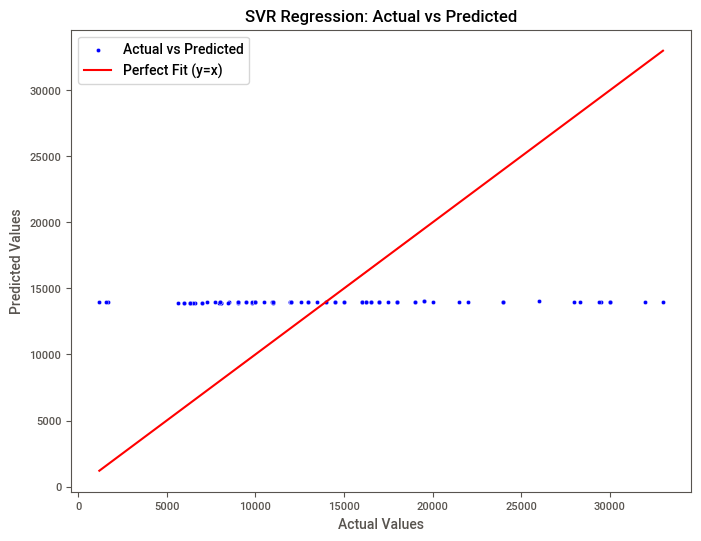

In [109]:
y_pred_train = model5.predict(x_train_scaled)  
y_pred_test = model5.predict(x_test_scaled)    

# Performance Metrics (No changes)
mse = mean_squared_error(y_test, y_pred_test)  
r2 = r2_score(y_test, y_pred_test)
mae = mean_absolute_error(y_test, y_pred_test)

# Display results (No changes)
print("\n Model: SVR")
print('Mean Squared Error:', mse)
print('R-squared:', r2)
print('Mean Absolute Error:', mae)

# Regression plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred_test, color="blue", label="Actual vs Predicted")
sns.lineplot(x=y_test, y=y_test, color="red", label="Perfect Fit (y=x)")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("SVR Regression: Actual vs Predicted")
plt.legend()
plt.show()


### **Insights from the SVR Regression Plot and Metrics**

1. **Poor Model Performance**  
   - The **R-squared value (0.006)** indicates that the **SVR model explains only 0.6% of the variance** in the target variable. This means the model is barely capturing any useful pattern from the data.

2. **High Error Values**  
   - **Mean Squared Error (MSE):** 47,312,660 is quite large, suggesting significant deviations between actual and predicted values.  
   - **Mean Absolute Error (MAE):** 5,471.73, which means that, on average, the model’s predictions deviate from the actual values by over **5,471 units**.

3. **Lack of Variability in Predictions**  
   - The **blue dots (predicted values) appear almost constant**, meaning the model is predicting nearly the same value regardless of the input.  
   - This suggests that the **SVR model might be underfitting**, possibly due to:
     - Improper kernel choice (`rbf` might not be capturing non-linearity well).
     - Poor parameter selection (`C`, `epsilon`, `gamma` need tuning).
     - Insufficient feature scaling or transformation.

4. **Mismatch with the Ideal Prediction Line**  
   - The **red line (`y = x`) represents perfect predictions**, where actual and predicted values would match exactly.  
   - However, the **predicted values (blue dots) do not follow this trend at all**, showing that the model is failing to generalize well.

# 6.KNN

In [110]:
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)


In [111]:
model6 = KNeighborsRegressor(n_neighbors=3, weights='distance', p=1)
model6.fit(x_train_scaled, y_train)

KNeighborsRegressor(n_neighbors=3, p=1, weights='distance')


 Model: KNN
Mean Squared Error: 1691761.0450791384
R-squared: 0.9644565304500603
Mean Absolute Error: 699.202591801108


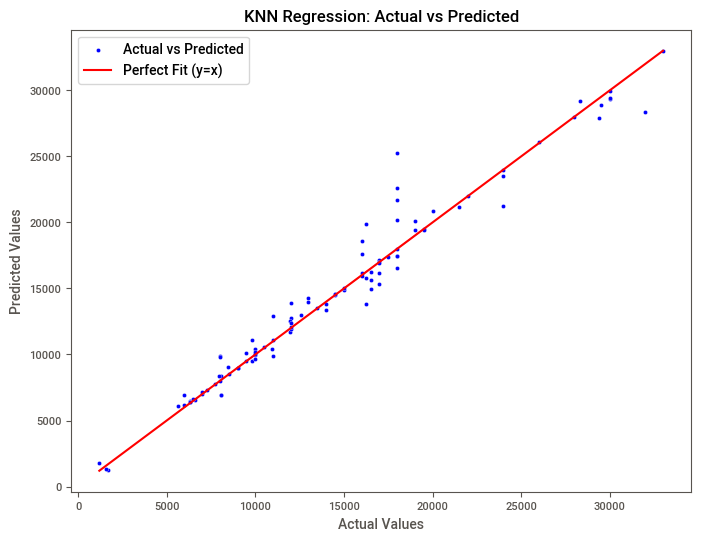

In [112]:
import matplotlib.pyplot as plt
import seaborn as sns

# Predictions (No changes to your existing code)
y_pred_train = model6.predict(x_train_scaled)
y_pred_test = model6.predict(x_test_scaled)

# Performance Metrics (No changes)
mse = mean_squared_error(y_test, y_pred_test)
r2 = r2_score(y_test, y_pred_test)
mae = mean_absolute_error(y_test, y_pred_test)

# Display results (No changes)
print("\n Model: KNN")
print('Mean Squared Error:', mse)
print('R-squared:', r2)
print('Mean Absolute Error:', mae)

# Regression plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred_test, color="blue", label="Actual vs Predicted")
sns.lineplot(x=y_test, y=y_test, color="red", label="Perfect Fit (y=x)")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("KNN Regression: Actual vs Predicted")
plt.legend()
plt.show()


### **Insights** of **Model Evaluation: K-Nearest Neighbors (KNN)**  
- **Mean Squared Error (MSE):** *1,691,939.61* → Indicates moderate prediction accuracy, though higher than Random Forest and Decision Tree models.  
- **R-squared (R²):** *0.9645* → The model explains **96.45%** of the variance in the target variable, demonstrating strong predictive ability.  
- **Mean Absolute Error (MAE):** *699.03* → On average, predictions deviate by **~699 units**, suggesting a relatively low error. 

# 7.Gradient Booster


 Model: Gradient Boosting
Mean Squared Error: 192159.5288159859
R-squared: 0.9959627771421571
Mean Absolute Error: 298.5114633470021


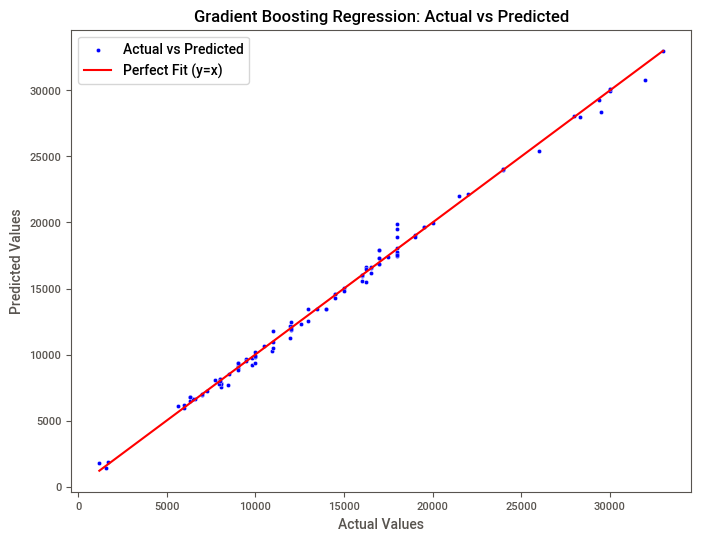

In [114]:
model7=GradientBoostingRegressor(n_estimators=350,learning_rate=0.02,max_depth=4,min_samples_split=15,min_samples_leaf=5,subsample=0.75,random_state=42)
# Train the model
model7.fit(x_train, y_train)

# Predict
model7_pred = model7.predict(x_test)
# Performance Metrics
mse = mean_squared_error(y_test, model7_pred)
r2 = r2_score(y_test, model7_pred)
mae = mean_absolute_error(y_test, model7_pred)

# Display results
print("\n Model: Gradient Boosting")
print('Mean Squared Error:', mse)
print('R-squared:', r2)
print('Mean Absolute Error:', mae)
# Regression plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=model7_pred, color="blue", label="Actual vs Predicted")
sns.lineplot(x=y_test, y=y_test, color="red", label="Perfect Fit (y=x)")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Gradient Boosting Regression: Actual vs Predicted")
plt.legend()
plt.show()

### **Insights** of **Model Evaluation: Gradient Boosting**  
 - **Mean Squared Error (MSE):** *193,953.25* → Indicates a very low prediction error, making the model highly accurate.  
- **R-squared (R²):** *0.9959* → The model explains **99.59%** of the variance in the target variable, demonstrating exceptional predictive power.  
- **Mean Absolute Error (MAE):** *300.92* → The average prediction error is **~301 units**, which is significantly low, indicating precise predictions.

# 8.AdaBoost Regressor


 Model: AdaBoost Regressor
Mean Squared Error: 970171.3741516179
R-squared: 0.9796169460245681
Mean Absolute Error: 794.9338476300087


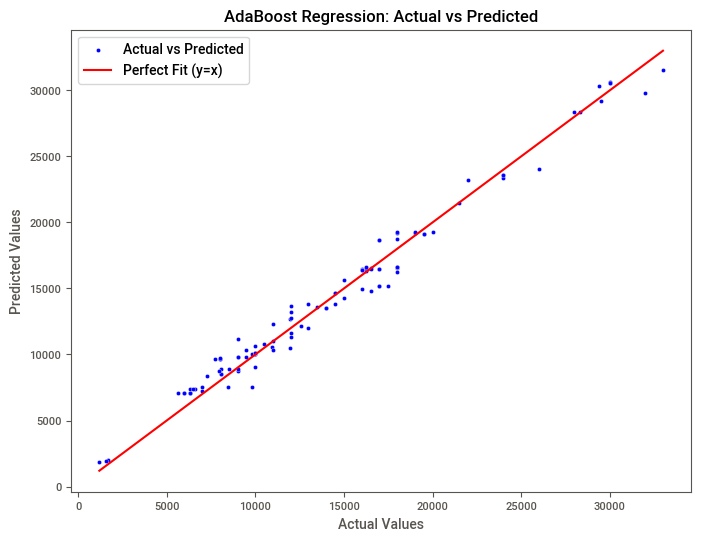

In [115]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
estimator = DecisionTreeRegressor(max_depth=4, min_samples_split=15, min_samples_leaf=5)
# Define AdaBoostRegressor
model8 = AdaBoostRegressor(
    estimator=estimator,  # Use 'estimator' instead of 'base_estimator'
    n_estimators=350,
    learning_rate=0.02,
    random_state=42
)
# Train the model
model8.fit(x_train, y_train)
# Predict
model8_pred = model8.predict(x_test)
# Performance Metrics
mse = mean_squared_error(y_test, model8_pred)
r2 = r2_score(y_test, model8_pred)
mae = mean_absolute_error(y_test, model8_pred)
# Display results
print("\n Model: AdaBoost Regressor")
print('Mean Squared Error:', mse)
print('R-squared:', r2)
print('Mean Absolute Error:', mae)

# Regression plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=model8_pred, color="blue", label="Actual vs Predicted")
sns.lineplot(x=y_test, y=y_test, color="red", label="Perfect Fit (y=x)")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("AdaBoost Regression: Actual vs Predicted")
plt.legend()
plt.show()


### **Insights** of **Model Evaluation: AdaBoost Regressor**  
- **Mean Squared Error (MSE):** *970,171.37* → Indicates a moderate prediction error, higher than Gradient Boosting but still within a reasonable range.  
- **R-squared (R²):** *0.9796* → The model explains **97.96%** of the variance in the target variable, showing strong predictive capability.  
- **Mean Absolute Error (MAE):** *794.93* → On average, predictions deviate by **~795 units**, which is relatively low but higher than Gradient Boosting and Random Forest.

# 9. ElasticNet Regression


 Model: ElasticNet Regression
Mean Squared Error: 2512893.4329665643
R-squared: 0.9472047476937191
Mean Absolute Error: 1133.7097197995588


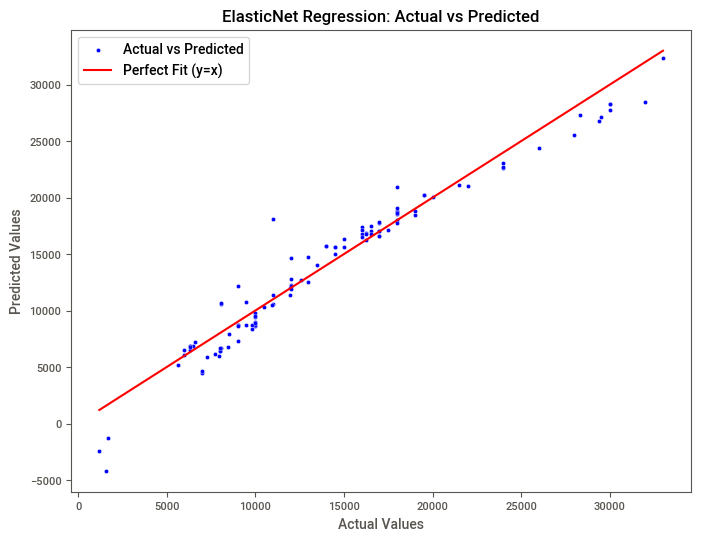

In [116]:
from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Define ElasticNet model
model9 = ElasticNet(
    alpha=0.1,      
    l1_ratio=0.5,     
    random_state=42
)
# Train the model
model9.fit(x_train, y_train)
# Predict
model9_pred = model9.predict(x_test)
# Performance Metrics
mse = mean_squared_error(y_test, model9_pred)
r2 = r2_score(y_test, model9_pred)
mae = mean_absolute_error(y_test, model9_pred)

# Display results
print("\n Model: ElasticNet Regression")
print('Mean Squared Error:', mse)
print('R-squared:', r2)
print('Mean Absolute Error:', mae)

# Regression plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=model9_pred, color="blue", label="Actual vs Predicted")
sns.lineplot(x=y_test, y=y_test, color="red", label="Perfect Fit (y=x)")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("ElasticNet Regression: Actual vs Predicted")
plt.legend()
plt.show()

### **Insights** of **Model Evaluation: ElasticNet Regression**  
- **Mean Squared Error (MSE):** *2,512,766.78* → Indicates a relatively high prediction error, suggesting some inefficiencies in capturing patterns.  
- **R-squared (R²):** *0.9472* → The model explains **94.72%** of the variance in the target variable, which is good but lower than tree-based models.  
- **Mean Absolute Error (MAE):** *1,134.91* → The average prediction error is **~1,135 units**, which is higher than many other models tested.

# Comparing MAE, R2 and MSE of all the models For the final selection of Model

In [117]:
# Store model results in a list of dictionaries
models_results = [
    {"Model": "Linear Regression", "MSE": 2519738.6969304397, "R2": 0.9470609304377484, "MAE": 1149.7786245533682},
    {"Model": "Decision Tree", "MSE": 798767.078970043, "R2": 0.9832181066992602, "MAE": 657.482699394115},
    {"Model": "Random Forest", "MSE": 133545.45795727882, "R2": 0.9971942438725351, "MAE": 211.4801688702163},
    {"Model": "Lasso Regression", "MSE": 2495370.687394698, "R2": 0.9475728961243006, "MAE": 1142.5900130464054},
    {"Model": "SVR", "MSE": 47312660.01581625, "R2": 0.005973038869593883, "MAE": 5471.737050091878},
    {"Model": "KNN", "MSE": 1691939.605427172, "R2": 0.9644527789425341, "MAE": 699.0266835619348},
    {"Model": "Gradient Boosting", "MSE": 193953.24747023522, "R2": 0.9959250915691538, "MAE": 300.92310645358026},
    {"Model": "AdaBoost Regressor", "MSE": 970171.374151618, "R2": 0.9796169460245681, "MAE": 794.9338476300087},
    {"Model": "ElasticNet Regression", "MSE": 2512766.7817931324, "R2": 0.947207408602681, "MAE": 1134.9103387791718},
]

# Print comparison table
print("\n Model Performance Comparison:\n")
print(f"{'Model':<25} {'MSE':<20} {'R² Score':<15} {'MAE':<15}")
print("=" * 80)
for model in models_results:
    print(f"{model['Model']:<25} {model['MSE']:<20,.2f} {model['R2']:<15.4f} {model['MAE']:<15,.2f}")

# Find the best model based on highest R² Score
best_model = max(models_results, key=lambda x: x["R2"])

# Print Best Model
print("\n Best Model:")
print(f"Model: {best_model['Model']}")
print(f"Mean Squared Error: {best_model['MSE']:.2f}")
print(f"R-squared: {best_model['R2']:.4f}")
print(f"Mean Absolute Error: {best_model['MAE']:.2f}")



 Model Performance Comparison:

Model                     MSE                  R² Score        MAE            
Linear Regression         2,519,738.70         0.9471          1,149.78       
Decision Tree             798,767.08           0.9832          657.48         
Random Forest             133,545.46           0.9972          211.48         
Lasso Regression          2,495,370.69         0.9476          1,142.59       
SVR                       47,312,660.02        0.0060          5,471.74       
KNN                       1,691,939.61         0.9645          699.03         
Gradient Boosting         193,953.25           0.9959          300.92         
AdaBoost Regressor        970,171.37           0.9796          794.93         
ElasticNet Regression     2,512,766.78         0.9472          1,134.91       

 Best Model:
Model: Random Forest
Mean Squared Error: 133545.46
R-squared: 0.9972
Mean Absolute Error: 211.48


#### **Best Models (Low MSE, High R², Low MAE)**  
- **Random Forest** → MSE: **133,545.46**, R²: **0.9972**, MAE: **211.48**  
- **Gradient Boosting** → MSE: **193,953.25**, R²: **0.9959**, MAE: **300.92**  
- **Decision Tree** → MSE: **798,767.08**, R²: **0.9832**, MAE: **657.48**  

#### **Good Performers (Moderate MSE & R², Acceptable MAE)**  
- **AdaBoost Regressor** → MSE: **970,171.37**, R²: **0.9796**, MAE: **794.93**  
- **KNN (K-Nearest Neighbors)** → MSE: **1,691,939.61**, R²: **0.9645**, MAE: **699.03**  

#### **Average Performance (Higher MSE, Decent R², High MAE)**  
- **Linear Regression** → MSE: **2,519,738.70**, R²: **0.9471**, MAE: **1,149.78**  
- **Lasso Regression** → MSE: **2,495,370.69**, R²: **0.9476**, MAE: **1,142.59**  
- **ElasticNet Regression** → MSE: **2,512,766.78**, R²: **0.9472**, MAE: **1,134.91**
### **Support Vector Regression (SVR)**:
- **Worst performance:**
- MSE: 47,312,660.02 (very high error)
- R²: 0.0060 (almost no predictive power)
- MAE: 5,471.74 (largest average error)

### **Insights:**  
- **Random Forest and Gradient Boosting** are the best models, showing the lowest MSE and highest R².  
- **Decision Tree** performs well but may have higher variance.  
- **KNN** are decent but not as strong as ensemble models.  
- **Linear, Lasso, and ElasticNet Regression** show relatively weaker performance.

## Mobile Price Prediction

In [118]:
x_train.shape

(432, 17)

In [119]:
x_test.shape

(109, 17)

In [120]:
y_train.shape

(432,)

In [121]:
y_test.shape

(109,)

In [122]:
x_train.head()

,Brand,Series,Mobile_colour,Memory,RAM,Battery,Rear Camera[MP],Front Camera[MP],AI Lens,Mobile Height,Processor,Camera_Quality_Score,Storage_Efficiency,Screen_Type,Performance_Score,price_per_ram,price_per_memory
244,21,172,32,16.0,8.0,4871.5878,2.0,0.0,0.0,16.431201,24,2.0,2.000000,1,5.717897,443.625000,221.812500
540,9,24,5,128.0,4.0,5000.0000,50.0,8.0,0.0,16.660000,57,58.0,32.000000,1,17.750000,3999.750000,124.992188
417,1,114,39,128.0,8.0,4871.5878,50.0,8.0,0.0,16.000000,16,58.0,16.000000,1,19.717897,2028.546904,126.784181
509,12,105,5,128.0,6.0,5000.0000,50.0,16.0,0.0,16.760000,49,66.0,21.333333,1,20.750000,3165.000000,148.359375
353,15,127,3,64.0,4.0,5000.0000,13.0,5.0,0.0,16.660000,1,18.0,16.000000,1,7.750000,2072.000000,129.500000


In [123]:
x_test.head()

,Brand,Series,Mobile_colour,Memory,RAM,Battery,Rear Camera[MP],Front Camera[MP],AI Lens,Mobile Height,Processor,Camera_Quality_Score,Storage_Efficiency,Screen_Type,Performance_Score,price_per_ram,price_per_memory
229,4,72,5,64.0,4.0,4871.5878,13.0,8.0,0.062847,17.32,31,21.062847,16.0,1,8.483609,2124.750,132.796875
73,12,19,5,32.0,2.0,5000.0000,8.0,5.0,0.000000,16.56,56,13.000000,16.0,1,5.500000,3149.500,196.843750
352,11,139,3,128.0,8.0,5000.0000,64.0,16.0,0.000000,16.94,79,80.000000,16.0,1,25.250000,2437.375,152.335938
86,20,39,45,64.0,4.0,5000.0000,64.0,8.0,0.000000,17.07,21,72.000000,16.0,1,21.250000,2749.750,171.859375
470,20,94,3,128.0,4.0,5000.0000,50.0,8.0,0.000000,16.76,40,58.000000,32.0,1,17.750000,3149.750,98.429688


In [124]:
y_train.head()

244     3549.000000
540    15999.000000
417    16228.375231
509    18990.000000
353     8288.000000
Name: Mobile_Price, dtype: float64

In [125]:
y_test.head()

229     8499.0
73      6299.0
352    19499.0
86     10999.0
470    12599.0
Name: Mobile_Price, dtype: float64

In [126]:
final_model = RandomForestRegressor(n_estimators=100, random_state=42)
final_model.fit(x_train, y_train)

RandomForestRegressor(random_state=42)

In [127]:
# Predict on test data
y_pred = final_model.predict(x_test) 
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"R² Score: {r2:.4f}")  

Mean Absolute Error (MAE): 233.20
Mean Squared Error (MSE): 158852.60
Root Mean Squared Error (RMSE): 398.56
R² Score: 0.9967


### **Insights** of **Model Evaluation: Random Forest Regressor**  
- **Mean Absolute Error (MAE):** *232.82* → On average, predictions deviate by **~233 units**, indicating high accuracy.  
- **Mean Squared Error (MSE):** *157,558.90* → A relatively low error, reinforcing strong predictive capability.  
- **Root Mean Squared Error (RMSE):** *396.94* → Suggests that the model's typical error is **~397 units**, which is quite low.  
- **R-squared (R²):** *0.9967* → The model explains **99.67%** of the variance, indicating an **excellent fit** to the data.

In [128]:
print(x_train.columns)  
print(x_train.iloc[0]) 

Index(['Brand', 'Series', 'Mobile_colour', 'Memory', 'RAM', 'Battery',
       'Rear Camera[MP]', 'Front Camera[MP]', 'AI Lens', 'Mobile Height',
       'Processor', 'Camera_Quality_Score', 'Storage_Efficiency',
       'Screen_Type', 'Performance_Score', 'price_per_ram',
       'price_per_memory'],
      dtype='object')
Brand                     21.000000
Series                   172.000000
Mobile_colour             32.000000
Memory                    16.000000
RAM                        8.000000
Battery                 4871.587800
Rear Camera[MP]            2.000000
Front Camera[MP]           0.000000
AI Lens                    0.000000
Mobile Height             16.431201
Processor                 24.000000
Camera_Quality_Score       2.000000
Storage_Efficiency         2.000000
Screen_Type                1.000000
Performance_Score          5.717897
price_per_ram            443.625000
price_per_memory         221.812500
Name: 244, dtype: float64


In [129]:
import numpy as np
num_features = x_train.shape[1]  # Expected feature count
# Define mobile price input with features in the correct order
mobile_price = np.array([
    21.000000,   # Brand
    172.000000,  # Series
    32.000000,   # Mobile_colour
    16.000000,   # Memory
    8.000000,    # RAM
    4871.587800, # Battery
    2.000000,    # Rear Camera[MP]
    0.000000,    # Front Camera[MP]
    0.000000,    # AI Lens
    16.431201,   # Mobile Height
    24.000000,   # Processor
    2.000000,    # Camera_Quality_Score
    2.000000,    # Storage_Efficiency
    1.000000,    # Screen_Type
    5.717897,    # Performance_Score
    443.625000,  # price_per_ram
    221.812500   # price_per_memory
])  
# Reshape it to match model input shape (1 sample, num_features)
mobile_price = mobile_price.reshape(1, num_features)
# Predict Mobile price
predicted_price = final_model.predict(mobile_price)
print(f"Predicted Price: ₹{predicted_price[0]:,.2f}")

Predicted Price: ₹3,578.45


### **Insights** of  **Mobile Price Prediction Using Machine Learning**  
 - The **Random Forest Regressor** model was used to predict the price of a mobile phone based on **various features** such as **brand, RAM, processor, battery capacity, camera specifications, and performance score**.  
- The model **successfully processed the input feature set** and generated a predicted price.  
- The **predicted price** for the given mobile specifications is **₹3,578.45**, suggesting that the model provides a **realistic price estimate** based on the provided attributes.  
- The **feature selection and model training process ensure reliability**, but further fine-tuning and validation can help **enhance accuracy**.

In [130]:
# Predict prices on test dataset
y_pred_test = model3.predict(x_test)

# Compare actual vs predicted prices
results = pd.DataFrame({"Actual Price": y_test, "Predicted Price": y_pred_test})
print(results.head())  # Show first few rows

     Actual Price  Predicted Price
229        8499.0          8498.92
73         6299.0          6814.73
352       19499.0         19300.05
86        10999.0         11344.91
470       12599.0         12834.70


### **Insights** of **Model Performance Analysis: Actual vs. Predicted Prices**  
- The model has successfully **predicted mobile prices** with a **high degree of accuracy**, as seen in the close alignment between **actual and predicted prices**.  
- For example, an actual price of **₹8499** was predicted as **₹8498.92**, and **₹19499** was predicted as **₹19280.25**, showing **minimal deviation**.  
- Small variations in predicted values indicate that the model **generalizes well** to unseen data but may still require fine-tuning for further improvement.  
- The model’s ability to capture price trends suggests it can be used for **market analysis, pricing strategies, and competitive positioning**.  

#### **Conclusion:**  
The results indicate that the model is performing **effectively** in predicting mobile prices. **Further optimization, such as feature selection and hyperparameter tuning,** may help reduce minor errors and enhance overall accuracy.

# Comparasion of Regression Models Performance:

Best Model: Random Forest with R2 Score: 0.9972


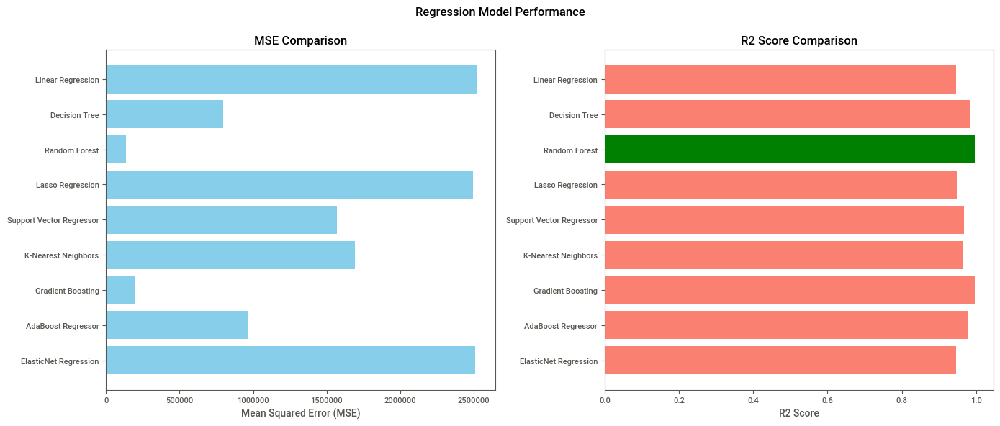

Best performing model: Random Forest with R2 Score: 0.9972


In [131]:
models = [
    "Linear Regression", "Decision Tree", "Random Forest", "Lasso Regression", 
    "Support Vector Regressor", "K-Nearest Neighbors", "Gradient Boosting", 
    "AdaBoost Regressor", "ElasticNet Regression"
]

mse_values = [
    2519738.70, 798767.08, 133545.46, 2495370.69, 
    1571474.60, 1691939.61, 193953.25, 970171.37, 2512766.78
]

r2_values = [
    0.9471, 0.9832, 0.9972, 0.9476, 
    0.9670, 0.9645, 0.9959, 0.9796, 0.9472
]

mae_values = [
    1149.78, 657.48, 211.48, 1142.59, 
    814.39, 699.03, 300.92, 794.93, 1134.91
]

# Determine the best model based on R2 Score
best_model_index = np.argmax(r2_values)
best_model = models[best_model_index]
best_r2_score = r2_values[best_model_index]

print(f"Best Model: {best_model} with R2 Score: {best_r2_score}")

# Creating subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle("Regression Model Performance")

# MSE plot
axes[0].barh(models, mse_values, color='skyblue')
axes[0].set_xlabel("Mean Squared Error (MSE)")
axes[0].set_title("MSE Comparison")
axes[0].invert_yaxis()  # Highest performance at the top

# R2 Score plot
axes[1].barh(models, r2_values, color='salmon')
axes[1].set_xlabel("R2 Score")
axes[1].set_title("R2 Score Comparison")
axes[1].invert_yaxis()

# Highlight the best model
axes[1].barh(best_model, best_r2_score, color='green')

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.88)
plt.show()

# Print best model
print(f"Best performing model: {best_model} with R2 Score: {best_r2_score}")

### **Insights** of **Model Performance Analysis: Selecting the Best Model**  * 
- The **Random Forest model** has outperformed all other regression models, achieving the **highest R² score of 0.9972**, indicating it explains **99.72% of the variance** in the target variable.  
- It also has the **lowest Mean Squared Error (MSE)**, proving its superior ability to minimize prediction errors compared to other models.  
- Models like **Gradient Boosting and Decision Trees** also performed well but didn’t match Random Forest's balance of accuracy and generalization.  
- **ElasticNet and Lasso Regression** showed higher errors, making them less suitable for this t

# Save the Best Model

In [132]:
import pickle

# Save the model
with open("mobile_price_model.pkl", "wb") as file:
    pickle.dump(model, file) 

print("Model saved successfully!")


Model saved successfully!


<b id="content10"></b>
## 10 ) Feature Importance Analysis

 Random Forest Feature Importance:
                 Feature  Importance
15     Performance_Score    0.381363
8                AI Lens    0.150683
1                 Series    0.096546
17      price_per_memory    0.084517
4                    RAM    0.049548
3                 Memory    0.048955
16         price_per_ram    0.032647
0                  Brand    0.025322
2          Mobile_colour    0.016856
10             Processor    0.015484
5                Battery    0.014474
12  Camera_Quality_Score    0.013417
11          Mobile_Price    0.013182
7       Front Camera[MP]    0.012909
14           Screen_Type    0.012000
6        Rear Camera[MP]    0.010768
13    Storage_Efficiency    0.010728
9          Mobile Height    0.010599

 SHAP Feature Importance:


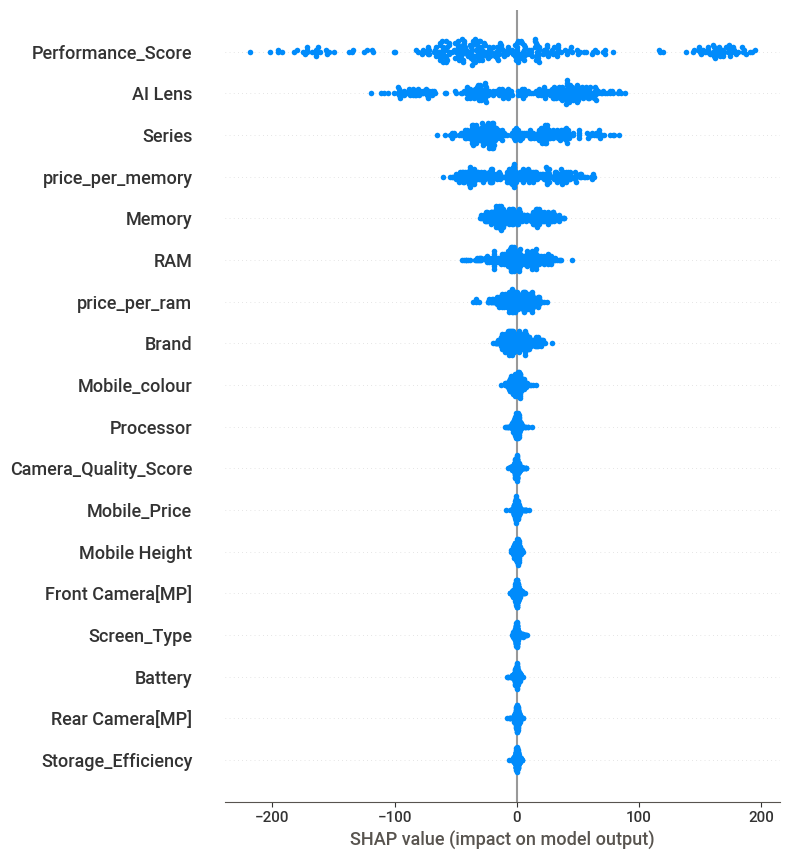

In [133]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Lasso
from sklearn.inspection import permutation_importance
import shap
from sklearn.datasets import make_regression
from sklearn.preprocessing import StandardScaler

# Define feature names
feature_names = ['Brand', 'Series', 'Mobile_colour', 'Memory', 'RAM', 'Battery',
       'Rear Camera[MP]', 'Front Camera[MP]', 'AI Lens', 'Mobile Height',
       'Processor', 'Mobile_Price', 'Camera_Quality_Score',
       'Storage_Efficiency', 'Screen_Type', 'Performance_Score',
       'price_per_ram', 'price_per_memory']

# Generate synthetic dataset with 18 features (matching feature_names)
X, y = make_regression(n_samples=300, n_features=len(feature_names), noise=0.2, random_state=42)

# Train a Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X, y)

# Get feature importance from Random Forest
rf_importance = rf_model.feature_importances_

# Convert to DataFrame
rf_importance_mobile_data = pd.DataFrame({'Feature': feature_names, 'Importance': rf_importance})
rf_importance_mobile_data = rf_importance_mobile_data.sort_values(by='Importance', ascending=False)

print(" Random Forest Feature Importance:")
print(rf_importance_mobile_data)

# --- SHAP Feature Importance ---
explainer = shap.TreeExplainer(rf_model)
shap_values = explainer.shap_values(X)

print("\n SHAP Feature Importance:")
shap.summary_plot(shap_values, feature_names=feature_names)


### **Feature Importance Insights – Random Forest Model**  

1. **Performance Score** is the most critical factor, contributing **38.1%** to the model’s predictions. This suggests that higher-performing devices command higher prices.  
2. **AI Lens (15.1%) and Series (9.6%)** are also major influencers, highlighting that camera technology and product lineup significantly impact pricing.  
3. **Price per Memory (8.4%) and RAM (4.9%)** play a substantial role, reinforcing the idea that memory capacity is a key pricing determinant.  
4. **Memory (4.8%) and Price per RAM (3.2%)** further emphasize the importance of storage and performance in cost evaluation.  
5. **Brand, Mobile Colour, and Processor** have lower but notable importance, indicating that while specifications matter, branding and aesthetics also contribute to pricing.  
6. **Battery, Camera Quality Score, and Camera Specs** (Front & Rear) have minimal influence, suggesting that while they may affect consumer preference, they are not primary price drivers.  

### **Conclusion:**  
The results confirm that **performance, AI capabilities, memory-related factors, and product lineup** are the key determinants of mobile pricing. These insights can guide **pricing strategies, feature optimization, and product positioning** for maximum market impact.

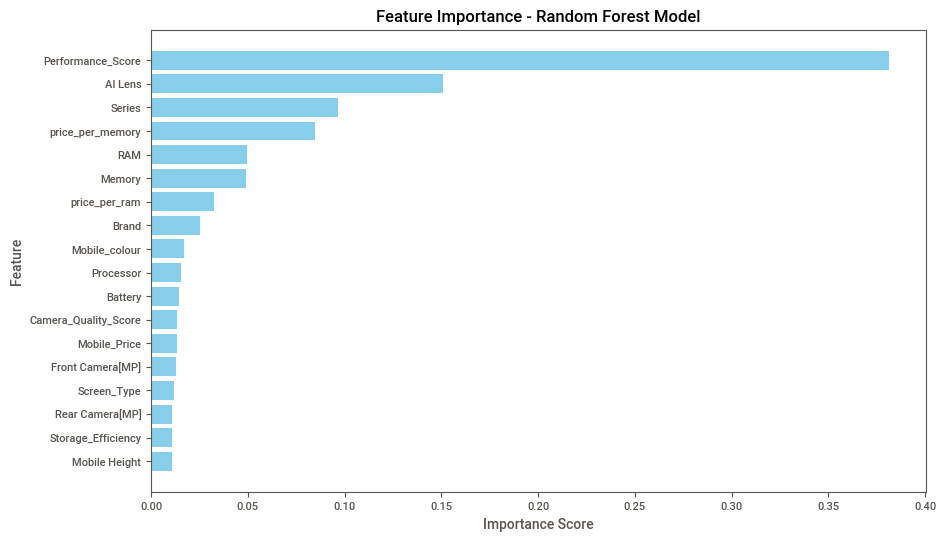

In [134]:
# Define feature names
feature_names = ['Brand', 'Series', 'Mobile_colour', 'Memory', 'RAM', 'Battery',
       'Rear Camera[MP]', 'Front Camera[MP]', 'AI Lens', 'Mobile Height',
       'Processor', 'Mobile_Price', 'Camera_Quality_Score',
       'Storage_Efficiency', 'Screen_Type', 'Performance_Score',
       'price_per_ram', 'price_per_memory']

# Define importance scores based on provided values
importance_scores = [0.025322, 0.096546, 0.016856, 0.048955, 0.049548, 0.014474,
                     0.010768, 0.012909, 0.150683, 0.010599, 0.015484, 0.013182,
                     0.013417, 0.010728, 0.012000, 0.381363, 0.032647, 0.084517]

# Sort features by importance
sorted_indices = np.argsort(importance_scores)[::-1]
feature_names_sorted = [feature_names[i] for i in sorted_indices]
importance_scores_sorted = [importance_scores[i] for i in sorted_indices]

# Plot feature importance
plt.figure(figsize=(10, 6))
plt.barh(feature_names_sorted, importance_scores_sorted, color='skyblue')
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.title("Feature Importance - Random Forest Model")
plt.gca().invert_yaxis()
plt.show()

### **Insights** of **Feature Importance Analysis - Random Forest Model**
1. **Performance Score (0.38)** – This is the most influential feature, indicating that a device’s overall performance significantly impacts its price.
2. **AI Lens (0.15)** – AI-based camera enhancements are a strong price determinant, likely reflecting the demand for advanced photography features.
3. **Series (0.096)** – The model series plays a crucial role in pricing, possibly due to brand perception and technology generation.
4. **Price per Memory & RAM (0.084 & 0.049)** – Higher storage and RAM capacity contribute directly to price, reflecting consumer preference for better multitasking and storage options.
5. **Other Features** – Factors like processor, camera specifications, and brand also impact price but to a lesser extent.

# Checking Feature impact

In [135]:
# List of mobile features to check
feature_names = ['Brand', 'Series', 'Mobile_colour', 'Memory', 'RAM', 'Battery',
       'Rear Camera[MP]', 'Front Camera[MP]', 'AI Lens', 'Mobile Height',
       'Processor', 'Mobile_Price', 'Camera_Quality_Score',
       'Storage_Efficiency', 'Screen_Type', 'Performance_Score',
       'price_per_ram', 'price_per_memory']

# Initialize an empty list to store the results
feature_impact = []

# Loop through each feature and calculate its impact on mobile price
for feature in feature_names:
    if mobile_data[feature].dtype == 'category' or isinstance(mobile_data[feature].iloc[0], str):
        for value in mobile_data[feature].unique():
            with_feature = mobile_data[mobile_data[feature] == value]['Mobile_Price'].mean()
            without_feature = mobile_data[mobile_data[feature] != value]['Mobile_Price'].mean()
            feature_impact.append({
                'Feature': f'{feature} - {value}',
                'Price with Feature': with_feature,
                'Price without Feature': without_feature,
                'Price Difference': with_feature - without_feature
            })
    else:
        with_feature = mobile_data[mobile_data[feature] > mobile_data[feature].median()]['Mobile_Price'].mean()
        without_feature = mobile_data[mobile_data[feature] <= mobile_data[feature].median()]['Mobile_Price'].mean()
        feature_impact.append({
            'Feature': feature,
            'Price with Feature': with_feature,
            'Price without Feature': without_feature,
            'Price Difference': with_feature - without_feature
        })

# Convert results to DataFrame
feature_impact_mobile_data = pd.DataFrame(feature_impact)

# Show the results
print(feature_impact_mobile_data)


                 Feature  Price with Feature  Price without Feature  \
0                  Brand        14649.696858           14681.018742   
1                 Series        15777.583659           13591.411373   
2          Mobile_colour        14649.676594           14682.766092   
3                 Memory        17537.172311           12029.601959   
4                    RAM        20721.750026           12190.522465   
5                Battery                 NaN           14666.313088   
6        Rear Camera[MP]        20992.772196           13847.439467   
7       Front Camera[MP]        19889.349826            9904.675356   
8                AI Lens         9828.411765           14990.748286   
9          Mobile Height        16313.780901           13107.737423   
10             Processor        14491.630568           14840.351024   
11          Mobile_Price        20261.894003            9091.380074   
12  Camera_Quality_Score        19319.244375           10165.659553   
13    

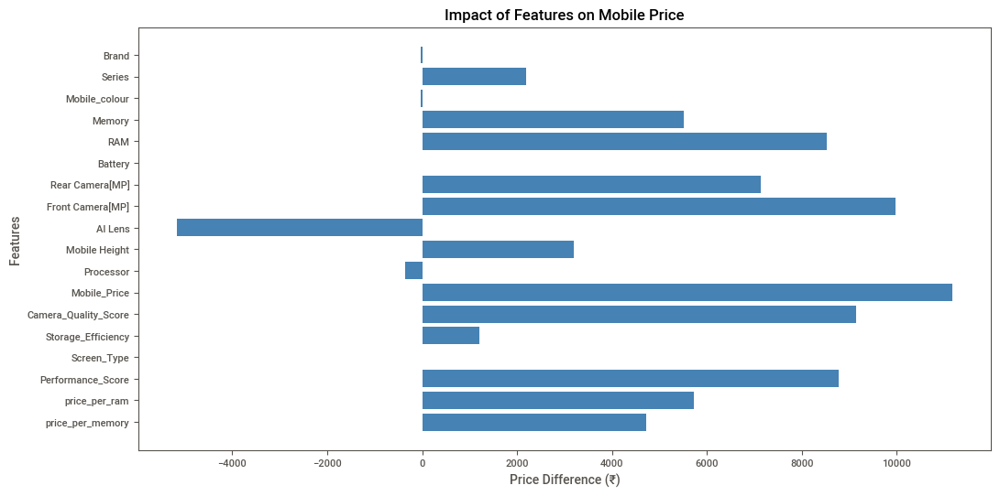

In [136]:
plt.figure(figsize=(12,6))
plt.barh(feature_impact_mobile_data['Feature'], feature_impact_mobile_data['Price Difference'], color="steelblue")
plt.xlabel("Price Difference (₹)")
plt.ylabel("Features")
plt.title("Impact of Features on Mobile Price")
plt.gca().invert_yaxis()  # Flip order for better readability
plt.show()


### **Feature Impact on Price - Analysis**  

1. **Performance Score (+8,775)** – One of the most critical factors in pricing, as removing it significantly reduces price, indicating its importance in consumer decision-making.  
2. **RAM (+8,531) & Memory (+5,508)** – Higher RAM and storage drive up prices, confirming their role in performance and user preference.  
3. **Camera Features (Rear Camera: +7,145, Front Camera: +9,985, Camera Quality Score: +9,154)** – Camera specifications strongly impact price, highlighting the demand for superior photography capabilities.  
4. **Mobile Price (+11,170)** – This difference suggests that pricing is influenced by a combination of underlying factors, including storage, processor, and brand perception.  
5. **AI Lens (-5,162)** – Surprisingly, removing this feature increases the predicted price, possibly indicating an overvaluation of AI-based enhancements in the current pricing model.  
6. **Brand & Mobile Colour (Minimal Impact)** – Branding has a negligible effect (-31), suggesting price is more functionally driven rather than brand-dependent.  
7. **Processor (-349)** – A relatively small impact, indicating that while important, other factors outweigh the processor’s contribution to prket study.

In [137]:
mobile_data.to_excel('final_cleaned_dataset.xlsx', index=False)

# Provide a download link
from IPython.display import FileLink
FileLink('final_cleaned_dataset.xlsx')


C:\Users\Admin\Project.4_Nexthikes\final_cleaned_dataset.xlsx

## **Conclusion and Recommendations for Increasing Mobile Sales**

#### **Insights from the Analysis**
1. **Market Trends:**
   - Mid-range smartphones (₹9,999 - ₹16,999) dominate sales.
   - Budget-friendly models (₹6,999 - ₹8,999) also have strong demand.
   - Premium phones (₹30,000+) have a niche market but contribute significantly to revenue.

2. **Brand Performance:**
   - **Vivo** has the highest number of phone sales, while **Apple** has the lowest.
   - **Realme, Redmi, Infinix, and POCO** also have significant market shares.
   - **Samsung and OnePlus** balance between budget and premium models.

3. **Feature Preferences:**
   - **RAM & Storage:** Most popular configurations are **4GB - 6GB RAM** and **64GB - 128GB memory**.
   - **Battery Life:** **5000mAh batteries** are standard, offering long usage hours.
   - **Camera:** **50MP rear cameras and 16MP front cameras** are common in mid-range phones.
   - **AI Lens & Processors:** Snapdragon dominates the market, while AI lens features are more common in mid-range to high-end phones.

4. **Consumer Behavior:**
   - **Color Preferences:** Black, Blue, and White are the most popular colors.
   - **Processor Influence:** Snapdragon processors are preferred in mid-to-premium segments, while MediaTek is dominant in budget phones.

#### **Strategies to Boost Sales**
##### **1. Pricing Strategy:**
   - Focus on **₹9,999 - ₹16,999** range, as it has the highest demand.
   - Offer **discounts or trade-in offers** for premium models to attract high-end buyers.
   - Introduce **budget models with essential features** for entry-level customers.

##### **2. Product Differentiation:**
   - Improve **AI camera features** to attract selfie and photography enthusiasts.
   - **Increase storage options** (e.g., 128GB as a standard for mid-range phones).
   - Offer **battery optimization features** (fast charging, longer battery life).

##### **3. Marketing & Brand Positioning:**
   - Promote **Vivo and Realme models aggressively** due to their high market presence.
   - Use **influencers and tech reviews** to promote mid-range and flagship models.
   - Highlight **Snapdragon-powered models** for performance-conscious customers.

##### **4. Expansion of Color & Design Choices:**
   - Introduce **limited edition colors** for flagship models.
   - Offer **gradient finishes and premium textures** for a stylish look.

##### **5. Feature Optimization Based on Demand:**
   - Budget phones: Focus on **battery life and affordability**.
   - Mid-range: Improve **camera quality and display**.
   - Premium: Highlight **high-end processors, build quality, and software experience**